Model version 9 is being made here, we are:
•streamlining the notebook, to modularly perform the analysis 
    •using iseq1 for training, using iseq2 and miseq1 for testing
    •SHAP analysis position-wise, pair-wise, and positionally combined SHAP values
    •using the cryptic nonamer for training
    •SHAP and Kolmogorov–Smirnov analysis

Model version 8 is being made here, we are:
We are implimenting more observed statistics during model trainnig, (adding: spearman rank order correlation and RMSE) to the MSE and FVAF we currently monitor.
we are implimenting SHapley Additive exPlanations (SHAP) to help explain the impact of each nucleotide:position variable.

Model version 7 is being made here, we are:
simplifying the code for readability and easy of process,
removing old code unused code,
implimenting built in functions for onehot encoding,
creating stratified K folds to make test indices and constructing folds from them solely.

•Model version 6 is being made here, we are incorporating Holistic N fold Cross Validation, FVAF into model evaluation to formalize cross validation.

•We will then run an experiment of our current models, with current (manual) one hot encoding and an automatic one hot encoding. 

# ███████████████████
# Setting Current Directory
## The Location of Files being Used
# ███████████████████

In [6]:
cd C:\Users\jchar\Documents\Research\Rodger's lab\Research Results\NN RSS Prediction Model\Model 9

C:\Users\jchar\Documents\Research\Rodger's lab\Research Results\NN RSS Prediction Model\Model 9


In [7]:
ls

 Volume in drive C has no label.
 Volume Serial Number is 2863-468B

 Directory of C:\Users\jchar\Documents\Research\Rodger's lab\Research Results\NN RSS Prediction Model\Model 9

07/31/2024  04:55 PM    <DIR>          .
06/04/2024  01:40 PM    <DIR>          ..
09/19/2023  02:50 PM             5,090 12RSS_fasta_RSSsite.txt
09/13/2023  06:20 PM            11,608 12RSS_RIC_script.pl
06/04/2024  01:42 PM    <DIR>          Files to start colab figure notebook
07/25/2024  09:55 AM           788,858 H4S2 NN paper's Pearson r Correlations and figure 3 and 5.docx
07/19/2024  11:21 AM         1,180,747 H4S2_predictions_output.xlsx
06/08/2024  04:24 PM            14,540 hyperparameter_search_hidden_activation_function.xlsx
06/09/2024  08:25 AM             8,755 hyperparameter_search_hidden_bias.xlsx
06/08/2024  05:38 PM            32,903 hyperparameter_search_hidden_layer_architecture.xlsx
06/08/2024  01:29 PM            17,073 hyperparameter_search_lrate.xlsx
06/08/2024  04:53 PM            15

# ███████████████████
# Importing Required Packages
# ███████████████████

In [8]:
import pandas as pd #pandas Version 1.5.3
import numpy as np #numpy Version 1.24.3
import csv
import os
import itertools
import math
import tensorflow as tf #tensorflow Version 2.15.0
from tensorflow import keras #keras Version 2.15.0
from keras.layers import InputLayer, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow_addons as tfa #tensorflow_addons Version 0.22.0
from sklearn.model_selection import train_test_split, StratifiedKFold #scikit-learn Version 1.3.0
from sklearn.metrics import mean_squared_error
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt #matplotlib Version 3.8.3
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
from matplotlib.ticker import FuncFormatter
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.lines import Line2D
from matplotlib.gridspec import GridSpec
from scipy import stats #scipy Version 1.10.1
from scipy.stats import ks_2samp, spearmanr
import seaborn as sns #seaborn Version 0.12.2
import shap #shap Version 0.44.0

C:\Users\jchar\anaconda3\Lib\site-packages\tensorflow_addons\utils\tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
C:\Users\jchar\anaconda3\Lib\site-packages\tensorflow_addons\utils\ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.12.0 and strictly below 2.15.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.15.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure yo

In [66]:
import sys
# Print Python version
print(f"Python Version: {sys.version}")

Python Version: 3.11.4 | packaged by Anaconda, Inc. | (main, Jul  5 2023, 13:38:37) [MSC v.1916 64 bit (AMD64)]


In [64]:
import importlib.metadata

# List of package names you want to check
packages = [
    'pandas',
    'numpy',
    'tensorflow',
    'keras',
    'tensorflow_addons',
    'scikit-learn',
    'matplotlib',
    'scipy',
    'seaborn',
    'shap',
]

# Print the version of each package
for package in packages:
    try:
        version = importlib.metadata.version(package)
        print(f"{package}: {version}")
    except importlib.metadata.PackageNotFoundError:
        print(f"{package} is not installed.")


pandas: 1.5.3
numpy: 1.24.3
tensorflow: 2.15.0
keras: 2.15.0
tensorflow_addons: 0.22.0
scikit-learn: 1.3.0
matplotlib: 3.8.3
scipy: 1.10.1
seaborn: 0.12.2
shap: 0.44.0


# ████████████████████████
# Setting Dataset Files into a Dictionary
## callable datasets, easy to itterate through
# ████████████████████████

In [9]:
# Set up dictionary to store file paths and flanking sequences to be added later
datasets = {
    "iseq1": {"file": "SJ-0 SARP-seq H4-S2 iSeq1.tabular", "additional_sequence": [0, "ACAGACTGGAACAAAAACC"]},
    "iseq2": {"file": "SJ-0 SARP-seq H4-S2 iSeq2.tabular", "additional_sequence": [0, "ACAGACTGGAACAAAAACC"]},
    "miseq1": {"file": "SJ-0 SARP-seq H4-S2 miSeq1.tabular", "additional_sequence": [0, "ACAGACTGGAACAAAAACC"]},
    "pax3_lmo2_crypticnonamer": {"file": "SARP_seq_H4-7S2_cNon_wholeRSS.txt", "additional_sequence": [0, 0]},
    "cf1_crypticnonamer": {"file": "SARP_seq_H4-7S2_cNon_CF1_v2.txt", "additional_sequence": [0, 0]}

}

# Convert the dictionary to a Pandas DataFrame
datasets_df = pd.DataFrame.from_dict(datasets, orient='index')

# Display the table
print(datasets_df)

                                                        file  \
iseq1                      SJ-0 SARP-seq H4-S2 iSeq1.tabular   
iseq2                      SJ-0 SARP-seq H4-S2 iSeq2.tabular   
miseq1                    SJ-0 SARP-seq H4-S2 miSeq1.tabular   
pax3_lmo2_crypticnonamer   SARP_seq_H4-7S2_cNon_wholeRSS.txt   
cf1_crypticnonamer           SARP_seq_H4-7S2_cNon_CF1_v2.txt   

                               additional_sequence  
iseq1                     [0, ACAGACTGGAACAAAAACC]  
iseq2                     [0, ACAGACTGGAACAAAAACC]  
miseq1                    [0, ACAGACTGGAACAAAAACC]  
pax3_lmo2_crypticnonamer                    [0, 0]  
cf1_crypticnonamer                          [0, 0]  


## • Pulling data into dictionary of dataframes

In [10]:
def text_file_to_dataframe(file, delimiter='\t', additional_sequence=[0, 0]):
    """
    Reads a text file into a DataFrame, standardizes column names, and appends sequences as needed.

    Parameters:
    - file (str): The path to the input text file.
    - delimiter (str, optional): The delimiter used in the text file. Default is '\t' (tab).
    - additional_sequence (list of str, optional): A list containing two elements, representing upstream and downstream sequences.
      Default is [0, 0], indicating no additional sequences.

    Returns:
    - pd.DataFrame: A DataFrame containing the processed data.

    Raises:
    - ValueError: If the input file does not have exactly two columns, or if there is an issue with recombination | sequence data columns.
    """

    # Appends flanking sequence with additional sequence
    def append_sequence(sequence, additional_sequence):
        """
        Appends DNA sequences based by adding upstream and downstream elements.

        Parameters:
        - sequence (str): The original DNA sequence.
        - additional_sequence (list of str): A list containing two elements, representing upstream and downstream sequences.

        Returns:
        - str: The modified DNA sequence after appending the additional sequences.
        """
        # Separate appending sequences
        upstream, downstream = map(str, additional_sequence)
        # Append sequence
        if upstream == '0':
            return sequence + downstream
        elif downstream == '0':
            return upstream + sequence
        else:
            return upstream + sequence + downstream

    # Read the text file into a DataFrame
    with open(file, 'r') as f:
        first_line = f.readline().strip()
        has_header = 'Sequence' in first_line or 'Readcount' in first_line or 'Read count' in first_line

    if has_header:
        working_df = pd.read_csv(file, delimiter=delimiter)
    else:
        working_df = pd.read_csv(file, delimiter=delimiter, header=None)

    # Check for the number of columns
    if len(working_df.columns) != 2:
        raise ValueError("The input file should have exactly two columns. [Recombination data | DNA sequence]")

    # Identify numeric columns
    recombination_column = [column for column in working_df.columns if pd.to_numeric(working_df[column], errors='coerce').notna().any()]

    if len(recombination_column) == 0:
        raise ValueError("No recombination data column found. [Recombination data | DNA sequence]")
    elif len(recombination_column) == 2:
        raise ValueError("Both columns are numeric. Please provide one column with DNA sequence. [Recombination data | DNA sequence]")

    # Assume the sequence column is the DNA sequence column
    sequence_column = [column for column in working_df.columns if column not in recombination_column][0]

    # Apply the sequence appending function
    if additional_sequence != [0,0]:
        working_df[sequence_column] = working_df.apply(lambda row: append_sequence(row[sequence_column], additional_sequence), axis=1)

    # Rename columns
    working_df.rename(columns={recombination_column[0]: 'Read count', sequence_column: 'Sequence'}, inplace=True)

    return working_df

# Create an empty dictionary to store DataFrames
result_dataframes = {}

# Iterate through datasets
for index, row in datasets_df.iterrows():
    try:
        df = text_file_to_dataframe(row['file'], additional_sequence=row['additional_sequence'])
        print(f"Dataset: {index}\n")
        print(df.head(2))

        # Store the DataFrame in the dictionary using the dataset index as the key
        result_dataframes[index] = df
    except ValueError as e:
        print(f"Error processing dataset {index}: {e}\n")

Dataset: iseq1

   Read count                      Sequence
0       18982  CACAGTGATACAGACTGGAACAAAAACC
1       15235  CACTATGATACAGACTGGAACAAAAACC
Dataset: iseq2

   Read count                      Sequence
0         961  CACAGTGCTACAGACTGGAACAAAAACC
1         960  CACTGTGTTACAGACTGGAACAAAAACC
Dataset: miseq1

   Read count                      Sequence
0       26810  CACAGTGCTACAGACTGGAACAAAAACC
1       24599  CACTATGATACAGACTGGAACAAAAACC
Dataset: pax3_lmo2_crypticnonamer

   Read count                      Sequence
0        5177  CACGGTGATACAGACTGGACTAAAAACC
1        4709  CACAGTGATACAGACTGGACTAAAAACC
Dataset: cf1_crypticnonamer

    Read count                      Sequence
0  8632.666667  CACTATGATACAGACTGGAACAAAAACC
1  8458.666667  CACTGTGATACAGACTGGAACAAAAACC


## • Separating cryptic nonamer datasets for processing

In [11]:
# Split pax3_lmo2_crypticnonamer into lmo2_crypticnonamer and pax3_crypticnonamer
pax3_lmo2_crypticnonamer_df = result_dataframes['pax3_lmo2_crypticnonamer']

# Define the criteria for splitting based on the last 9 nucleotides
pax3_criteria = pax3_lmo2_crypticnonamer_df['Sequence'].str.endswith('CTAAAAACC')
lmo2_criteria = pax3_lmo2_crypticnonamer_df['Sequence'].str.endswith('TGGAAAATA')

# Apply the criteria to split the DataFrame
pax3_crypticnonamer_df = pax3_lmo2_crypticnonamer_df[pax3_criteria].reset_index(drop=True)
lmo2_crypticnonamer_df = pax3_lmo2_crypticnonamer_df[lmo2_criteria].reset_index(drop=True)

# Add the split datasets to the result_dataframes dictionary
result_dataframes["pax3_crypticnonamer"] = pax3_crypticnonamer_df
result_dataframes["lmo2_crypticnonamer"] = lmo2_crypticnonamer_df

# Remove the original pax3_lmo2_crypticnonamer dataset from the dictionary
del result_dataframes['pax3_lmo2_crypticnonamer']

# Check the resulting dataframes
for dataset_name, dataset_df in result_dataframes.items():
    print(f"\nDataset: {dataset_name}\n")
    print(dataset_df.head(2))


Dataset: iseq1

   Read count                      Sequence
0       18982  CACAGTGATACAGACTGGAACAAAAACC
1       15235  CACTATGATACAGACTGGAACAAAAACC

Dataset: iseq2

   Read count                      Sequence
0         961  CACAGTGCTACAGACTGGAACAAAAACC
1         960  CACTGTGTTACAGACTGGAACAAAAACC

Dataset: miseq1

   Read count                      Sequence
0       26810  CACAGTGCTACAGACTGGAACAAAAACC
1       24599  CACTATGATACAGACTGGAACAAAAACC

Dataset: cf1_crypticnonamer

    Read count                      Sequence
0  8632.666667  CACTATGATACAGACTGGAACAAAAACC
1  8458.666667  CACTGTGATACAGACTGGAACAAAAACC

Dataset: pax3_crypticnonamer

   Read count                      Sequence
0        5177  CACGGTGATACAGACTGGACTAAAAACC
1        4709  CACAGTGATACAGACTGGACTAAAAACC

Dataset: lmo2_crypticnonamer

   Read count                      Sequence
0         499  CACAGTGATACAGACTGGATGGAAAATA
1         460  CACGGTGATACAGACTGGATGGAAAATA


# ███████████████████
# Dataset Processing
# ███████████████████

## • Adding zero scoring sequences to datasets

In [12]:
def fill_zero_scoring_samples(output_dataset, degenerate_motif, starting_position):
    """
    Fills in the zero-scoring samples into the output dataset based on the degenerate motif.

    Parameters:
    - output_dataset (pd.DataFrame): The output dataset containing read counts and sequences.
    - degenerate_motif (str): The degenerate motif representing the input dataset.
    - starting_position (int): The position where the degenerate motif starts.

    Returns:
    - pd.DataFrame: The updated output dataset with filled zero-scoring samples.
    """
    # Define the mapping of IUPAC nucleotide codes to actual nucleotides
    nucleotide_mapping = {
        'A': 'A',
        'T': 'T',
        'G': 'G',
        'C': 'C',
        'N': 'ATGC',
        'K': 'GT'
    }

    # Generate all possible sequences by replacing each degenerate nucleotide with its mapping
    all_sequences = [''.join(combination) for combination in itertools.product(*[nucleotide_mapping[nuc] for nuc in degenerate_motif])]

    # Infer ending position based on starting position and degenerate motif length
    ending_position = starting_position + len(degenerate_motif)

    # Extract flanking sequences from the output dataset
    starting_sequence = output_dataset['Sequence'].str.slice(0, starting_position).unique()[0]
    ending_sequence = output_dataset['Sequence'].str.slice(ending_position).unique()[0]

    # Validate starting and ending sequences
    if starting_sequence is None or ending_sequence is None:
        raise ValueError("Starting or ending sequences are not consistent across all samples.")

    # Generate all possible sequences based on the degenerate motif and flanking sequences
    generated_sequences = [starting_sequence + sequence + ending_sequence for sequence in all_sequences]

    # Merge generated sequences with the output dataset, filling in zero scores where necessary
    filled_dataset = pd.merge(output_dataset, pd.DataFrame({'Sequence': generated_sequences}), on='Sequence', how='right')
    filled_dataset['Read count'].fillna(0, inplace=True)

    return filled_dataset

# Add zero scoring sequences to the dataset
filled_output_dataset = fill_zero_scoring_samples(result_dataframes["iseq1"], degenerate_motif = 'NNNNNN', starting_position = 3)
# Update result_dataframes with the filled output dataset
result_dataframes["iseq1"] = filled_output_dataset

# Add zero scoring sequences to the dataset
filled_output_dataset = fill_zero_scoring_samples(result_dataframes["iseq2"], degenerate_motif = 'NNNNNN', starting_position = 3)
# Update result_dataframes with the filled output dataset
result_dataframes["iseq2"] = filled_output_dataset

# Add zero scoring sequences to the dataset
filled_output_dataset = fill_zero_scoring_samples(result_dataframes["miseq1"], degenerate_motif = 'NNNNNN', starting_position = 3)
# Update result_dataframes with the filled output dataset
result_dataframes["miseq1"] = filled_output_dataset

# Add zero scoring sequences to the dataset
filled_output_dataset = fill_zero_scoring_samples(result_dataframes["cf1_crypticnonamer"], degenerate_motif = 'NNNNAK', starting_position = 3)
# Update result_dataframes with the filled output dataset
result_dataframes["cf1_crypticnonamer"] = filled_output_dataset

# Add zero scoring sequences to the dataset
filled_output_dataset = fill_zero_scoring_samples(result_dataframes["pax3_crypticnonamer"], degenerate_motif = 'NNNNAK', starting_position = 3)
# Update result_dataframes with the filled output dataset
result_dataframes["pax3_crypticnonamer"] = filled_output_dataset

# Add zero scoring sequences to the dataset
filled_output_dataset = fill_zero_scoring_samples(result_dataframes["lmo2_crypticnonamer"], degenerate_motif = 'NNNNAK', starting_position = 3)
# Update result_dataframes with the filled output dataset
result_dataframes["lmo2_crypticnonamer"] = filled_output_dataset

In [13]:
# Check the resulting dataframes
for dataset_name, dataset_df in result_dataframes.items():
    print(f"\nDataset: {dataset_name}\n")
    print(dataset_df.head(2))
    print(dataset_df.shape)    


Dataset: iseq1

   Read count                      Sequence
0         2.0  CACAAAAAAACAGACTGGAACAAAAACC
1        12.0  CACAAAAATACAGACTGGAACAAAAACC
(4096, 2)

Dataset: iseq2

   Read count                      Sequence
0         0.0  CACAAAAAAACAGACTGGAACAAAAACC
1         0.0  CACAAAAATACAGACTGGAACAAAAACC
(4096, 2)

Dataset: miseq1

   Read count                      Sequence
0         7.0  CACAAAAAAACAGACTGGAACAAAAACC
1       262.0  CACAAAAATACAGACTGGAACAAAAACC
(4096, 2)

Dataset: cf1_crypticnonamer

   Read count                      Sequence
0    8.666667  CACAAAAAGACAGACTGGAACAAAAACC
1    5.000000  CACAAAAATACAGACTGGAACAAAAACC
(512, 2)

Dataset: pax3_crypticnonamer

   Read count                      Sequence
0        38.0  CACAAAAAGACAGACTGGACTAAAAACC
1        26.0  CACAAAAATACAGACTGGACTAAAAACC
(512, 2)

Dataset: lmo2_crypticnonamer

   Read count                      Sequence
0         0.0  CACAAAAAGACAGACTGGATGGAAAATA
1         0.0  CACAAAAATACAGACTGGATGGAAAATA
(512, 2)


## • Pull H4S2, N1N3, N8N9 into new columns

In [14]:
def extract_and_add_column(dataframes, start_position, end_position, column_name):
    """
    Extracts sequences from specified positions and adds a new column to each DataFrame.

    Parameters:
    - dataframes: Dictionary of DataFrames where keys are dataset names.
    - start_position: Starting position for sequence extraction.
    - end_position: Ending position for sequence extraction.
    - column_name: Name to be assigned to the new DataFrame column.

    Returns:
    - None (modifies input dictionaries in-place).
    """
    for dataset_name, dataset_df in dataframes.items():
        # Extract the 'Sequence' column
        sequences = dataset_df['Sequence']

        # Split each sequence into the specified positions
        extracted_sequence = sequences.str.slice(start_position, end_position + 1)

        # Add the new column to the DataFrame
        dataframes[dataset_name][column_name] = extracted_sequence

#splitting sequence into partial coverage
extract_and_add_column(result_dataframes, 3, 8, 'H4S2')
extract_and_add_column(result_dataframes, 19, 21, 'N1N3')
extract_and_add_column(result_dataframes, 26, 28, 'N8N9')


# Display the modified DataFrames
for dataset_name, dataset_df in result_dataframes.items():
    print(f"Dataset: {dataset_name}\n")
    print(dataset_df)

Dataset: iseq1

      Read count                      Sequence    H4S2 N1N3 N8N9
0            2.0  CACAAAAAAACAGACTGGAACAAAAACC  AAAAAA  ACA   CC
1           12.0  CACAAAAATACAGACTGGAACAAAAACC  AAAAAT  ACA   CC
2           53.0  CACAAAAAGACAGACTGGAACAAAAACC  AAAAAG  ACA   CC
3            2.0  CACAAAAACACAGACTGGAACAAAAACC  AAAAAC  ACA   CC
4            3.0  CACAAAATAACAGACTGGAACAAAAACC  AAAATA  ACA   CC
...          ...                           ...     ...  ...  ...
4091         0.0  CACCCCCGCACAGACTGGAACAAAAACC  CCCCGC  ACA   CC
4092         1.0  CACCCCCCAACAGACTGGAACAAAAACC  CCCCCA  ACA   CC
4093         0.0  CACCCCCCTACAGACTGGAACAAAAACC  CCCCCT  ACA   CC
4094         0.0  CACCCCCCGACAGACTGGAACAAAAACC  CCCCCG  ACA   CC
4095         0.0  CACCCCCCCACAGACTGGAACAAAAACC  CCCCCC  ACA   CC

[4096 rows x 5 columns]
Dataset: iseq2

      Read count                      Sequence    H4S2 N1N3 N8N9
0            0.0  CACAAAAAAACAGACTGGAACAAAAACC  AAAAAA  ACA   CC
1            0.0  CACAAAAATACAGAC

## • Piechart of read count level for each dataset

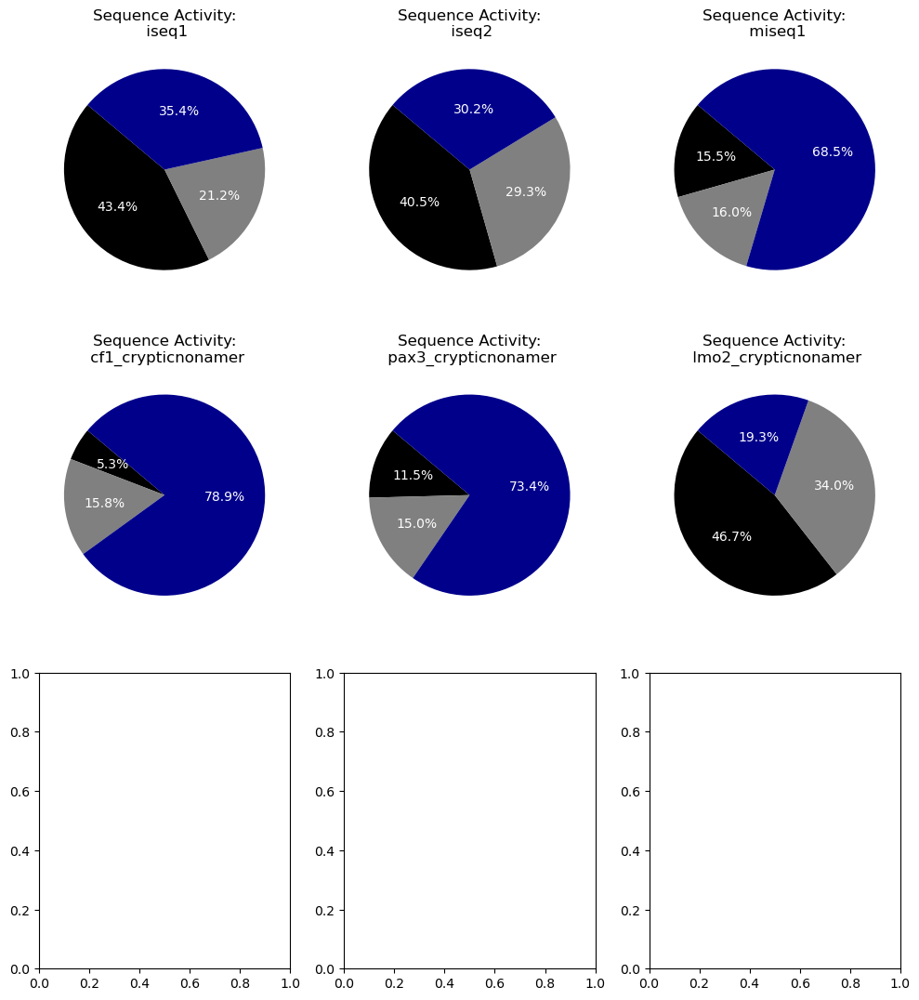

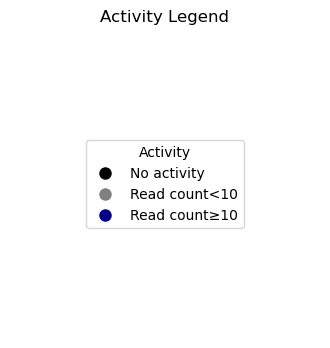

In [15]:
# Define a function to split the dataset into active and inactive parts based on the threshold of read count less than 10
def split_active_inactive(dataset_df):
    # Set the threshold for inactive sequences
    threshold = 10

    # Split the dataset into active and inactive parts
    active_df = dataset_df[dataset_df['Read count'] >= threshold]
    inactive_df = dataset_df[(dataset_df['Read count'] < threshold) & (dataset_df['Read count'] > 0)]
    no_recombination_df = dataset_df[dataset_df['Read count'] == 0]

    return active_df, inactive_df, no_recombination_df

# Calculate number of rows and columns for the grid
datasets_count = len(result_dataframes)
grid_size = math.ceil(math.sqrt(datasets_count))

# Create subplots with grid layout
fig, axes = plt.subplots(grid_size, grid_size, figsize=(10, 11))

# Flatten the 2D array of subplots to simplify indexing
axes = axes.flatten()

# Define colors for different categories
colors = ['black', 'grey', 'darkblue']

# Define legend labels and colors
legend_labels = ['No activity', 'Read count<10', 'Read count≥10']
legend_colors = colors

# Iterate through each dataset
for i, (dataset_name, dataset_df) in enumerate(result_dataframes.items()):
    # Split the dataset into active and inactive parts
    active_df, inactive_df, no_recombination_df = split_active_inactive(dataset_df)

    # Calculate percentage of sequences in each category
    total_count = len(dataset_df)
    active_percent = (len(active_df) / total_count) * 100
    inactive_percent = (len(inactive_df) / total_count) * 100
    no_recombination_percent = (len(no_recombination_df) / total_count) * 100

   # Create a pie chart
    ax = axes[i]
    wedges, _, autotexts = ax.pie([no_recombination_percent, inactive_percent, active_percent],
                                   colors=colors,
                                   autopct='%1.1f%%',
                                   startangle=140,
                                   textprops={'color': 'white'})  # Set percentage label color to white

    # Add title
    ax.set_title(f'Sequence Activity:\n {dataset_name}')

# Adjust layout to prevent overlapping
plt.tight_layout()

# Show the plot
plt.show()

# Create a new figure just for the legend
legend_fig = plt.figure(figsize=(4, 4))

# Create dummy wedges for the legend
legend_wedges = [plt.Line2D([0], [0], marker='o', color='w', label=label, markersize=10, markerfacecolor=color)
                 for label, color in zip(legend_labels, legend_colors)]

# Create legend
plt.legend(handles=legend_wedges, labels=legend_labels, title="Activity", loc="center", bbox_to_anchor=(0.5, 0.5))

# Set title for the legend
plt.title("Activity Legend")

# Remove axis
plt.axis('off')

# Show the legend figure
plt.show()

# ██████████████████████████████████████
# Establishing Functions for stratified k-fold cross validation
## 20-fold cross validation of optimized k-fold models
# ██████████████████████████████████████


In [16]:
def FVAF(real_label,predicted_label):
    """
    Calculates the Fractional Variance Accounted For (FVAF) between real and predicted values.

    Args:
        real_label (np.ndarray): The array of real values (ground truth).
        predicted_label (np.ndarray): The array of predicted values.

    Returns:
        float: The Fraction of Variance Accounted For (FVAF) metric.
    """
    # Calculate the mean squared error (MSE)
    mse = mean_squared_error(real_label, predicted_label)

    # Calculate the variance (VAR)
    var = np.var(real_label)

    # Calculate 1-MSE/VAR
    result = 1 - mse/var
    
    return result

def calculate_spearman_correlation(actual, predicted):
    # Calculate Spearman correlation coefficient
    correlation, _ = spearmanr(actual, predicted)
    return correlation

def calculate_rmse(actual, predicted):
    # Calculate Root Mean Squared Error (RMSE)
    mse = mean_squared_error(actual, predicted)
    rmse = np.sqrt(mse)
    return rmse

def plot_bins_read_count_by_rank(working_df, bin_ranges, read_count_column_name = 'Read count', plt_log_transform = False):
    """
    Plot the bins read count by rank.
    
    Args:
        working_df (pandas.DataFrame): Input DataFrame containing the Read counts and bin assignments.
        bin_ranges (pandas.DataFrame): Input Dataframe containing read counts and bin assignments.
        read_count_column_name (str): Name of the column in the text file that contains the Read Count. Defaults to 'Read count'.
        plt_log_transform (bool):
            -False (default): Plots read count as in working_df
            -True: Plots a log 10 transform of read counts.
    
    Returns:
        None
    
    """
    # Set color values for bins
    colors = [(0.3882, 0.5804, 0.7765),  # medium blue
          (0.6902, 0.7686, 0.8706),  # light blue
          (0.0667, 0.3020, 0.5490),  # dark blue
          (0.9020, 0.6706, 0.0078),  # orange
          (0.6510, 0.4627, 0.1137),  # brown
          (0.5176, 0.2353, 0.2235),  # maroon
          (0.8471, 0.6039, 0.8549),  # lavender
          (0.5490, 0.1647, 0.6510),  # purple
          (0.4078, 0.4078, 0.4078)]  # dark gray
    cmap = mcolors.ListedColormap(colors)
    
    # Check if the read_count_column_name exists in the DataFrame
    if read_count_column_name not in working_df.columns:
        raise ValueError(f"The specified read_count_column_name '{read_count_column_name}' does not exist in the file.\nThe file contains: '{list(working_df.columns)}'")
    
    # Sort the DataFrame by Read count in descending order
    sorted_working_df = working_df.sort_values(by=read_count_column_name, ascending=False)

    # Define the legend handles and labels based on bin_range
    legend_handles = []
    legend_labels = []
    for i in range(len(bin_ranges)):
        bin_label = 'Bin {}:{}'.format(bin_ranges.iloc[i]['Bin#'], bin_ranges.iloc[i]['Bin Read Count Range'])
        bin_patch = mpatches.Patch(color=colors[i], label=bin_label)
        legend_handles.append(bin_patch)
        legend_labels.append(bin_label)

    # Plot scatter plot with colored points based on Bin#
    if plt_log_transform is True:
        plt.scatter(range(len(sorted_working_df)), np.log10(sorted_working_df[read_count_column_name]+1), c=sorted_working_df['Bin'], cmap=cmap)
        plt.ylabel('Log(Read count+1)')
    else:
        plt.scatter(range(len(sorted_working_df)), sorted_working_df[read_count_column_name], c=sorted_working_df['Bin'], cmap=cmap)
        plt.ylabel('Read count')

    plt.xlabel('Rank of Activity [High→Low]')
    plt.title('Read count vs Rank\n(colored by Bin#)')

    # Add the legend on the left side of the plot
    plt.legend(handles=legend_handles, labels=legend_labels, loc='upper right')
    
    plt.show()
    

def plot_train_test_validation_folds(working_df, n_splits, read_count_column_name='Read count', plt_log_transform=True):
    """
    Plots the train, test, and validation indices for each Rotation of combined folds in a stratified K-fold cross-validation.

    Args:
        working_df (pandas.DataFrame): Input DataFrame containing the fold labels and read counts.
        n_splits (int): Number of rotations in the cross-validation.
        read_count_column_name (str): Name of the column in the text file that contains the read count. Defaults to 'Read count'.
        plt_log_transform (bool):
            -False (default): Plots read count as in working_df
            -True: Plots a log 10 transform of read counts.

    Returns:
        None
    """

    # Create a list of fold columns based on the working DataFrame
    fold_cols = [f'Fold {i}' for i in range(working_df.filter(like='Fold').shape[1])]

    # Create subplots for each rotation
    fig, axes = plt.subplots(nrows=len(fold_cols), figsize=(8, 0.6*n_splits), sharex=True)
    fig.subplots_adjust(hspace=0.2, left=0.15)

    # Iterate over each fold column and plot the train, test, and validation indices
    for i, fold_col in enumerate(fold_cols):
        # Retrieve the train, test, and validation indices based on the fold column and plot type
        if plt_log_transform:
            train_indices = np.log10(working_df.loc[working_df[fold_col] == 'Train', read_count_column_name] + 1)
            test_indices = np.log10(working_df.loc[working_df[fold_col] == 'Test', read_count_column_name] + 1)
            val_indices = np.log10(working_df.loc[working_df[fold_col] == 'Validation', read_count_column_name] + 1)
        else:
            train_indices = working_df.loc[working_df[fold_col] == 'Train', read_count_column_name]
            test_indices = working_df.loc[working_df[fold_col] == 'Test', read_count_column_name]
            val_indices = working_df.loc[working_df[fold_col] == 'Validation', read_count_column_name]

        # Plot the train, test, and validation indices using scatter plots
        axes[i].scatter(train_indices, [0] * len(train_indices), label='Train', marker="|", color='black', s=20)
        axes[i].scatter(test_indices, [1] * len(test_indices), label='Test', marker="|", color='red', s=20)
        axes[i].scatter(val_indices, [2] * len(val_indices), label='Validation', marker="|", color='blue', s=20)

        # Set the y-axis limits and labels
        axes[i].set_ylim([-0.5, 2.5])
        axes[i].set_yticks([0, 1, 2])
        axes[i].set_yticklabels(['Train', 'Test', 'Validation'])
        axes[i].set_ylabel(f'Rotation {i}', rotation=0, ha='right', va='center')

    # Set the x-axis label based on the plot type
    axes[-1].set_xlabel('Log(Read count + 1)' if plt_log_transform else read_count_column_name)

    # Adjust the layout and display the plot
    plt.tight_layout()
    plt.show()

def plot_fold_subsets(working_df, n_splits, read_count_column_name='Read count', plt_log_transform=False):
    """
    Plots test indices for each fold, displaying the splits of the data

    Args:
        working_df (pandas.DataFrame): Input DataFrame containing the fold labels and read counts.
        n_splits (int): Number of folds in the cross-validation.
        read_count_column_name (str): Name of the column in the text file that contains the read count. Defaults to 'Read count'.
        plt_log_transform (bool):
            -False (default): Plots read count as in working_df
            -True: Plots a log 10 transform of read counts.

    Returns:
        None
    """

    # Create a list of fold columns based on the working DataFrame
    fold_cols = [f'Fold {i}' for i in range(working_df.filter(like='Fold').shape[1])]

    # Create subplots for each fold
    fig, axes = plt.subplots(nrows=len(fold_cols), figsize=(4, 0.4*n_splits), sharex=True)
    fig.subplots_adjust(hspace=0.1, left=0.15)

    # Iterate over each fold column and plot the train, test, and validation indices
    for i, fold_col in enumerate(fold_cols):
        # Retrieve the train, test, and validation indices based on the fold column and plot type
        if plt_log_transform:
            test_indices = np.log10(working_df.loc[working_df[fold_col] == 'Test', read_count_column_name] + 1)
        else:
            test_indices = working_df.loc[working_df[fold_col] == 'Test', read_count_column_name]

        # Plot the train, test, and validation indices using scatter plots
        axes[i].scatter(test_indices, [1] * len(test_indices), label='Test', marker="|", color='crimson', s=50)

        # Set the y-axis limits and labels
        axes[i].set_ylim([-0.5, 2.5])
        axes[i].set_yticks([0, 1, 2])
        axes[i].set_yticklabels(['', '',''])
        axes[i].set_ylabel(fold_col, rotation=0, ha='right', va='center')

    # Set the x-axis label based on the plot type
    axes[-1].set_xlabel('Log(Read count + 1)' if plt_log_transform else read_count_column_name)

    # Adjust the layout and display the plot
    plt.tight_layout()
    plt.show()
    return

In [17]:
def asymmetric_binning(data, read_count_column_name='Read count', bin_zeros_seperately=True, plt_log_transform=False, sep='\t'):
    """
    Apply asymmetric binning to read counts in a text file or DataFrame and assign bin numbers.
    
    Args:
        data (str or pandas.DataFrame): Path to the text file or a DataFrame containing the read counts.
        read_count_column_name (str): Name of the column that contains the read count. Defaults to 'Read count'.
        bin_zeros_seperately (bool): Determines if zero-scoring read counts is binned separately.
            - True (default): Zero-scoring read counts are binned into an exclusive bin.
            - False: Zero-scoring read counts are binned with the lowest bin.
        plt_log_transform (bool):
            - False (default): Plots read count as in working_df.
            - True: Plot a log 10 transform of read counts.
        sep (str): Separator used in the text file. Defaults to '\t'.
            
    Returns:
        working_df (pandas.DataFrame): DataFrame with additional bin numbers assigned.
        bin_ranges (pandas.DataFrame): DataFrame containing information about the bin ranges for the asymmetric binning strategy.
    """
    # Boundaries of the asymmetric bin widths (percent of maximum read count)
    bin_limits = ['0.0', '0.005', '0.01', '0.02', '0.04', '0.08', '0.15', '0.3', '1']
    
    # Check if data is a DataFrame or a file path
    if isinstance(data, pd.DataFrame):
        working_df = data.copy()
    else:
        with open(data) as file:
            # Read the contents into a Pandas DataFrame
            working_df = pd.read_csv(file, sep=sep)
        
    # Check if the read_count_column_name exists in the DataFrame
    if read_count_column_name not in working_df.columns:
        raise ValueError(f"The specified read_count_column_name '{read_count_column_name}' does not exist.\nThe DataFrame contains: {list(working_df.columns)}")

    # Convert read counts to float
    working_df[read_count_column_name] = working_df[read_count_column_name].astype(float)
    
    # Save the max read count for percent calculations
    max_read_count = working_df[read_count_column_name].max()

    # Create a DataFrame to store bin information
    bin_ranges = pd.DataFrame(columns=['Bin#', 'Range', 'Lower Read Count', 'Upper Read Count', 'Bin Read Count Range'])

    # Add a row for the zero-value bin
    if bin_zeros_seperately:
        bin_ranges.loc[0] = [0, '0.0', 0.0, 0.0, 'x=0']
    
    # Add rows for each bin determined by bin_limits
    for i in range(len(bin_limits) - 1):
        # Determine bin upper and lower boundaries
        lower_read_count = float(bin_limits[i]) * max_read_count
        upper_read_count = float(bin_limits[i + 1]) * max_read_count
        
        # Create bin-specific information and fill DataFrame
        bin_range_str = f"{bin_limits[i]}-{bin_limits[i + 1]}"
        if lower_read_count == 0.0 and not bin_zeros_seperately:
            bin_read_range_str = f"{lower_read_count:.2f}≤x≥{upper_read_count:.2f}"
        else:
            bin_read_range_str = f"{lower_read_count:.2f}<x≥{upper_read_count:.2f}"
        bin_ranges.loc[i + 1] = [i + 1, bin_range_str, lower_read_count, upper_read_count, bin_read_range_str]

    # Add bin column to DataFrame
    working_df['Bin'] = 0

    # Assign each read count to a bin
    for i, row in bin_ranges.iterrows():
        lower_range = row['Lower Read Count']
        upper_range = row['Upper Read Count']
        
        # Assign bin number to appropriate values 
        if lower_range == 0.0 and not bin_zeros_seperately:
            mask = (working_df[read_count_column_name] >= lower_range) & (working_df[read_count_column_name] <= upper_range)
        else:
            mask = (working_df[read_count_column_name] > lower_range) & (working_df[read_count_column_name] <= upper_range)
        working_df.loc[mask, 'Bin'] = i

    # Count the number of items in each bin and print the result
    bin_counts = working_df.groupby('Bin').size()
    print(bin_counts)
    
    # Create plot of bins and read count 
    plot_bins_read_count_by_rank(working_df, bin_ranges, read_count_column_name=read_count_column_name, plt_log_transform=plt_log_transform)
    
    return working_df, bin_ranges

def create_stratified_folds(working_df, n_splits=20, read_count_column_name='Read count', bin_column_name='Bin', plt_log_transform=False):
    """
    Performs stratified K-fold cross-validation, assigns fold labels to the working DataFrame,
    plots the train, test, and validation indices for each fold, and visualizes two-sample kolmogorov-smirnov test statistics and p-values.

    Args:
        working_df (pandas.DataFrame): Input DataFrame containing the data for cross-validation.
        n_splits (int): Number of folds in the cross-validation. Defaults to 20.
        read_count_column_name (str): Name of the column in the text file that contains the read count. Defaults to 'Read count'.
        bin_column_name (str): Name of the column in the DataFrame that contains the bin assignments. Defaults to 'Bin'.
        plt_log_transform (bool):
            -False (default): Plots read count as in working_df
            -True: Plots a log 10 transform of read counts.
    Returns:
        pandas.DataFrame: Modified working DataFrame with fold labels assigned.

    """

    # Establish stratified K-fold parameters
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=7)
    
    # Pull bin assignments
    bins = working_df[bin_column_name]
    
    # Perform stratified K-fold cross-validation and store fold indices
    fold_indices = []
    for _, infold_index in skf.split(bins, bins):
        fold_indices.append(infold_index.tolist())
    
    # Iterate over the fold indices and assign fold labels to the working DataFrame
    for fold_no in range(len(fold_indices)):
        fold_label = f'Fold {fold_no}'
        working_df[fold_label] = '0'

        # Determine the validation, test, and train indices for the current fold
        val_index = [fold_indices[(fold_no - 1) % len(fold_indices)]]
        val_index = list(itertools.chain.from_iterable(val_index))

        test_index = [fold_indices[(fold_no - 2) % len(fold_indices)]]
        test_index = list(itertools.chain.from_iterable(test_index))

        train_index = [i % len(fold_indices) for i in range(fold_no, fold_no - 2 + len(fold_indices))]
        train_index = [fold_indices[i] for i in train_index]
        train_index = list(itertools.chain.from_iterable(train_index))

        # Assign fold labels to the corresponding indices in the working DataFrame
        working_df.loc[val_index, fold_label] = 'Validation'
        working_df.loc[test_index, fold_label] = 'Test'
        working_df.loc[train_index, fold_label] = 'Train'

    # Plot train, test, and validation indices for each fold
    plot_train_test_validation_folds(working_df, n_splits, read_count_column_name, plt_log_transform)

    # Sort the fold columns in ascending order
    sorted_cols = sorted(working_df.filter(regex='Fold \d+$').columns, key=lambda x: int(x.split()[-1]))

    statistic_values = []
    pvalue_values = []

    # Calculate KS test statistics and p-values for each fold
    for fold in sorted_cols:
        #KS-test between testing to the whole dataset
        stat_test2all =  ks_2samp(working_df.loc[working_df[fold] == 'Test', read_count_column_name], working_df.loc[working_df[fold].isin(['Train', 'Validation', 'Test']), read_count_column_name]).statistic
        pval_test2all = ks_2samp(working_df.loc[working_df[fold] == 'Test', read_count_column_name], working_df.loc[working_df[fold].isin(['Train', 'Validation', 'Test']), read_count_column_name]).pvalue

        #KS-test between validation to the whole dataset
        stat_val2all = ks_2samp(working_df.loc[working_df[fold] == 'Validation', read_count_column_name], working_df.loc[working_df[fold].isin(['Train', 'Validation', 'Test']), read_count_column_name]).statistic
        pval_val2all = ks_2samp(working_df.loc[working_df[fold] == 'Validation', read_count_column_name], working_df.loc[working_df[fold].isin(['Train', 'Validation', 'Test']), read_count_column_name]).pvalue
        
        #KS-test between training to the whole dataset
        stat_train2all = ks_2samp(working_df.loc[working_df[fold] == 'Train', read_count_column_name], working_df.loc[working_df[fold].isin(['Train', 'Validation', 'Test']), read_count_column_name]).statistic
        pval_train2all = ks_2samp(working_df.loc[working_df[fold] == 'Train', read_count_column_name], working_df.loc[working_df[fold].isin(['Train', 'Validation', 'Test']), read_count_column_name]).pvalue

        #KS-test between validation to the test fold
        stat_val2test = ks_2samp(working_df.loc[working_df[fold] == 'Validation', read_count_column_name], working_df.loc[working_df[fold] == 'Test', read_count_column_name]).statistic
        pval_val2test = ks_2samp(working_df.loc[working_df[fold] == 'Validation', read_count_column_name], working_df.loc[working_df[fold] == 'Test', read_count_column_name]).pvalue
        
        #collect the stats for each rotation
        statistic_values.append([stat_test2all, stat_val2all, stat_train2all, ])
        pvalue_values.append([pval_test2all, pval_val2all, pval_train2all,])

    # Plot the KS test statistic and p-value values
    statistic_values = np.array(statistic_values)
    pvalue_values = np.array(pvalue_values)

    # Create a figure with two subplots side by side
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    # Box plot for KS test statistic values
    axs[0].set_title('KS Test Statistic')
    axs[0].set_xlabel('Compared to Whole Dataset')
    axs[0].set_ylabel('KS Statistic Value')
    axs[0].set_ylim(0,0.1)
    
    # Using boxplot function to create the boxplot
    bp = axs[0].boxplot(statistic_values, labels=['Test', 'Validation', 'Train'], patch_artist=True)

    # Set colors for boxplot elements
    colors = ['red', 'blue', 'black']
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)


    # Box plot for p-values
    axs[1].set_title('KS Test P-Value')
    axs[1].set_xlabel('Compared to Whole Dataset')
    axs[1].set_ylabel('P-Value')
    axs[1].set_ylim(0.5,1.05)
    
    
    # Using boxplot function to create the boxplot for p-values
    bp_pvalue = axs[1].boxplot(pvalue_values, labels=['Test', 'Validation', 'Train'], patch_artist=True)

    # Set colors for boxplot elements
    for patch, color in zip(bp_pvalue['boxes'], colors):
        patch.set_facecolor(color)

    plt.show()

    return working_df


def encode_sequences_to_numpy_array(working_df, sequence_column_name='sequence'):
    """
    Encode sequences from a text file into a numpy array of one-hot encoded sequences.

    Args:
        working_df (pandas.DataFrame): Input DataFrame containing the sequences.
        sequence_column_name (str): Name of the column in the text file that contains the sequences. Defaults to 'sequence'.

    Returns:
        one_hot_seq (numpy.ndarray): A numpy array containing the one-hot encoded sequences.
    """
    # Define a mapping from nucleotides to integers
    nt_to_int = {'A': 0, 'T': 1, 'G': 2, 'C': 3, 'a': 0, 't': 1, 'g': 2, 'c': 3}
        
    # Check if the sequence_column_name exists in the DataFrame
    if sequence_column_name not in working_df.columns:
        raise ValueError(f"The specified sequence_column_name '{sequence_column_name}' does not exist in the file.\nThe file contains: '{list(working_df.columns)}'")

    # Define a new column to store the one-hot encoded sequences
    working_df['one_hot_seq'] = ''

    # Loop through each row in the DataFrame
    for index, row in working_df.iterrows():
        # Convert the sequence to an integer representation
        int_seq = [nt_to_int[nt] for nt in row[sequence_column_name]]

        # One-hot encode the integer sequence
        one_hot_seq = tf.keras.utils.to_categorical(int_seq, num_classes=4)

        # Update the 'one_hot_seq' column with the one-hot encoded sequence
        working_df.at[index, 'one_hot_seq'] = one_hot_seq

    # Convert the 'one_hot_seq' column to a numpy array
    one_hot_seq = np.array(list(working_df['one_hot_seq']))
    
    # Flatten each array in ins
    one_hot_seq = np.reshape(one_hot_seq, (one_hot_seq.shape[0], -1))
    
    # Generate feature names based on sequence length
    sequence_length = len(working_df[sequence_column_name].iloc[0])  # Assuming all sequences are of the same length
    feature_names = [f"Position_{i+1}_{base}" for i in range(sequence_length) for base in ['A', 'T', 'G', 'C']]

    return one_hot_seq, feature_names


def normalize_read_count_to_numpy_array(working_df, read_count_column_name='Read count', min_max_log=False):
    """
    Normalize read counts from a pandas DataFrame and return them as a numpy array.

    Args:
        working_df (pandas.DataFrame): Input DataFrame containing the Read counts.
        read_count_column_name (str): Name of the column in the text file that contains the Read Count. Defaults to 'Read count'.
        min_max_log (bool): Determines the type of normalization to be applied.
            - False (default): Normalize using min-max normalization.
            - True: Normalize using min-max normalization after applying a logarithmic transformation (log base 10) to the read counts.
        
    Returns:
        normalized_read_counts (numpy.ndarray): A numpy array containing the normalized Read counts.
    """
    # Check if the read_count_column_name exists in the DataFrame
    if read_count_column_name not in working_df.columns:
        raise ValueError(f"The specified read_count_column_name '{read_count_column_name}' does not exist in the file.\nThe file contains: '{list(working_df.columns)}'")
        
    # Assign read count to variable
    read_counts = working_df[read_count_column_name].astype(float)

    if min_max_log == True:
        # Normalize read counts with a logarithmic transformation (log base 10)
        read_counts = np.log(read_counts + 1) # Add 1 to accommodate log of zero values

    # Normalize read counts using min-max normalization
    minimum = np.amin(read_counts)
    maximum = np.amax(read_counts)
    normalized_read_counts = (read_counts-minimum)/(maximum-minimum)
    normalized_read_counts= normalized_read_counts.to_numpy()

    return normalized_read_counts


def model_training_crossfold_validation(model_building_function, working_df, sequence_variables, read_count_labels):
    """
    Perform crossfold validation for model training and evaluation.
    
    Plots loss over epochs, model prediction performance for each fold, and tfa r2_score (FVAF) over epochs

    Args:
        model_building_function (function): A function that builds the model architecture.
        working_df (pd.DataFrame): The working dataframe containing the fold assignments.
        sequence_variables (np.ndarray): The sequence variables.
        read_count_labels (np.ndarray): The read count labels.

    Returns:
        pd.DataFrame: A DataFrame with columns for loss metric values, training performance values, and validation performance values.        

    """
    # Suppress TensorFlow info messages to prevent repeated model summary printing
    os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
    
    X = sequence_variables
    y = read_count_labels
    
    # Initialize empty list to cache fold's performance metric
    metric_values = []
    loss_metric_values = []
    training_performance_values = []
    validation_performance_values = []
    spearman_train_values = []
    spearman_val_values = []
    rmse_train_values = []
    rmse_val_values = []

    # Pull n_Fold columns to list
    fold_columns = [col for col in working_df.columns if col.startswith('Fold')]

    num_folds = len(fold_columns)
    num_rows = num_folds  # Number of rows in the grid
    num_cols = 3  # Number of columns in the grid (loss plot and validation plot)

    fig, axs = plt.subplots(num_rows, num_cols, figsize=(10, num_rows*3))

    for i, n_fold in enumerate(fold_columns):
        train_indices = working_df.index[working_df[n_fold] == 'Train'].tolist()  # Indices for train label
        test_indices = working_df.index[working_df[n_fold] == 'Test'].tolist()  # Indices for test label
        validation_indices = working_df.index[working_df[n_fold] == 'Validation'].tolist()  # Indices for validation label
    
        # Print the fold label
        print(f"Fold: {n_fold}")
        
        # Connect train_indices to X_train and y_train
        X_train = X[train_indices]
        y_train = y[train_indices]
        
        # Connect validation_indices to X_val and y_val
        X_val = X[validation_indices]
        y_val = y[validation_indices]

        # Early stopping
        early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
        
        # Build model architecture using the provided function
        working_model = model_building_function(sequence_variables)
        
        # Train the model on the current training set
        working_history = working_model.fit(X_train, y_train, epochs=100, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stop])
        
        # Predict the values for the training and validation sets
        y_pred_train = working_model.predict(X_train).flatten()
        y_pred_val = working_model.predict(X_val).flatten()

        # Compute the accuracy, loss, or any other metric of interest
        loss_metric_value = working_model.evaluate(X_val, y_val) #MSE
        training_performance_value = FVAF(y_train, y_pred_train) #training FVAF
        validation_performance_value = FVAF(y_val, y_pred_val) #validation FVAF
        spearman_train, _ = spearmanr(y_train, y_pred_train) #training spearman
        spearman_val, _ = spearmanr(y_val, y_pred_val) #validation spearman
        rmse_train = np.sqrt(mean_squared_error(y_train, y_pred_train)) #training RMSE
        rmse_val = np.sqrt(mean_squared_error(y_val, y_pred_val)) #validation RMSE
        
    
        # Get the R2 scores from the history object (using the FVAF version of R2)
        r2_scores_train = working_history.history['r_square']
        r2_scores_val = working_history.history['val_r_square']

        # Plot the loss curve in the left subplot
        axs[i, 0].plot(working_history.history['loss'], color = 'black')
        axs[i, 0].plot(working_history.history['val_loss'], color = (0.2667, 0.5020, 0.9490))
        axs[i, 0].set_xlabel('Epoch')
        axs[i, 0].set_ylabel('Loss')
        #axs[i, 0].set_title('{}'.format(n_fold))
        # Replace "fold" with "rotation" in the title
        title_text = str(n_fold).replace('Fold', 'Rotation')
        axs[i, 0].set_title(title_text)
        
        
        axs[i, 0].legend(['Train', 'Validation'], loc='upper right')

        # Plot the scatter plot of real vs predicted values in the right subplot
        axs[i, 1].scatter(y_train, y_pred_train, s=30, color = 'black', label='Training: {:.3f}'.format(training_performance_value)+' FVAF')
        axs[i, 1].scatter(y_val, y_pred_val, s=30, color = (0.2667, 0.5020, 0.9490), label='Validating: {:.3f}'.format(validation_performance_value)+' FVAF')
        axs[i, 1].set_title('Real vs Predicted Values')
        axs[i, 1].set_xlabel('Real Values')
        axs[i, 1].set_ylabel('Predicted Values')
        axs[i, 1].set_xlim([0, np.max(y)])
        axs[i, 1].set_ylim([0, np.max(y)])
        axs[i, 1].set_aspect('equal')
        axs[i, 1].legend(loc='upper left', fontsize='small')
              
        # Plot the R2 curve in the 3rd subplot
        axs[i, 2].plot(r2_scores_train, color='black')
        axs[i, 2].plot(r2_scores_val, color=(0.8667, 0.3020, 0.2941))
        axs[i, 2].set_title('Performance per Epoch')
        axs[i, 2].set_ylim([-1.1,1.1])
        axs[i, 2].set_xlabel('Epoch')
        axs[i, 2].set_ylabel('FVAF Score')
        axs[i, 2].legend(['Train', 'Validation'], loc='lower right')

        # Append the metric value and indices to the cache lists
        loss_metric_values.append(loss_metric_value[0])
        training_performance_values.append(training_performance_value)
        validation_performance_values.append(validation_performance_value)
        spearman_train_values.append(spearman_train)
        spearman_val_values.append(spearman_val)
        rmse_train_values.append(rmse_train)
        rmse_val_values.append(rmse_val)

        # Print the metric value for this fold
        print('Fold loss metric value: {}'.format(loss_metric_value)+' Mean Square Error')
        print('Fold training performance: {}'.format(training_performance_value)+' FVAF')
        print('Fold validation performance: {}'.format(validation_performance_value)+' FVAF')
    
    print(working_model.summary())
    
    plt.tight_layout()
    plt.show()
    
    metric_df = pd.DataFrame(
        {
            'Validation_MSE': loss_metric_values,
            'Training_FVAF': training_performance_values,
            'Validation_FVAF': validation_performance_values,
            'Training_Spearman': spearman_train_values,
            'Validation_Spearman': spearman_val_values,
            'Training_RMSE': rmse_train_values,
            'Validation_RMSE': rmse_val_values
        },
        index=fold_columns)
    
    return metric_df

## • Optimized k-fold model's 20-fold cross validation

Bin
0    1778
1    1054
2     120
3     299
4     350
5     233
6     146
7      81
8      35
dtype: int64


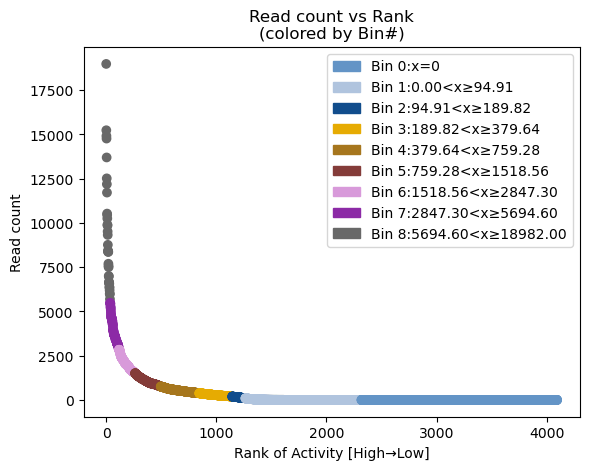

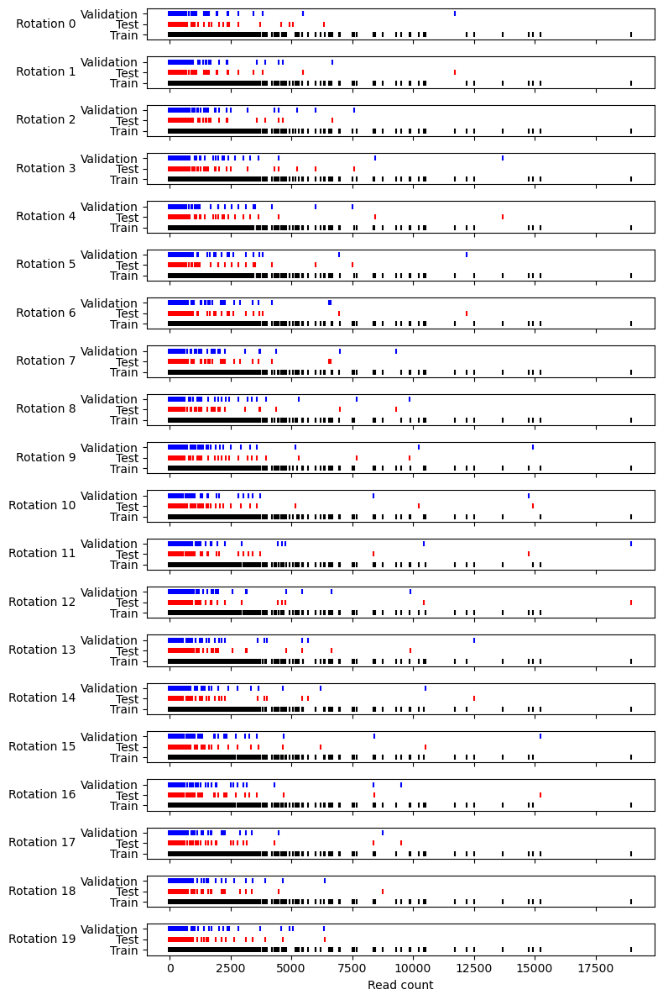

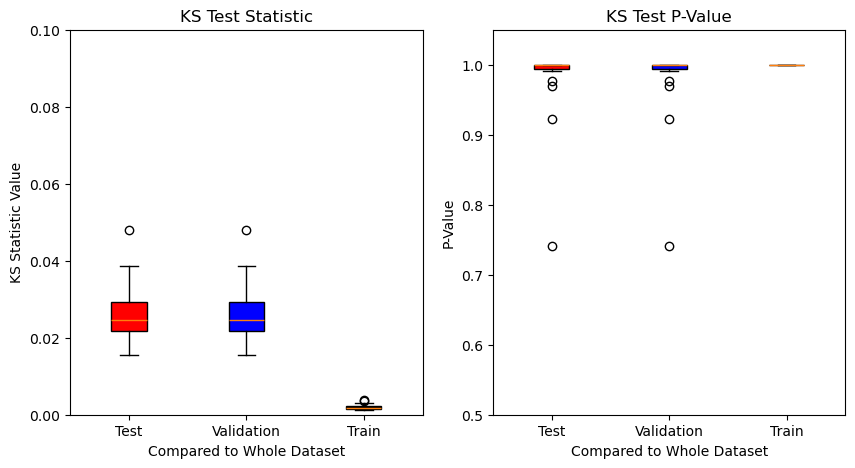

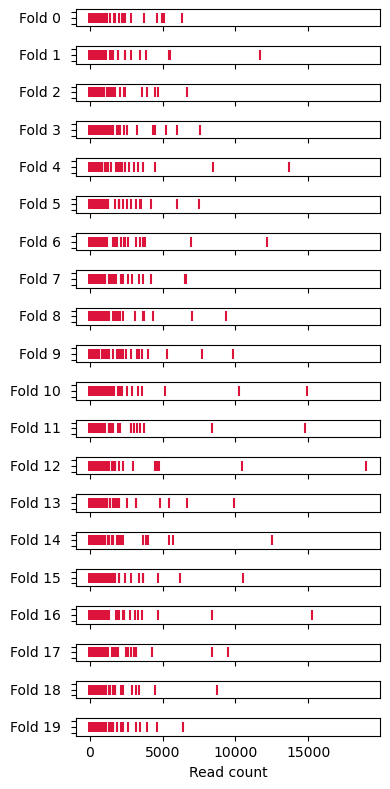

Fold: Fold 0


7/7 [==============================] - 0s 2ms/step - loss: 5.4471e-04 - r_square: 0.8406
Fold loss metric value: [0.0005447125877253711, 0.8406230211257935] Mean Square Error
Fold training performance: 0.859471020472992 FVAF
Fold validation performance: 0.840623008191384 FVAF
Fold: Fold 1
7/7 [==============================] - 0s 2ms/step - loss: 9.0568e-04 - r_square: 0.5244
Fold loss metric value: [0.0009056824492290616, 0.5243895649909973] Mean Square Error
Fold training performance: 0.6512281695155899 FVAF
Fold validation performance: 0.5243895185059799 FVAF
Fold: Fold 2
7/7 [==============================] - 0s 2ms/step - loss: 7.6294e-04 - r_square: 0.7099
Fold loss metric value: [0.0007629412575624883, 0.7099453806877136] Mean Square Error
Fold training performance: 0.8314794703702791 FVAF
Fold validation performance: 0.7099453778371161 FVAF
Fold: Fold 3
7/7 [==============================] - 0s 2ms/step - loss: 6.1453e-04 - r_square: 0.8659
Fold loss metric value

7/7 [==============================] - 0s 2ms/step - loss: 4.2506e-04 - r_square: 0.8000
Fold loss metric value: [0.00042505524470470846, 0.8000077605247498] Mean Square Error
Fold training performance: 0.8089754882358959 FVAF
Fold validation performance: 0.8000077472271213 FVAF
Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 hidden_1 (Dense)            (None, 300)               33900     
                                                                 
 dropout_19 (Dropout)        (None, 300)               0         
                                                                 
 hidden_2 (Dense)            (None, 150)               45150     
                                                                 
 dense_19 (Dense)            (None, 1)                 151       
                                                                 
Total params: 79201 (309.38 KB)
Train

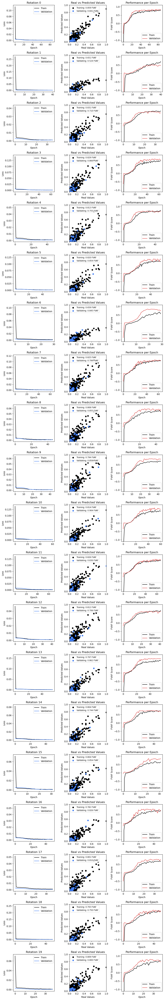

         Validation_MSE_dropout_0.65  Training_FVAF_dropout_0.65  \
Fold 0                      0.000545                    0.859471   
Fold 1                      0.000906                    0.651228   
Fold 2                      0.000763                    0.831479   
Fold 3                      0.000615                    0.829194   
Fold 4                      0.000585                    0.812507   
Fold 5                      0.000536                    0.819758   
Fold 6                      0.000352                    0.659081   
Fold 7                      0.000583                    0.825178   
Fold 8                      0.000508                    0.807966   
Fold 9                      0.000776                    0.793967   
Fold 10                     0.000460                    0.813810   
Fold 11                     0.001268                    0.825649   
Fold 12                     0.000936                    0.812098   
Fold 13                     0.000526            

In [18]:
plt.rcParams.update({'font.size': 10})

hyperparameter_performance = pd.DataFrame()

trialing_hyperparameter_values = [0.65]
trialing_hyperparameter_label = 'dropout'

for i in range(len(trialing_hyperparameter_values)):
    """
    Template to N Fold Cross Validate defined model.

    Workflow:
        Preprocess recombination data.
            - asymmetric_binning (function)
                └ plot_bins_read_count_by_rank (function)
            - create_stratified_folds (function)
                └ plot_train_test_validation_folds (function)

        Normalize/encode labels and variables.
            - encode_sequences_to_numpy_array (function)
            - normalize_read_count_to_numpy_array (function)

        Establish model architecture and parameters.
            - build_model (function)

        Perform N Fold Cross Validation.
            - model_training_crossfold_validation (function)
                └ FVAF (function)

    """

    bin_assigned_df, table_of_bin_range_boundaries = asymmetric_binning(
        data=result_dataframes['iseq1'],
        read_count_column_name='Read count',
        bin_zeros_seperately=True,
        plt_log_transform=False,
        sep='\t')

    fold_assigned_df = create_stratified_folds(
        working_df=bin_assigned_df,
        n_splits=20,
        read_count_column_name='Read count',
        bin_column_name='Bin',
        plt_log_transform=False)

    plot_fold_subsets(
        working_df=fold_assigned_df,
        n_splits=20,
        read_count_column_name='Read count',
        plt_log_transform=False)

    #print(fold_assigned_df)
    # Convert the dict of DataFrames to an Excel file with each DataFrame in its own sheet
    #with pd.ExcelWriter('iseq1_folds.xlsx') as writer:
    #        fold_assigned_df.to_excel(writer, sheet_name="iseq1_RotationAssignments", index=False)
    #print("xlsx File has been writen")
    
    sequence_variables, sequence_labels = encode_sequences_to_numpy_array(
        working_df=fold_assigned_df,
        sequence_column_name='Sequence')
    read_count_labels = normalize_read_count_to_numpy_array(
        working_df=fold_assigned_df,
        read_count_column_name='Read count',
        min_max_log=False)

    def build_model(input_variables):
        """
        Construct Sequential NN model; called by the model_training_crossfold_validation function.

        Args:
            input_variables (np.ndarray): The sequence variables used to define layer shapes.

        Returns:
            tf.keras.Sequential: The constructed neural network model.
        """

        # Dropout variable
        dropout_rate = trialing_hyperparameter_values[i]

        # Define the neural network architecture
        working_model = tf.keras.Sequential([
            tf.keras.layers.InputLayer(input_variables[0].shape),
            tf.keras.layers.Dense(300, use_bias=True, name="hidden_1", activation='relu'),
            tf.keras.layers.Dropout(dropout_rate),
            tf.keras.layers.Dense(150, use_bias=True, name="hidden_2", activation='relu'),
            tf.keras.layers.Dense(1, activation='exponential')
        ])

        # Define the optimizer with a learning rate
        optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002)

        # Compile the working_model with the mean squared error loss function and the optimizer
        working_model.compile(loss='mean_squared_error', optimizer=optimizer, metrics=[tfa.metrics.r_square.RSquare()])

        return working_model

    cross_fold_performance_metrics = model_training_crossfold_validation(
        model_building_function=build_model,
        working_df=fold_assigned_df,
        sequence_variables=sequence_variables,
        read_count_labels=read_count_labels)

    # Add the dropout rate to the performance metrics
    cross_fold_performance_metrics.columns = [f"{col}_{trialing_hyperparameter_label}_{trialing_hyperparameter_values[i]}" for col in cross_fold_performance_metrics.columns]

    # Append the performance metrics to the DataFrame
    hyperparameter_performance = pd.concat([hyperparameter_performance, cross_fold_performance_metrics], axis=1)

# Display the combined performance metrics DataFrame
print(hyperparameter_performance)

# Generate an Excel file with the combined performance metrics
output_file = f"hyperparameter_search_{trialing_hyperparameter_label}.xlsx"
hyperparameter_performance.to_excel(output_file, index=False)

print(f"Results have been saved to {output_file}")

# ███████████████
# Train the H4S2 Model
# ███████████████

Bin
0    1778
1    1054
2     120
3     299
4     350
5     233
6     146
7      81
8      35
dtype: int64


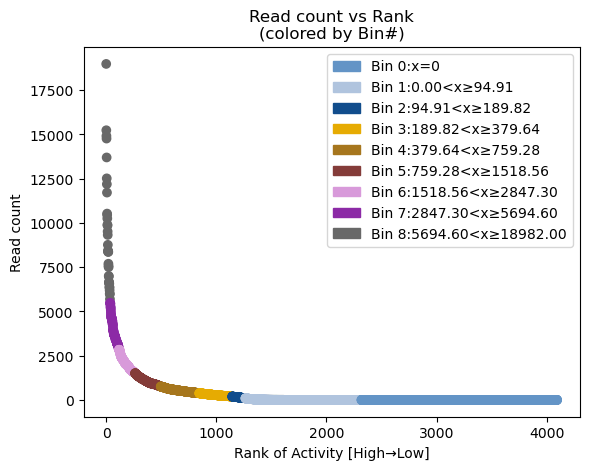

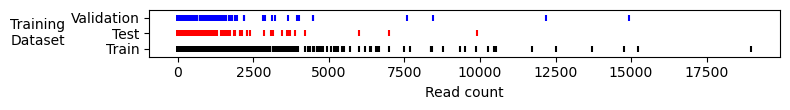

Fold: Fold 0
13/13 [==============================] - 0s 1ms/step - loss: 6.1498e-04 - r_square: 0.7344
Fold loss metric value: [0.0006149790715426207, 0.7343616485595703] Mean Square Error
Fold training performance: 0.8738608723533644 FVAF
Fold validation performance: 0.8526478722795586 FVAF
Fold test performance: 0.7343615965006682 FVAF
Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 hidden_1 (Dense)            (None, 300)               7500      
                                                                 
 dropout_20 (Dropout)        (None, 300)               0         
                                                                 
 hidden_2 (Dense)            (None, 150)               45150     
                                                                 
 dense_20 (Dense)            (None, 1)                 151       
                                          

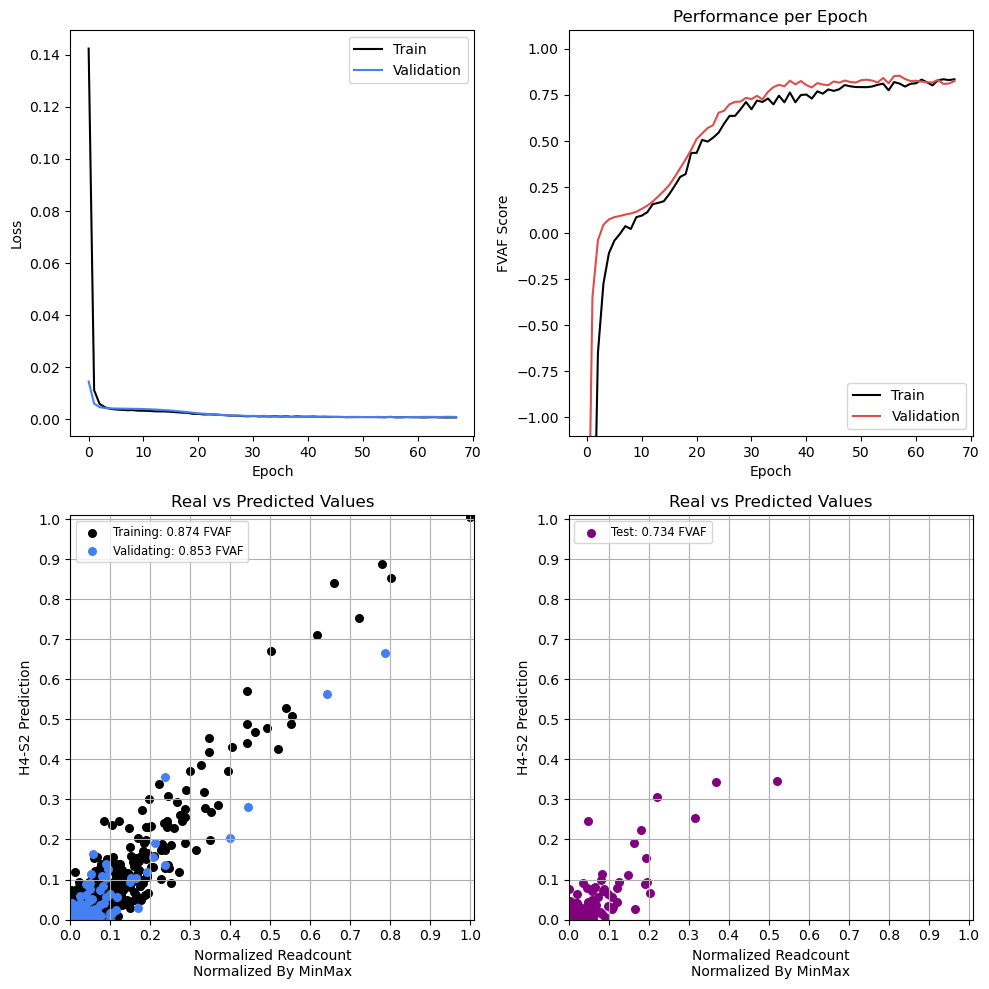

   Validation_MSE  Training_FVAF  Validation_FVAF  Test_FVAF  \
0        0.000615       0.873861         0.852648   0.734362   

   Training_Spearman  Validation_Spearman  Test_Spearman  Training_RMSE  \
0           0.731196             0.744188       0.738416       0.021019   

   Validation_RMSE  Test_RMSE  
0         0.025417   0.024799  


In [19]:
hep_bin, hep_bin_ranges = asymmetric_binning(result_dataframes['iseq1'], bin_zeros_seperately=True, plt_log_transform=False)

# Perform a stratified train-validation-test split based on the 'Bin' column
train_val_test_split = train_test_split(hep_bin, stratify=hep_bin['Bin'], test_size=0.2, random_state=42)
train_df, test_validation_df = train_val_test_split
validation_df, test_df = train_test_split(test_validation_df, stratify=test_validation_df['Bin'], test_size=0.5, random_state=42)

# Assign 'Fold 0' column labels for train, validation, and test sets
train_df['Fold 0'] = 'Train'
validation_df['Fold 0'] = 'Validation'
test_df['Fold 0'] = 'Test'

# Concatenate the DataFrames into one
hep_folds = pd.concat([train_df, validation_df, test_df], ignore_index=True)

# Variables used to plot train test validation indies for each rotation
"""
Plots the train, test, and validation indices for each Rotation of combined folds in a stratified K-fold cross-validation.

Args:
    working_df (pandas.DataFrame): Input DataFrame containing the fold labels and read counts.
    n_splits (int): Number of rotations in the cross-validation.
    read_count_column_name (str): Name of the column in the text file that contains the read count. Defaults to 'Read count'.
    plt_log_transform (bool):
        -False (default): Plots read count as in working_df
        -True: Plots a log 10 transform of read counts.

Returns:
    None
"""
    
working_df = hep_folds
n_splits = 2
read_count_column_name = 'Read count'
plt_log_transform = False


# Create a list of fold columns based on the working DataFrame
fold_cols = [f'Fold {i}' for i in range(working_df.filter(like='Fold').shape[1])]

# Create subplots for each rotation
fig, axes = plt.subplots(nrows=len(fold_cols), figsize=(8, 0.6*n_splits), sharex=True)
fig.subplots_adjust(hspace=0.2, left=0.15)

# Ensure axes is always treated as an array
if len(fold_cols) == 1:
    axes = [axes]

# Iterate over each fold column and plot the train, test, and validation indices
for i, fold_col in enumerate(fold_cols):
    # Retrieve the train, test, and validation indices based on the fold column and plot type
    if plt_log_transform:
        train_indices = np.log10(working_df.loc[working_df[fold_col] == 'Train', read_count_column_name] + 1)
        test_indices = np.log10(working_df.loc[working_df[fold_col] == 'Test', read_count_column_name] + 1)
        val_indices = np.log10(working_df.loc[working_df[fold_col] == 'Validation', read_count_column_name] + 1)
    else:
        train_indices = working_df.loc[working_df[fold_col] == 'Train', read_count_column_name]
        test_indices = working_df.loc[working_df[fold_col] == 'Test', read_count_column_name]
        val_indices = working_df.loc[working_df[fold_col] == 'Validation', read_count_column_name]

    # Plot the train, test, and validation indices using scatter plots
    axes[i].scatter(train_indices, [0] * len(train_indices), label='Train', marker="|", color='black', s=20)
    axes[i].scatter(test_indices, [1] * len(test_indices), label='Test', marker="|", color='red', s=20)
    axes[i].scatter(val_indices, [2] * len(val_indices), label='Validation', marker="|", color='blue', s=20)

    # Set the y-axis limits and labels
    axes[i].set_ylim([-0.5, 2.5])
    axes[i].set_yticks([0, 1, 2])
    axes[i].set_yticklabels(['Train', 'Test', 'Validation'])
    axes[i].set_ylabel(f'Training\nDataset', rotation=0, ha='right', va='center')
        
# Set the x-axis label based on the plot type
axes[-1].set_xlabel('Log(Read count + 1)' if plt_log_transform else read_count_column_name)

# Adjust the layout and display the plot
plt.tight_layout()
plt.show()

hep_sequences, sequence_labels = encode_sequences_to_numpy_array(hep_folds,sequence_column_name='H4S2')
hep_sequences, sequence_labels = encode_sequences_to_numpy_array(hep_folds,sequence_column_name='H4S2')


hep_read_count = normalize_read_count_to_numpy_array(hep_folds)

def build_model_hep(input_variables):
    """
    Construct Sequential NN model; called by the model_training_crossfold_validation function.
    
    Args:
        input_variables (np.ndarray): The sequence variables used to define layer shapes.
    
    Returns:
        tf.keras.Sequential: The constructed neural network model.
    
    """
    
    # Dropout variable
    dropout_rate = 0.65
    
    # Define the neural network architecture
    working_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_variables[0].shape),
        tf.keras.layers.Dense(300, use_bias=True, name="hidden_1", activation='relu'),
        tf.keras.layers.Dropout(dropout_rate),
        tf.keras.layers.Dense(150, use_bias=True, name="hidden_2", activation='relu'),
        tf.keras.layers.Dense(1, activation='exponential')
    ])

    # Define the optimizer with a learning rate
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002)
    
    # Compile the working_model with the mean squared error loss function and the optimizer
    working_model.compile(loss='mean_squared_error', optimizer=optimizer, metrics=[tfa.metrics.r_square.RSquare()])
    
    return working_model

# Perform training for one model with training validation and test datasplit.
"""
Perform training for one model with training validation and test datasplit.

Plots loss over epochs, model prediction performance for Train and validation, tfa r2_score (FVAF) over epochs,
and (optional) Test set performance

Args:
    model_building_function (function): A function that builds the model architecture.
    working_df (pd.DataFrame): The working dataframe containing the fold assignments.
    sequence_variables (np.ndarray): The sequence variables.
    read_count_labels (np.ndarray): The read count labels.
    plt_test_set (bool):
        -False (default): Model does not predict or plots Test set
        -True: Model does predict and plots Test set

Returns:
    pd.DataFrame: A DataFrame with columns for loss metric values, training performance values, and validation performance values.        
    working_model: A trained tf.keras.Sequential model
"""
# Variables used to train one model
model_building_function = build_model_hep
working_df = hep_folds
sequence_variables = hep_sequences
read_count_labels = hep_read_count
plt_test_set = True

# Suppress TensorFlow info messages to prevent repeated model summary printing
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

X = sequence_variables
y = read_count_labels

# Initialize empty list to cache fold's performance metric
metric_values = []
loss_metric_values = []
training_performance_values = []
validation_performance_values = []
spearman_train_values = []
spearman_val_values = []
spearman_test_values = []
rmse_train_values = []
rmse_val_values = []
rmse_test_values = []

# Pull n_Fold columns to list
data_split_column = [col for col in working_df.columns if col.startswith('Fold')]

if plt_test_set == True:
    num_cols = 4  # Number of columns in the grid (loss plot and validation plot)
else:
    num_cols = 3  # Number of columns in the grid (loss plot and validation plot)

fig, axs = plt.subplots(2, 2, figsize=(10, 10))

for col in (data_split_column):
    train_indices = working_df.index[working_df[col] == 'Train'].tolist()  # Indices for train label
    test_indices = working_df.index[working_df[col] == 'Test'].tolist()  # Indices for test label
    validation_indices = working_df.index[working_df[col] == 'Validation'].tolist()  # Indices for validation label

    # Print the fold label
    print(f"Fold: {col}")

    # Connect train_indices to X_train and y_train
    X_train = X[train_indices]
    y_train = y[train_indices]

    # Connect validation_indices to X_val and y_val
    X_val = X[validation_indices]
    y_val = y[validation_indices]

    # Early stopping
    early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    # Build model architecture using the provided function
    working_model = model_building_function(sequence_variables)

    # Train the model on the current training set
    working_history = working_model.fit(X_train, y_train, epochs=100, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stop])

    # Predict the values for the training and validation sets
    y_pred_train = working_model.predict(X_train).flatten()
    y_pred_val = working_model.predict(X_val).flatten()

    # Compute the accuracy, loss, or any other metric of interest
    loss_metric_value = working_model.evaluate(X_val, y_val)
    training_performance_value = FVAF(y_train, y_pred_train)
    validation_performance_value = FVAF(y_val, y_pred_val)
    spearman_train, _ = spearmanr(y_train, y_pred_train) #training spearman
    spearman_val, _ = spearmanr(y_val, y_pred_val) #validation spearman
    rmse_train = np.sqrt(mean_squared_error(y_train, y_pred_train)) #training RMSE
    rmse_val = np.sqrt(mean_squared_error(y_val, y_pred_val)) #validation RMSE

    # Get the R2 scores from the history object
    r2_scores_train = working_history.history['r_square']
    r2_scores_val = working_history.history['val_r_square']

    # Plot the loss curve in the left subplot
    axs[0,0].plot(working_history.history['loss'], color = 'black')
    axs[0,0].plot(working_history.history['val_loss'], color = (0.2667, 0.5020, 0.9490))
    axs[0,0].set_xlabel('Epoch')
    axs[0,0].set_ylabel('Loss')
    #axs[0,0].set_title('{}'.format(n_fold))
    axs[0,0].legend(['Train', 'Validation'], loc='upper right')

    # Plot the scatter plot of real vs predicted values in the right subplot
    axs[1,0].scatter(y_train, y_pred_train, s=30, color = 'black', label='Training: {:.3f}'.format(training_performance_value)+' FVAF')
    axs[1,0].scatter(y_val, y_pred_val, s=30, color = (0.2667, 0.5020, 0.9490), label='Validating: {:.3f}'.format(validation_performance_value)+' FVAF')
    axs[1,0].set_title('Real vs Predicted Values')
    axs[1,0].set_xlabel('Normalized Readcount\nNormalized By MinMax')
    axs[1,0].set_ylabel('H4-S2 Prediction')
    axs[1,0].set_xlim([0, 1.01])
    axs[1,0].set_ylim([0, 1.01])
    axs[1,0].set_aspect('equal')
    axs[1,0].legend(loc='upper left', fontsize='small')
    # Set ticks every 0.1 on both x and y axes
    axs[1,0].set_xticks(np.arange(0, 1.1, 0.1))
    axs[1,0].set_yticks(np.arange(0, 1.1, 0.1))
    # Enable gridlines
    axs[1,0].grid(True)

    # Plot the R2 curve in the 3rd subplot
    axs[0,1].plot(r2_scores_train, color='black')
    axs[0,1].plot(r2_scores_val, color=(0.8667, 0.3020, 0.2941))
    axs[0,1].set_title('Performance per Epoch')
    axs[0,1].set_ylim([-1.1,1.1])
    axs[0,1].set_xlabel('Epoch')
    axs[0,1].set_ylabel('FVAF Score')
    axs[0,1].legend(['Train', 'Validation'], loc='lower right')


    if plt_test_set == True:        
        # Connect test_indices to X_test and y_test
        X_test = X[test_indices]
        y_test = y[test_indices]

        # Predict the values for the training and validation sets
        y_pred_test = working_model.predict(X_test).flatten()

        # Compute the accuracy, loss, or any other metric of interest
        loss_metric_value = working_model.evaluate(X_test, y_test) #test MSE
        test_performance_value = FVAF(y_test, y_pred_test) #test FVAF
        spearman_test_value, _ = spearmanr(y_test, y_pred_test) #test spearman
        rmse_test_value = np.sqrt(mean_squared_error(y_test, y_pred_test)) #test RMSE



        axs[1,1].plot()
        # Plot the scatter plot of real vs predicted values in the right subplot
        axs[1,1].scatter(y_test, y_pred_test, s=30, color = 'purple', label='Test: {:.3f}'.format(test_performance_value)+' FVAF')
        axs[1,1].set_title('Real vs Predicted Values')
        axs[1,1].set_xlabel('Normalized Readcount\nNormalized By MinMax')
        axs[1,1].set_ylabel('H4-S2 Prediction')
        axs[1,1].set_xlim([0, 1.01])
        axs[1,1].set_ylim([0, 1.01])
        axs[1,1].set_aspect('equal')
        axs[1,1].legend(loc='upper left', fontsize='small')

        # Set ticks every 0.1 on both x and y axes
        axs[1, 1].set_xticks(np.arange(0, 1.1, 0.1))
        axs[1, 1].set_yticks(np.arange(0, 1.1, 0.1))

        # Enable gridlines
        axs[1, 1].grid(True)

    # Append the metric value and indices to the cache lists
    loss_metric_values.append(loss_metric_value[0])
    training_performance_values.append(training_performance_value)
    validation_performance_values.append(validation_performance_value)
    spearman_train_values.append(spearman_train)
    spearman_val_values.append(spearman_val)
    rmse_train_values.append(rmse_train)
    rmse_val_values.append(rmse_val)

    # Print the metric value for this fold
    print('Fold loss metric value: {}'.format(loss_metric_value)+' Mean Square Error')
    print('Fold training performance: {}'.format(training_performance_value)+' FVAF')
    print('Fold validation performance: {}'.format(validation_performance_value)+' FVAF')
    if plt_test_set == True:
        print('Fold test performance: {}'.format(test_performance_value)+' FVAF')

print(working_model.summary())

plt.tight_layout()
plt.show()

if plt_test_set == True:
            metric_df = pd.DataFrame(
        {
            'Validation_MSE': loss_metric_values,
            'Training_FVAF': training_performance_values,
            'Validation_FVAF': validation_performance_values,
            'Test_FVAF': test_performance_value,
            'Training_Spearman': spearman_train_values,
            'Validation_Spearman': spearman_val_values,
            'Test_Spearman': spearman_test_value,
            'Training_RMSE': rmse_train_values,
            'Validation_RMSE': rmse_val_values,
            'Test_RMSE': rmse_test_value

        })
else:
    metric_df = pd.DataFrame(
        {
            'Validation_MSE': loss_metric_values,
            'Training_FVAF': training_performance_values,
            'Validation_FVAF': validation_performance_values,
            'Training_Spearman': spearman_train_values,
            'Validation_Spearman': spearman_val_values,
            'Training_RMSE': rmse_train_values,
            'Validation_RMSE': rmse_val_values
        })
    
print(metric_df)
H4S2_model= working_model

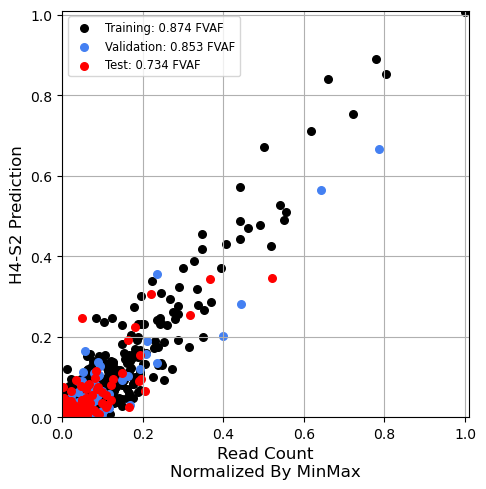

In [20]:
fontsize=12
# Plotting
plt.figure(figsize=(5, 5))

# Training set
plt.scatter(y_train, y_pred_train, s=30, color='black', label='Training: {:.3f} FVAF'.format(training_performance_value))

# Validation set
plt.scatter(y_val, y_pred_val, s=30, color=(0.2667, 0.5020, 0.9490), label='Validation: {:.3f} FVAF'.format(validation_performance_value))

# Test set
plt.scatter(y_test, y_pred_test, s=30, color='red', label='Test: {:.3f} FVAF'.format(test_performance_value))

#plt.title('Real vs Predicted Values')
plt.xlabel('Read Count\nNormalized By MinMax', fontsize=fontsize)
plt.ylabel('H4-S2 Prediction', fontsize=fontsize)
plt.xlim([0, 1.01])
plt.ylim([0, 1.01])
plt.gca().set_aspect('equal', adjustable='box')
plt.legend(loc='upper left', fontsize='small')

# Set ticks on both x and y axes
plt.xticks(np.arange(0, 1.1, 0.2))
plt.yticks(np.arange(0, 1.1, 0.2))

# Enable gridlines
plt.grid(True)

plt.tight_layout()
plt.show()

# ██████████████████████████████████
# Test the H4S2 Model with Experimental Replicates
# ██████████████████████████████████


In [21]:
# Function to make predictions using the neural network model
def make_predictions(model, encoded_sequences):
    # Make predictions using the neural network model
    predictions = model.predict(encoded_sequences)
    return predictions

hep_sequences, sequence_labels = encode_sequences_to_numpy_array(hep_folds,sequence_column_name='H4S2')


# Iterate through your datasets and make predictions
for dataset_name, dataset_df in result_dataframes.items():
    encoded_sequences, labels = encode_sequences_to_numpy_array(dataset_df,sequence_column_name='H4S2')
    

    # Make predictions using the neural network model
    predictions = make_predictions(H4S2_model, encoded_sequences)

    # Assuming 'Predictions' is the column where you want to store the model predictions
    dataset_df['H4S2_Prediction'] = predictions

    # Display the modified DataFrame
    print(f"Dataset: {dataset_name}\n")
    print(dataset_df)

128/128 [==============================] - 0s 847us/step
Dataset: iseq1

      Read count                      Sequence    H4S2 N1N3 N8N9  \
0            2.0  CACAAAAAAACAGACTGGAACAAAAACC  AAAAAA  ACA   CC   
1           12.0  CACAAAAATACAGACTGGAACAAAAACC  AAAAAT  ACA   CC   
2           53.0  CACAAAAAGACAGACTGGAACAAAAACC  AAAAAG  ACA   CC   
3            2.0  CACAAAAACACAGACTGGAACAAAAACC  AAAAAC  ACA   CC   
4            3.0  CACAAAATAACAGACTGGAACAAAAACC  AAAATA  ACA   CC   
...          ...                           ...     ...  ...  ...   
4091         0.0  CACCCCCGCACAGACTGGAACAAAAACC  CCCCGC  ACA   CC   
4092         1.0  CACCCCCCAACAGACTGGAACAAAAACC  CCCCCA  ACA   CC   
4093         0.0  CACCCCCCTACAGACTGGAACAAAAACC  CCCCCT  ACA   CC   
4094         0.0  CACCCCCCGACAGACTGGAACAAAAACC  CCCCCG  ACA   CC   
4095         0.0  CACCCCCCCACAGACTGGAACAAAAACC  CCCCCC  ACA   CC   

                                            one_hot_seq  H4S2_Prediction  
0     [[1.0, 0.0, 0.0, 0.0], [1.0, 

16/16 [==============================] - 0s 1ms/step
Dataset: lmo2_crypticnonamer

     Read count                      Sequence    H4S2 N1N3 N8N9  \
0           0.0  CACAAAAAGACAGACTGGATGGAAAATA  AAAAAG  TGG   TA   
1           0.0  CACAAAAATACAGACTGGATGGAAAATA  AAAAAT  TGG   TA   
2           0.0  CACAAATAGACAGACTGGATGGAAAATA  AAATAG  TGG   TA   
3           0.0  CACAAATATACAGACTGGATGGAAAATA  AAATAT  TGG   TA   
4           2.0  CACAAAGAGACAGACTGGATGGAAAATA  AAAGAG  TGG   TA   
..          ...                           ...     ...  ...  ...   
507         0.0  CACCCCTATACAGACTGGATGGAAAATA  CCCTAT  TGG   TA   
508         0.0  CACCCCGAGACAGACTGGATGGAAAATA  CCCGAG  TGG   TA   
509         0.0  CACCCCGATACAGACTGGATGGAAAATA  CCCGAT  TGG   TA   
510         1.0  CACCCCCAGACAGACTGGATGGAAAATA  CCCCAG  TGG   TA   
511         2.0  CACCCCCATACAGACTGGATGGAAAATA  CCCCAT  TGG   TA   

                                           one_hot_seq  H4S2_Prediction  
0    [[1.0, 0.0, 0.0, 0.0], [1.0, 0.0,

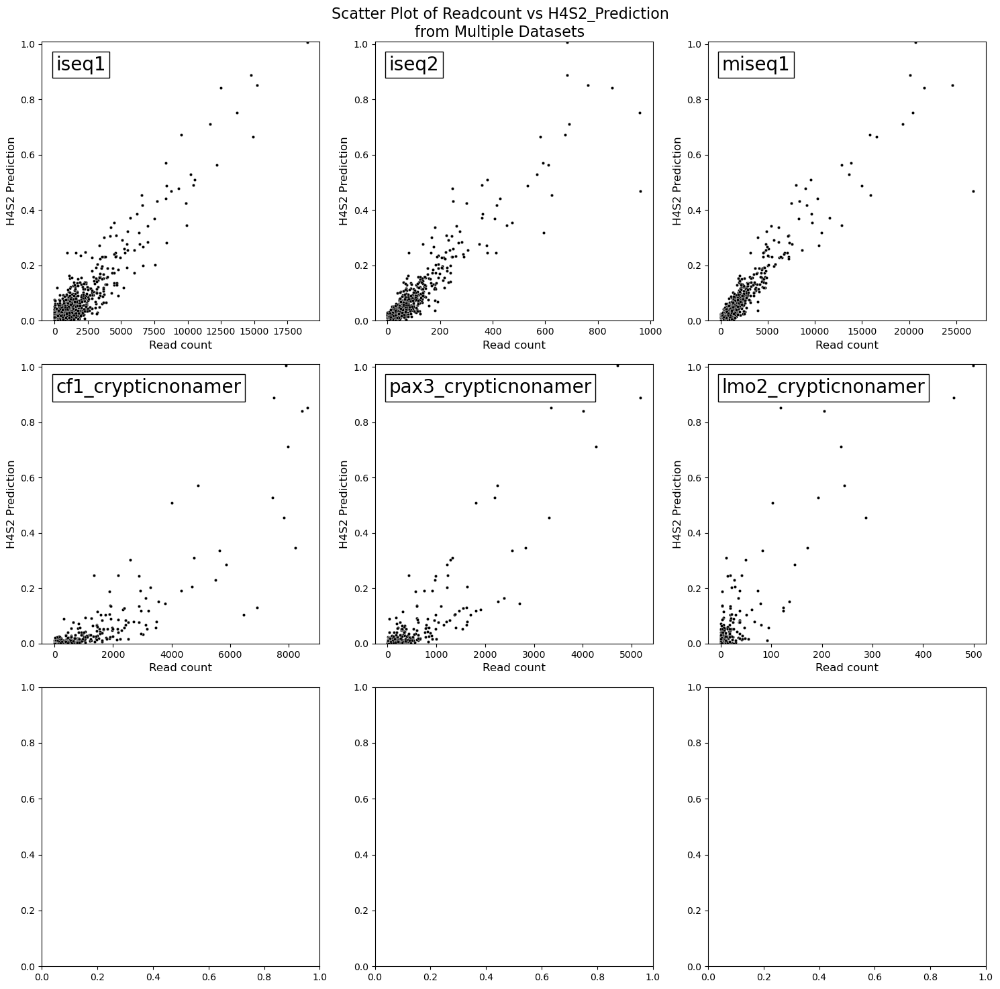

In [22]:
# Assuming 'result_dataframes' is a dictionary containing your dataframes
datasets_count = len(result_dataframes)
grid_size = math.ceil(math.sqrt(datasets_count))

fig, axes = plt.subplots(grid_size, grid_size, figsize=(15, 15))

# Flatten the 2D array of subplots to simplify indexing
axes = axes.flatten()

for i, (dataset_name, dataset_df) in enumerate(result_dataframes.items()):
    # Create a scatter plot on the i-th subplot
    sns.scatterplot(x='Read count', y='H4S2_Prediction', data=dataset_df, ax=axes[i], s=10, color = 'black')  # Adjust point size with 's' parameter

    # Add labels and title
    axes[i].set_xlabel('Read count', fontsize=fontsize)
    axes[i].set_ylabel('H4S2 Prediction', fontsize=fontsize)
    #axes[i].set_title(f'{dataset_name}', fontsize=fontsize)
    
    # Add dataset name label in the upper left corner
    axes[i].text(0.05, 0.95, dataset_name, transform=axes[i].transAxes, fontsize=20,
                 verticalalignment='top', bbox=dict(facecolor='white', alpha=1))
    
    # Set ticks on both x and y axes for each subplot
    #axes[i].set_xticks(np.arange(0, 1.1, 0.2))
    #axes[i].set_xlim([0, 1.01])
    
    axes[i].set_yticks(np.arange(0, 1.1, 0.2))
    axes[i].set_ylim([0, 1.01])
    
# Add a title over the entire figure
fig.suptitle('Scatter Plot of Readcount vs H4S2_Prediction\nfrom Multiple Datasets', fontsize=16)

# Adjust layout to prevent overlapping
plt.tight_layout()

# Show the plot
plt.show()

In [23]:
# Iterate through datasets and calculate metrics
for dataset_name, dataset_df in result_dataframes.items():
    # Perform min-max normalization on the Readcount column
    min_readcount = dataset_df['Read count'].min()
    max_readcount = dataset_df['Read count'].max()
    dataset_df['Normalized_Readcount'] = (dataset_df['Read count'] - min_readcount) / (max_readcount - min_readcount)

    actual_readcounts = dataset_df['Normalized_Readcount']
    predicted_readcounts = dataset_df['H4S2_Prediction']

    # Calculate FVAF score  
    fvaf_score = FVAF(actual_readcounts, predicted_readcounts)

    # Calculate Spearman correlation
    spearman_corr = calculate_spearman_correlation(actual_readcounts, predicted_readcounts)

    # Calculate RMSE
    rmse = calculate_rmse(actual_readcounts, predicted_readcounts)

    print(f"\nMetrics for dataset: {dataset_name}")
    print(f"FVAF Score: {fvaf_score}")
    print(f"Spearman Correlation: {spearman_corr}")
    print(f"RMSE: {rmse}")


Metrics for dataset: iseq1
FVAF Score: 0.8618821851691276
Spearman Correlation: 0.7332370580490031
RMSE: 0.021898804220267982

Metrics for dataset: iseq2
FVAF Score: 0.8856205561370519
Spearman Correlation: 0.7782262126478106
RMSE: 0.02039210641418568

Metrics for dataset: miseq1
FVAF Score: 0.9081479534865626
Spearman Correlation: 0.826438180174251
RMSE: 0.01645639577448017

Metrics for dataset: cf1_crypticnonamer
FVAF Score: 0.5739212308755666
Spearman Correlation: 0.8276738063870733
RMSE: 0.10297198922694459

Metrics for dataset: pax3_crypticnonamer
FVAF Score: 0.7412610764237588
Spearman Correlation: 0.7786357380397738
RMSE: 0.05978781956234798

Metrics for dataset: lmo2_crypticnonamer
FVAF Score: 0.5880020659403189
Spearman Correlation: 0.6562629371840649
RMSE: 0.053897102304220755


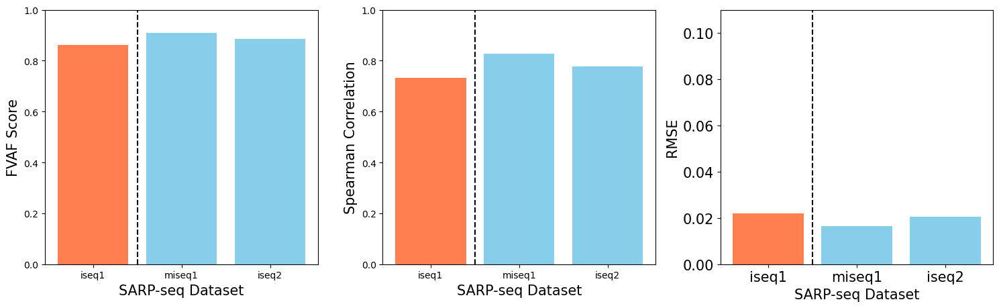

In [24]:

fontsize=15


# Define the names of datasets to compare
datasets_to_compare = ['iseq1', 'miseq1', 'iseq2']

# Initialize empty lists to store metrics for each dataset
fvaf_scores = []
spearman_corrs = []
rmses = []

# Iterate through selected datasets and calculate metrics
for dataset_name in datasets_to_compare:
    dataset_df = result_dataframes[dataset_name]

    # Perform min-max normalization on the Readcount column
    min_readcount = dataset_df['Read count'].min()
    max_readcount = dataset_df['Read count'].max()
    dataset_df['Normalized_Readcount'] = (dataset_df['Read count'] - min_readcount) / (max_readcount - min_readcount)

    actual_readcounts = dataset_df['Normalized_Readcount']
    predicted_readcounts = dataset_df['H4S2_Prediction']

    # Calculate FVAF score
    fvaf_score = FVAF(actual_readcounts, predicted_readcounts)
    fvaf_scores.append(fvaf_score)

    # Calculate Spearman correlation
    spearman_corr = calculate_spearman_correlation(actual_readcounts, predicted_readcounts)
    spearman_corrs.append(spearman_corr)

    # Calculate RMSE
    rmse = calculate_rmse(actual_readcounts, predicted_readcounts)
    rmses.append(rmse)

# Plotting code with subplots
fig, axs = plt.subplots(1, 3, figsize=(15, 4.7))

# Plot FVAF scores
axs[0].bar(datasets_to_compare, fvaf_scores, color=['coral' if dataset == 'iseq1' else 'skyblue' for dataset in datasets_to_compare])
axs[0].set_ylim(0, 1)
axs[0].set_xlabel('SARP-seq Dataset', fontsize=fontsize)
axs[0].set_ylabel('FVAF Score', fontsize=fontsize)
#axs[0].set_title('H4S2 Model Performance\nFVAF Score')
#axs[0].text(0.173, 0.5, 'Training', fontsize=12, ha='center', va='center', transform=axs[0].transAxes, color='black')
#axs[0].text(0.67, 0.5, 'Unseen\nReplicates', fontsize=12, ha='center', va='center', transform=axs[0].transAxes, color='black')

axs[0].axvline(0.5, color='black', linestyle='--')

# Plot Spearman correlations
axs[1].bar(datasets_to_compare, spearman_corrs, color=['coral' if dataset == 'iseq1' else 'skyblue' for dataset in datasets_to_compare])
axs[1].set_ylim(0, 1)
axs[1].set_xlabel('SARP-seq Dataset', fontsize=fontsize)
axs[1].set_ylabel('Spearman Correlation', fontsize=fontsize)
#axs[1].set_title('H4S2 Model Performance\nSpearman Correlation')
#axs[1].text(0.173, 0.5, 'Training', fontsize=12, ha='center', va='center', transform=axs[1].transAxes, color='black')
#axs[1].text(0.67, 0.5, 'Unseen\nReplicates', fontsize=12, ha='center', va='center', transform=axs[1].transAxes, color='black')


axs[1].axvline(0.5, color='black', linestyle='--')

# Plot RMSEs
axs[2].bar(datasets_to_compare, rmses, color=['coral' if dataset == 'iseq1' else 'skyblue' for dataset in datasets_to_compare])
axs[2].set_ylim(0, 0.11)
axs[2].set_xlabel('SARP-seq Dataset', fontsize=fontsize)
axs[2].set_ylabel('RMSE', fontsize=fontsize)
#axs[2].set_title('H4S2 Model Performance\nRMSE')
#axs[2].text(0.173, 0.5, 'Training', fontsize=12, ha='center', va='center', transform=axs[2].transAxes, color='black')
#axs[2].text(0.67, 0.5, 'Unseen\nReplicates', fontsize=12, ha='center', va='center', transform=axs[2].transAxes, color='black')
axs[2].axvline(0.5, color='black', linestyle='--')

# Set tick label size for x-axis
plt.xticks(fontsize=fontsize)

# Set tick label size for y-axis
plt.yticks(fontsize=fontsize)

plt.tight_layout()
plt.show()

In [25]:
# Iterate through selected datasets and calculate metrics
for dataset_name, dataset_df in result_dataframes.items():

    # Perform min-max normalization on the Readcount column
    min_readcount = dataset_df['Read count'].min()
    max_readcount = dataset_df['Read count'].max()
    dataset_df['Normalized_Readcount'] = (dataset_df['Read count'] - min_readcount) / (max_readcount - min_readcount)

    actual_readcounts = dataset_df['Normalized_Readcount']
    predicted_readcounts = dataset_df['H4S2_Prediction']


# Iterate through your datasets and make predictions
for dataset_name, dataset_df in result_dataframes.items():
    # Display the modified DataFrame
    print(f"Dataset: {dataset_name}\n")
    print(dataset_df)
    
# Convert the dict of DataFrames to an Excel file with each DataFrame in its own sheet
with pd.ExcelWriter('H4S2_predictions_output.xlsx') as writer:
    for dataset_name, dataset_df in result_dataframes.items():
        dataset_df.to_excel(writer, sheet_name=dataset_name, index=False)

print("All dataframes have been written to predictions_output.xlsx")

Dataset: iseq1

      Read count                      Sequence    H4S2 N1N3 N8N9  \
0            2.0  CACAAAAAAACAGACTGGAACAAAAACC  AAAAAA  ACA   CC   
1           12.0  CACAAAAATACAGACTGGAACAAAAACC  AAAAAT  ACA   CC   
2           53.0  CACAAAAAGACAGACTGGAACAAAAACC  AAAAAG  ACA   CC   
3            2.0  CACAAAAACACAGACTGGAACAAAAACC  AAAAAC  ACA   CC   
4            3.0  CACAAAATAACAGACTGGAACAAAAACC  AAAATA  ACA   CC   
...          ...                           ...     ...  ...  ...   
4091         0.0  CACCCCCGCACAGACTGGAACAAAAACC  CCCCGC  ACA   CC   
4092         1.0  CACCCCCCAACAGACTGGAACAAAAACC  CCCCCA  ACA   CC   
4093         0.0  CACCCCCCTACAGACTGGAACAAAAACC  CCCCCT  ACA   CC   
4094         0.0  CACCCCCCGACAGACTGGAACAAAAACC  CCCCCG  ACA   CC   
4095         0.0  CACCCCCCCACAGACTGGAACAAAAACC  CCCCCC  ACA   CC   

                                            one_hot_seq  H4S2_Prediction  \
0     [[1.0, 0.0, 0.0, 0.0], [1.0, 0.0, 0.0, 0.0], [...         0.002614   
1     [[1.0, 0.

All dataframes have been written to predictions_output.xlsx


# ███████████████████
# H4S2 Model SHAP Analysis
# ███████████████████

## • Position-wise SHAP values - First Order Interaction

In [26]:
# Explain model predictions using SHAP
explainer = shap.Explainer(H4S2_model, hep_sequences)
shap_values = explainer.shap_values(hep_sequences)

# Get the expected value (average model output)
expected_value = np.mean(hep_read_count)

PermutationExplainer explainer: 4097it [01:42, 36.92it/s]                          


In [27]:
label_dict = {
    "Position_1_A": "H4_A",
    "Position_1_T": "H4_T",
    "Position_1_G": "H4_G",
    "Position_1_C": "H4_C",
    "Position_2_A": "H5_A",
    "Position_2_T": "H5_T",
    "Position_2_G": "H5_G",
    "Position_2_C": "H5_C",
    "Position_3_A": "H6_A",
    "Position_3_T": "H6_T",
    "Position_3_G": "H6_G",
    "Position_3_C": "H6_C",
    "Position_4_A": "H7_A",
    "Position_4_T": "H7_T",
    "Position_4_G": "H7_G",
    "Position_4_C": "H7_C",
    "Position_5_A": "S1_A",
    "Position_5_T": "S1_T",
    "Position_5_G": "S1_G",
    "Position_5_C": "S1_C",
    "Position_6_A": "S2_A",
    "Position_6_T": "S2_T",
    "Position_6_G": "S2_G",
    "Position_6_C": "S2_C",
    "Position_7_A": "N1_A",
    "Position_7_T": "N1_T",
    "Position_7_G": "N1_G",
    "Position_7_C": "N1_C",
    "Position_8_A": "N2_A",
    "Position_8_T": "N2_T",
    "Position_8_G": "N2_G",
    "Position_8_C": "N2_C",
    "Position_9_A": "N3_A",
    "Position_9_T": "N3_T",
    "Position_9_G": "N3_G",
    "Position_9_C": "N3_C",
    "Position_10_A": "N8_A",
    "Position_10_T": "S8_T",
    "Position_10_G": "N8_G",
    "Position_10_C": "N8_C",
    "Position_11_A": "N9_A",
    "Position_11_T": "N9_T",
    "Position_11_G": "N9_G",
    "Position_11_C": "N9_C"
}

# Map sequence_labels to more descriptive labels from label_dict
descriptive_labels = [label_dict.get(label, label) for label in sequence_labels]

# Compute the mean absolute SHAP values for each feature across all sequences
feature_importances = np.abs(shap_values).mean(axis=0)

# Get the feature order from highest to lowest importance
feature_order = np.argsort(feature_importances)[::1]

# Now you can use feature_order for further analysis or plotting
print("Feature order:", feature_order)

# Assuming 'descriptive_labels' is a list containing the labels
ordered_labels = [descriptive_labels[i] for i in feature_order]

# Now 'ordered_labels' contains the descriptive labels ordered by feature importance
print("Ordered labels:", ordered_labels)

# Create Array of 1 to number of features
position_order = np.arange(len(feature_importances))

# Now 'position_order' contains the labels ordered by position
print("Position Ordered labels:", position_order)

position_labels = ["H4", "H5", "H6", "H7", "S1", "S2"]
print("Position labels:", position_labels)


Feature order: [16  6  4 12 17  1  2  0 11 20 23  5 19  3 22 18 21  8 14 15 13 10  7  9]
Ordered labels: ['S1_A', 'H5_G', 'H5_A', 'H7_A', 'S1_T', 'H4_T', 'H4_G', 'H4_A', 'H6_C', 'S2_A', 'S2_C', 'H5_T', 'S1_C', 'H4_C', 'S2_G', 'S1_G', 'S2_T', 'H6_A', 'H7_G', 'H7_C', 'H7_T', 'H6_G', 'H5_C', 'H6_T']
Position Ordered labels: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
Position labels: ['H4', 'H5', 'H6', 'H7', 'S1', 'S2']


In [28]:
# Create a Mask to Find Corresponding Data in SHAP Values
def find_indices(encoded_sequences, target_sequences):
    indices = []
    for seq in target_sequences:
        mask = np.all(encoded_sequences == seq, axis=1)
        indices.extend(np.where(mask)[0])
    return indices

# Function to create a custom colormap for each sequence that transitions from one color to the same color
def create_fake_colormap(color):
    colors = [color, color]  # From the specified color to the same color
    n_bins = 100  # Discretize the interpolation into bins
    cmap_name = f'fake_cmap_{color}'
    return LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)

# Function to plot SHAP decision plots for the specified sequences
def plot_shap_decision_plots_colored(sequences_colors, expected_value, shap_values, sequences_array_numeric, position_labels, feature_order, plot_size=(10, 6)):
    legend_handles = []  # To store legend handles

    for sequence, color in sequences_colors.items():
        sequence_numeric = sequences_array_numeric[sequence]  # Corrected variable name
        sequence_index = np.where(np.all(sequences_array_numeric == sequence_numeric, axis=1))[0]
        if len(sequence_index) > 0:
            filtered_shap_values = shap_values[sequence_index]
            filtered_sequences_array_numeric = sequences_array_numeric[sequence_index]

            # Create custom colormap for the sequence
            fake_cmap = create_fake_colormap(color)

            shap.decision_plot(
                expected_value,
                filtered_shap_values,
                filtered_sequences_array_numeric,
                feature_display_range=slice(None, -25, -1),
                xlim=(-0.05, 1.1),
                alpha=0.8,
                show=False,
                color_bar=False,
                plot_color=fake_cmap,
                
                feature_names=descriptive_labels,
                feature_order=feature_order
                #feature_order=np.array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23])
                
            )

            handle, = plt.plot([], [], color=color)  # Store handle for legend
            legend_handles.append(handle)

            # Remove feature value annotations by setting their visibility to False
            ax = plt.gca()
            for text in ax.texts:
                if '(' in text.get_text():
                    text.set_visible(False)

            # Increase line thickness for solid lines (data lines) only
            for line in ax.get_lines():
                if line.get_linestyle() == '-':  # target solid lines only
                    line.set_linewidth(2.5)  # Set the desired line width here

    # Set the size of the current figure
    plt.gcf().set_size_inches(*plot_size)

    # Add legend with custom labels
    legend_labels = [sequences_to_plot.iloc[sequence]['Sequence'] for sequence in sequences_colors]  # Get legend labels
    plt.legend(legend_handles, legend_labels, loc='lower right', fontsize='x-small')
    plt.xlabel("H4S2 Prediction", fontsize=fontsize)
    plt.title('')
    plt.show()

# Example sequences to plot with custom colors
sequences_colors = {
    0: 'blue',
    1: 'red',
    2: 'green',
    3: 'orange',
    4: 'purple'
}

# Example sequences to plot
sequences_to_plot = pd.DataFrame(data=['AGTGAT', 'ATTGAT', 'TGTAAC', 'ACTTCT', 'TGCTTA'], columns=['Sequence'])
sequences_to_plot_encoded, sequences_to_plot_labels = encode_sequences_to_numpy_array(sequences_to_plot, sequence_column_name='Sequence')

# Find the indices of the sequences of interest in the entire dataset
indices_to_plot = find_indices(hep_sequences, sequences_to_plot_encoded)

# Extract the SHAP values and sequences for the selected indices
shap_values_to_plot = shap_values[indices_to_plot]
sequences_array_numeric_to_plot = hep_sequences[indices_to_plot]

# Plot SHAP decision plots for the sequences of interest with colors and legend
#plot_shap_decision_plots_colored(sequences_colors, expected_value, shap_values_to_plot, sequences_array_numeric_to_plot, descriptive_labels, position_order[::-1], plot_size=(4, 8))


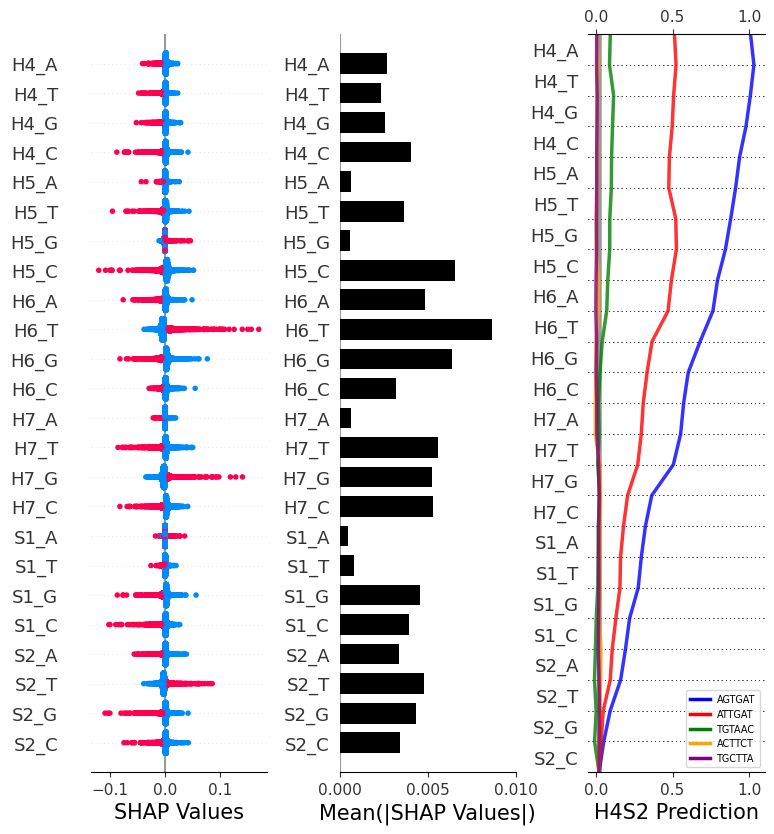

<Figure size 640x480 with 0 Axes>

In [29]:
# Create subplots
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 20))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Plot SHAP summary plot (Dot plot)
plt.sca(ax1)
shap.summary_plot(shap_values, hep_sequences, feature_names=descriptive_labels, max_display=np.shape(hep_sequences)[1], plot_type='dot', show=False, sort=False, color_bar= False)
ax1.set_xlabel("SHAP Values", fontsize=fontsize)


# Plot SHAP summary plot (Bar plot)
plt.sca(ax2)
shap.summary_plot(shap_values, hep_sequences, feature_names=descriptive_labels, max_display=np.shape(hep_sequences)[1], plot_type='bar', color='black', show=False, sort=False)
ax2.set_xlabel("Mean(|SHAP Values|)", fontsize=fontsize)
ax2.set_xlim(0, 0.01)

# Add vertical line at global average
#global_avg_H4S2 = np.mean(abs(shap_values))
#plt.axvline(x=global_avg_H4S2, color='r', linestyle='--', linewidth=1)
#plt.text(global_avg_H4S2 + 0.0005, 0.3, f'Global Mean\n= {global_avg_H4S2:.3f}', color='red', fontsize=10, va='center', ha='left')

# Example sequences to plot with custom colors
sequences_colors = {
    0: 'blue',
    1: 'red',
    2: 'green',
    3: 'orange',
    4: 'purple'
}

# Example sequences to plot
sequences_to_plot = pd.DataFrame(data=['AGTGAT', 'ATTGAT', 'TGTAAC', 'ACTTCT', 'TGCTTA'], columns=['Sequence'])
sequences_to_plot_encoded, sequences_to_plot_labels = encode_sequences_to_numpy_array(sequences_to_plot, sequence_column_name='Sequence')

# Find the indices of the sequences of interest in the entire dataset
indices_to_plot = find_indices(hep_sequences, sequences_to_plot_encoded)

# Extract the SHAP values and sequences for the selected indices
shap_values_to_plot = shap_values[indices_to_plot]
sequences_array_numeric_to_plot = hep_sequences[indices_to_plot]

# Plot SHAP decision plots (Customized plot)
plt.sca(ax3)
# Plot SHAP decision plots for the sequences of interest with colors and legend
plot_shap_decision_plots_colored(sequences_colors, expected_value, shap_values_to_plot, sequences_array_numeric_to_plot, descriptive_labels, position_order[::-1], plot_size=(8, 8))

# Adjust layout and display the combined plot
plt.tight_layout()
plt.show()

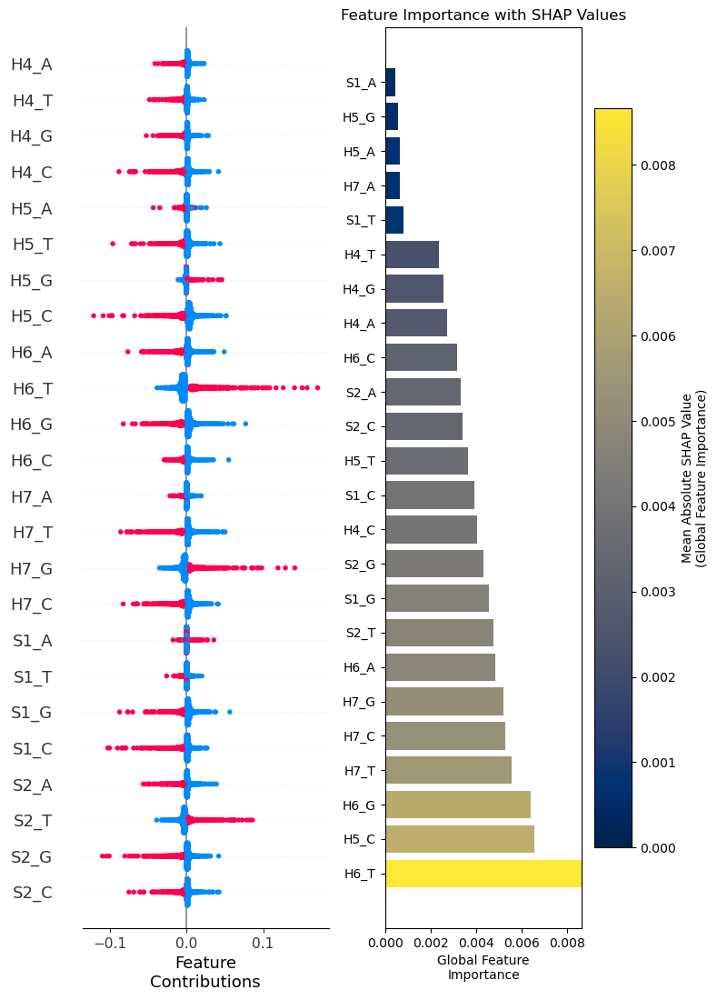

In [30]:
# Create subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 20))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Plot SHAP summary plot (Dot plot)
plt.sca(ax1)
shap.summary_plot(shap_values, hep_sequences, feature_names=descriptive_labels, max_display=np.shape(hep_sequences)[1], plot_type='dot', show=False, sort=False, color_bar=False)
ax1.set_xlabel("Feature\nContributions")

# Plot SHAP summary plot (Bar plot) with colormap
# Compute mean absolute SHAP values for each feature
mean_abs_shap = np.abs(shap_values).mean(axis=0)
sorted_idx = np.argsort(mean_abs_shap)
sorted_features = [descriptive_labels[i] for i in sorted_idx]
sorted_mean_abs_shap = mean_abs_shap[sorted_idx]

# Create a colormap
cmap = plt.get_cmap('cividis')
normalize = mcolors.Normalize(vmin=0, vmax=sorted_mean_abs_shap.max())
colors = cmap(normalize(sorted_mean_abs_shap))

plt.sca(ax2)
bar_plot = ax2.barh(sorted_features, sorted_mean_abs_shap, color=colors)
ax2.set_xlabel("Global Feature\nImportance")
ax2.set_xlim(0, sorted_mean_abs_shap.max())
ax2.set_title("Feature Importance with SHAP Values")
ax2.invert_yaxis()  # Invert y-axis to have the most important feature at the top

# Create a color bar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=normalize)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax2, orientation='vertical')
cbar.set_label('Mean Absolute SHAP Value\n(Global Feature Importance)')

# Adjust layout and display the combined plot
plt.tight_layout()
plt.show()

## • Pair-wise SHAP value cooperative relationship vectors - Second Order Interactions

Combination (0, 0): RMSE = 0.008, Spearman Correlation = 0.624, Length = 0.013
Combination (0, 1): RMSE = 0.005, Spearman Correlation = -0.872, Length = 0.035
Combination (1, 0): RMSE = 0.026, Spearman Correlation = -0.870, Length = 0.057
Combination (1, 1): RMSE = 0.024, Spearman Correlation = 0.907, Length = 0.181


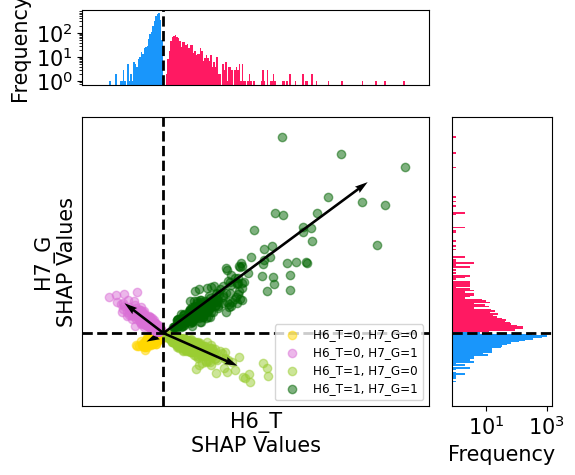

Combination (0, 0): RMSE = 0.004, Spearman Correlation = 0.913, Length = 0.040
Combination (0, 1): RMSE = 0.036, Spearman Correlation = -0.822, Length = 0.065
Combination (1, 0): RMSE = 0.014, Spearman Correlation = -0.785, Length = 0.053
Combination (1, 1): RMSE = 0.018, Spearman Correlation = 0.491, Length = 0.023


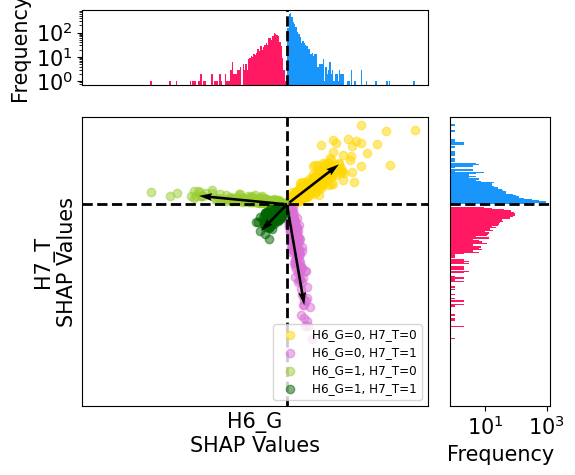

In [31]:
def generate_scatter_plot(sequences, shap_values, descriptive_labels, position_labels, position1, position2, threshold_percentile=99):
    """
    Generates a scatter plot of SHAP values for two features, colored by state combinations.
    Also fits direction vectors to each combination with different lengths and displays them.
    Additionally, adds histograms of the feature value distributions for position1 and position2.

    Args:
        sequences: Array-like data with feature values.
        shap_values: Array-like with SHAP values for each feature.
        descriptive_labels: List of feature names.
        position_labels: List of labels for possible feature states.
        position1: Name of the first feature to plot.
        position2: Name of the second feature to plot.
        threshold_percentile: Percentile threshold for calculating vector length (default is 99).
    """
    # Increase the font size
    plt.rcParams.update({'font.size': 15})

    # Define colors for each combination of binary variables
    colors = {
        (0, 0): 'gold',    # (Position1 = 0, Position2 = 0)
        (0, 1): 'orchid',  # (Position1 = 0, Position2 = 1)
        (1, 0): 'yellowgreen',  # (Position1 = 1, Position2 = 0)
        (1, 1): 'darkgreen',     # (Position1 = 1, Position2 = 1)
    }

    # Get SHAP colors for binary values
    shap_color_0 = shap.plots.colors.blue_rgb
    shap_color_1 = shap.plots.colors.red_rgb

    # Find the indices of the positions in the feature names
    index_position1 = descriptive_labels.index(position1)
    index_position2 = descriptive_labels.index(position2)

    # Extract the SHAP values for the specified positions
    shap_values_position1 = shap_values[:, index_position1]
    shap_values_position2 = shap_values[:, index_position2]

    # Extract the corresponding feature values for the specified positions
    feature_values_position1 = sequences[:, index_position1]
    feature_values_position2 = sequences[:, index_position2]

    # Create the layout for the scatter plot and histograms
    fig = plt.figure(figsize=(6, 5))
    gs = GridSpec(4, 4, fig)
    
    ax_scatter = fig.add_subplot(gs[1:4, 0:3])
    ax_histx = fig.add_subplot(gs[0, 0:3], sharex=ax_scatter)
    ax_histy = fig.add_subplot(gs[1:4, 3], sharey=ax_scatter)

    # Create a scatter plot
    for combination, color in colors.items():
        mask = (feature_values_position1 == combination[0]) & (feature_values_position2 == combination[1])
        x, y = shap_values_position1[mask], shap_values_position2[mask]

        # Combine x and y values into a single matrix
        data = np.vstack((x, y)).T

        # Fit PCA to the data
        pca = PCA(n_components=1)
        pca.fit(data)

        # Get the principal component (direction vector)
        direction_vector = pca.components_[0]

        # Calculate the centroid of the data points
        centroid = np.mean(data, axis=0)

        # Ensure that the direction vector points towards the centroid
        if np.dot(direction_vector, centroid) < 0:
            direction_vector *= -1

        # Calculate the magnitude of the direction vector based on the threshold percentile of x and y
        x_threshold = np.percentile(np.abs(x), threshold_percentile)
        y_threshold = np.percentile(np.abs(y), threshold_percentile)
        magnitude_position = np.sqrt(x_threshold ** 2 + y_threshold ** 2)
        scaled_direction_vector = direction_vector * magnitude_position

        # Plot data points
        ax_scatter.scatter(x, y, c=color, alpha=0.5, label=f'{position1}={combination[0]}, {position2}={combination[1]}')

        # Plot direction vector
        ax_scatter.quiver(0, 0, scaled_direction_vector[0], scaled_direction_vector[1], scale=1, scale_units='xy', angles='xy', color='black')

        # Calculate RMSE
        rmse = np.sqrt(np.mean((y - np.dot(data, direction_vector)) ** 2))  # Root Mean Square Error

        # Calculate Spearman correlation coefficient
        spearman_corr, _ = spearmanr(x, y)

        # Print metrics
        print(f'Combination {combination}: RMSE = {rmse:.3f}, Spearman Correlation = {spearman_corr:.3f}, Length = {magnitude_position:.3f}')

    # Add labels and title
    ax_scatter.set_xlabel(f'{position1}\nSHAP Values')
    ax_scatter.set_ylabel(f'{position2}\nSHAP Values')
    #ax_scatter.set_title(f'Scatter Plot with Direction Vectors of Different Lengths for {position1} and {position2}')

    # Add lines at the origin
    ax_scatter.axhline(y=0, color='black', linestyle='--', linewidth=2)
    ax_scatter.axvline(x=0, color='black', linestyle='--', linewidth=2)

    # Determine the minimum and maximum values across both positions
    min_val = min(0, shap_values_position1.min(), shap_values_position2.min())  # Include 0
    max_val = max(0, shap_values_position1.max(), shap_values_position2.max())  # Include 0

    # Generate equally spaced bin edges
    bins = np.linspace(min_val, max_val, 200)

    # Overlay histograms for position1
    ax_histx.hist(shap_values_position1[feature_values_position1 == 0], bins=bins, color=shap_color_0, alpha=0.9, label=f'{position1}=0')
    ax_histx.hist(shap_values_position1[feature_values_position1 == 1], bins=bins, color=shap_color_1, alpha=0.9, label=f'{position1}=1')
    #ax_histx.set_ylim(0, 1500)
    ax_histx.set_ylabel('Frequency')
    #ax_histx.set_xlabel(f'{position1}\nSHAP Values')
    ax_histx.set_yscale('log')
    ax_histx.set_xticks([])
    
    
    # Add Axis line
    ax_histx.axvline(x=0, color='black', linestyle='--', linewidth=2)

    # Overlay histograms for position2
    ax_histy.hist(shap_values_position2[feature_values_position2 == 0], bins=bins, color=shap_color_0, alpha=0.9, label=f'{position2}=0', orientation='horizontal')
    ax_histy.hist(shap_values_position2[feature_values_position2 == 1], bins=bins, color=shap_color_1, alpha=0.9, label=f'{position2}=1', orientation='horizontal')
    #ax_histy.set_xlim(0, 1500)
    ax_histy.set_xlabel('Frequency')
    #ax_histy.set_ylabel(f'{position2}\nSHAP Values')
    ax_histy.set_xscale('log')
    ax_histy.set_yticks([])
        
    # Add Axis line
    ax_histy.axhline(y=0, color='black', linestyle='--', linewidth=2)
    
    # Legend for scatter plot
    ax_scatter.legend(loc='lower right', bbox_to_anchor=(1, 0),fontsize='xx-small')
    ax_scatter.set_ylim(shap_values_position2.min()*1.5, shap_values_position2.max()*1.1)
    ax_scatter.set_xlim(shap_values_position1.min()*1.5, shap_values_position1.max()*1.1)
    
    

    plt.tight_layout()
    plt.show()

# Example usage:
generate_scatter_plot(hep_sequences, shap_values, descriptive_labels, position_labels, 'H6_T', 'H7_G', threshold_percentile=99)
generate_scatter_plot(hep_sequences, shap_values, descriptive_labels, position_labels, 'H6_G', 'H7_T', threshold_percentile=99)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


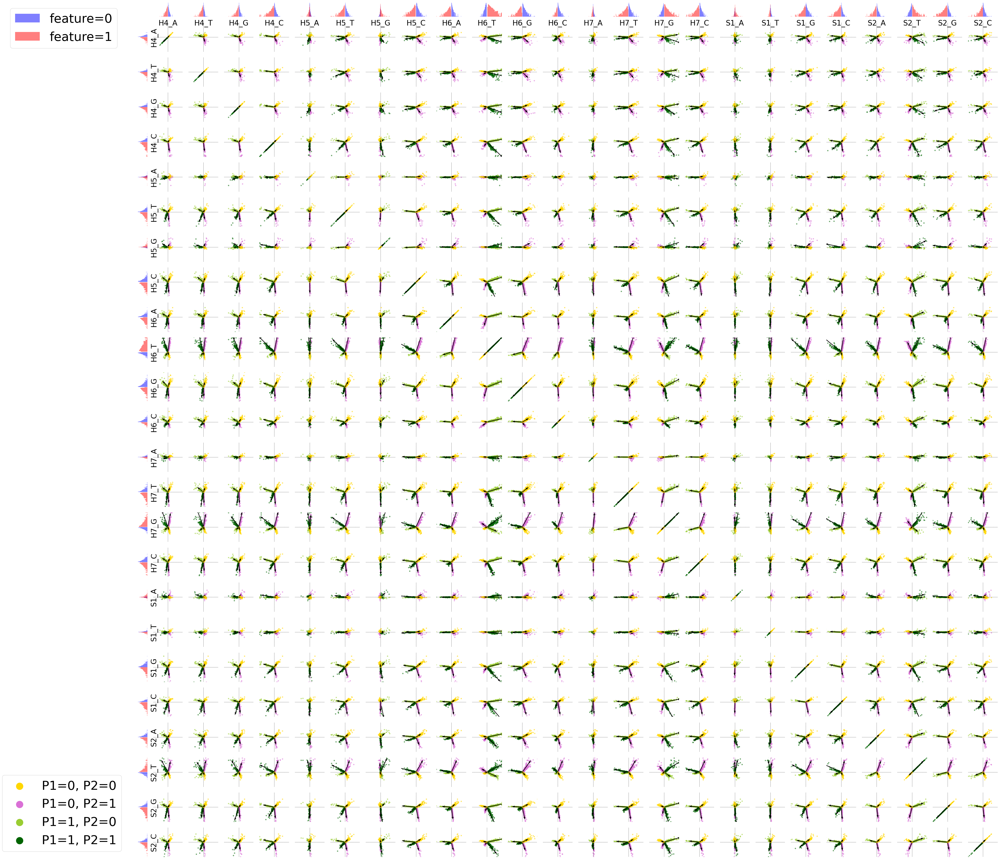

In [32]:
# Function to calculate vector magnitude
def calculate_magnitude(data, threshold_percentile):
    x_threshold = np.percentile(np.abs(data[:, 0]), threshold_percentile)
    y_threshold = np.percentile(np.abs(data[:, 1]), threshold_percentile)
    magnitude_position = np.sqrt(x_threshold ** 2 + y_threshold ** 2)
    return magnitude_position

# Calculate the number of input variables
num_features = hep_sequences.shape[1]

# Define colors for each combination of binary variables
colors = {
    (0, 0): 'gold',
    (0, 1): 'orchid',
    (1, 0): 'yellowgreen',
    (1, 1): 'darkgreen'
}

# Initialize the results dictionary
results_dict = {comb: np.empty((num_features, num_features), dtype=object) for comb in colors.keys()}

# Create a grid of subplots with histograms
fig = plt.figure(figsize=(50, 50))
gs = GridSpec(num_features + 1, num_features + 1, fig, width_ratios=[1] + [3]*num_features, height_ratios=[1.5] + [3]*num_features)

# Loop through each input variable and create a scatter plot with SHAP values
for i in range(num_features):
    for j in range(num_features):
        # Extract the SHAP values for the current input variables
        shap_values_i = shap_values[:, j]
        shap_values_j = shap_values[:, i]
        
        # Extract the corresponding feature values
        feature_values_i = hep_sequences[:, j]
        feature_values_j = hep_sequences[:, i]
        
        # Get the unique combinations of binary variables
        unique_combinations = set(zip(feature_values_i, feature_values_j))
        
        # Plot the scatter plot
        ax = fig.add_subplot(gs[i+1, j+1])
        for combination in unique_combinations:
            color = colors[combination]
            
            # Filter SHAP values based on the current combination
            mask = np.logical_and(feature_values_i == combination[0], feature_values_j == combination[1])
            shap_values_i_subset = shap_values_i[mask]
            shap_values_j_subset = shap_values_j[mask]
            
            # Plot subset of SHAP values with corresponding color
            scatter = ax.scatter(shap_values_i_subset, shap_values_j_subset, s=10, c=color, alpha=0.5)
            
            # Fit PCA to the subset of SHAP values
            if len(shap_values_i_subset) > 0:
                data = np.vstack((shap_values_i_subset, shap_values_j_subset)).T
                pca = PCA(n_components=2)
                pca.fit(data)
                
                direction_vector = pca.components_[0]
                magnitude_position = calculate_magnitude(data, threshold_percentile=99)
                scaled_direction_vector = direction_vector * magnitude_position
                
                angle = np.arctan2(scaled_direction_vector[1], scaled_direction_vector[0]) * 180 / np.pi
                if angle < 0:
                    angle += 360
                
                if scaled_direction_vector[0] >= 0 and scaled_direction_vector[1] >= 0:
                    quadrant = 1
                elif scaled_direction_vector[0] < 0 and scaled_direction_vector[1] >= 0:
                    quadrant = 2
                elif scaled_direction_vector[0] < 0 and scaled_direction_vector[1] < 0:
                    quadrant = 3
                else:
                    quadrant = 4
                
                ax.quiver(0, 0, scaled_direction_vector[0], scaled_direction_vector[1],
                          scale= 1, units='xy', width=0.003, scale_units='xy', angles='xy', color='black')
                
                rmse = np.sqrt(np.mean((data - pca.inverse_transform(pca.transform(data))) ** 2))
                spearman_corr, _ = spearmanr(shap_values_i_subset, shap_values_j_subset)
                circularity_ratio = np.sum(np.linalg.norm(data - np.mean(data, axis=0), axis=1)**2) / np.sum(np.linalg.norm(data, axis=1)**2)
                elongation_ratio = pca.explained_variance_ratio_[1] / pca.explained_variance_ratio_[0]
                
                results_dict[combination][i, j] = [scaled_direction_vector, magnitude_position, rmse,
                                                   spearman_corr, circularity_ratio, elongation_ratio,
                                                   angle, quadrant]
        
        # Remove axis labels and ticks
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.set_ylim(-0.075, 0.075)
        ax.set_xlim(-0.075, 0.075)
        
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
        
        for annotation in ax.texts:
            annotation.set_visible(False)
            
        ax.axhline(y=0, color='black', linestyle='--', linewidth=0.5)
        ax.axvline(x=0, color='black', linestyle='--', linewidth=0.5)

# Create histograms on the top row and left column
for i in range(num_features):
    shap_values_i = shap_values[:, i]
    feature_values_i = hep_sequences[:, i]

    ax_histx = fig.add_subplot(gs[0, i+1])
    ax_histx.hist(shap_values_i[feature_values_i == 0], bins=50, color='blue', alpha=0.5, label=f'feature=0')
    ax_histx.hist(shap_values_i[feature_values_i == 1], bins=50, color='red', alpha=0.5, label=f'feature=1')
    ax_histx.set_yticks([])
    ax_histx.set_xticks([])
    ax_histx.spines['top'].set_visible(False)
    ax_histx.spines['right'].set_visible(False)
    ax_histx.spines['left'].set_visible(False)
    ax_histx.spines['bottom'].set_visible(False)
    ax_histx.set_xlim(-0.075, 0.075)
    ax_histx.set_yscale('log')
    ax_histx.set_xticklabels([])
    ax_histx.set_yticklabels([])
    ax_histx.tick_params(axis='both', which='both', length=0)
    if i == 0:
        ax_histx.legend(loc='upper right', bbox_to_anchor=(-1, 1), fontsize=40)

    ax_histx.set_xlabel(f'{descriptive_labels[i]}', fontsize=24, labelpad=10)

    ax_histy = fig.add_subplot(gs[i+1, 0])
    ax_histy.hist(shap_values_i[feature_values_i == 0], bins=50, color='blue', alpha=0.5, orientation='horizontal')
    ax_histy.hist(shap_values_i[feature_values_i == 1], bins=50, color='red', alpha=0.5, orientation='horizontal')
    ax_histy.set_xticks([])
    ax_histy.set_yticks([])
    ax_histy.spines['top'].set_visible(False)
    ax_histy.spines['right'].set_visible(False)
    ax_histy.spines['left'].set_visible(False)
    ax_histy.spines['bottom'].set_visible(False)
    ax_histy.set_ylim(-0.075, 0.075)
    ax_histy.set_xscale('log')
    ax_histy.set_xticklabels([])
    ax_histy.set_yticklabels([])
    ax_histy.tick_params(axis='both', which='both', length=0)
    ax_histy.invert_xaxis()
    if i == num_features - 1:
        ax_histy.legend(loc='upper right', bbox_to_anchor=(-1, 1), fontsize=24)

    ax_histy.yaxis.set_label_position("right")
    ax_histy.yaxis.tick_right()
    ax_histy.set_ylabel(f'{descriptive_labels[i]}', fontsize=24, rotation=90, labelpad=10)

legend_handles = []
legend_labels = []
for combination, color in colors.items():
    scatter = plt.scatter([], [], c=color, s=500, label=f'P1={combination[0]}, P2={combination[1]}')
    legend_handles.append(scatter)
    legend_labels.append(f'P1={combination[0]}, P2={combination[1]}')

plt.legend(handles=legend_handles, labels=legend_labels, loc='upper right', bbox_to_anchor=(-1, 3), fontsize=40)

plt.tight_layout(pad=0.3)
plt.show()


In [33]:
# Iterate over the results_dict keys and values
for combination, values_array in results_dict.items():
    print(f"Feature Value Combination: {combination}")
    for i in range(num_features):
        for j in range(num_features):
            # Check if the value is None, then convert it to NaN
            if values_array[i, j] is None:
                values_array[i, j] = [np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan]
            
            # Print or visualize the values for each position (i, j)
            print(f"Position ({i}, {j}): {values_array[i, j]}")

Feature Value Combination: (0, 0)
Position (0, 0): [array([0.00877039, 0.00877039]), 0.012403200895294411, 2.3545281448174286e-19, 0.9999999999999999, 0.4052012427156765, 5.1300652297802144e-33, 44.99999999999999, 1]
Position (0, 1): [array([0.00762178, 0.00784777]), 0.0109397912134716, 1.8975806721111322e-19, 0.837590508091422, 0.4368604028082226, 0.09523026978597458, 45.83693273502328, 1]
Position (0, 2): [array([0.01020066, 0.00908328]), 0.013658675070370328, 6.565182932607977e-19, 0.844806595026039, 0.49672918242744185, 0.043692272362850185, 41.68381116871491, 1]
Position (0, 3): [array([0.01220863, 0.00882019]), 0.01506142549696843, 3.257152833529174e-19, 0.8639335424331827, 0.47653873635363125, 0.04620362750132504, 35.84642806696802, 1]
Position (0, 4): [array([0.00267738, 0.00831135]), 0.008731947199842322, 5.532191157187956e-19, 0.3534290455578548, 0.4368083857200296, 0.21046079311046317, 72.14439633066999, 1]
Position (0, 5): [array([0.0157089 , 0.00925125]), 0.018230607446300

In [34]:
# Create lists to store the data
pairwise_position_labels = []
combination_values = []
vectors = []
lengths = []
rmse_values = []
spearman_values = []
circularity_values = []
elongation_values = []
angle_values = []
quadrant_values = []


# Iterate over the results_dict keys and values
for combination, values_array in results_dict.items():
    for i in range(num_features):
        for j in range(num_features):
            # Get the vector information and metrics for the current combination of feature values
            vector_info = values_array[i, j]
            if vector_info is not None:
                # Convert position numbers to descriptive labels
                pairwise_position_label = (descriptive_labels[i], descriptive_labels[j])
                
                pairwise_position_labels.append(pairwise_position_label)
                combination_values.append(combination)
                vectors.append(vector_info[0])
                lengths.append(vector_info[1])
                rmse_values.append(vector_info[2])
                spearman_values.append(vector_info[3])
                circularity_values.append(vector_info[4])
                elongation_values.append(vector_info[5])
                angle_values.append(vector_info[6])
                quadrant_values.append(vector_info[7])
                
                
# Create a DataFrame
data = {
    'Position': pairwise_position_labels,
    'Feature_Value_Combination': combination_values,
    'Vector': vectors,
    'RMSE': rmse_values,
    'Spearman': spearman_values,
    'Length': lengths,
    'Circularity Ratio': circularity_values,
    'Elongation Ratio': elongation_values,
    'Vector Angle': angle_values,
    'Quadrant': quadrant_values
}

vector_df = pd.DataFrame(data)

# Display the DataFrame
print(vector_df)

          Position Feature_Value_Combination  \
0     (H4_A, H4_A)                    (0, 0)   
1     (H4_A, H4_T)                    (0, 0)   
2     (H4_A, H4_G)                    (0, 0)   
3     (H4_A, H4_C)                    (0, 0)   
4     (H4_A, H5_A)                    (0, 0)   
...            ...                       ...   
2299  (S2_C, S1_C)                    (1, 1)   
2300  (S2_C, S2_A)                    (1, 1)   
2301  (S2_C, S2_T)                    (1, 1)   
2302  (S2_C, S2_G)                    (1, 1)   
2303  (S2_C, S2_C)                    (1, 1)   

                                             Vector          RMSE  Spearman  \
0      [0.008770387461481736, 0.008770387461481734]  2.354528e-19  1.000000   
1       [0.007621783596797028, 0.00784776698162899]  1.897581e-19  0.837591   
2       [0.010200655201388008, 0.00908328344489765]  6.565183e-19  0.844807   
3       [0.01220863409057966, 0.008820192267919497]  3.257153e-19  0.863934   
4     [0.0026773824126922704

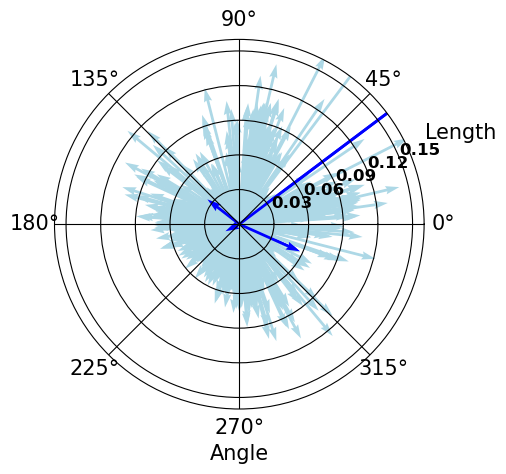

In [35]:

# Define custom colors and line thicknesses for specific positions
custom_styles = {
    ('H7_G', 'H6_T'): {'color': 'blue', 'linewidth': 2},
}

# Filter out rows with valid vectors
valid_vectors_df = vector_df.dropna(subset=['Vector'])

# Filter out rows where the two variables in the position are the same
valid_vectors_df = valid_vectors_df[valid_vectors_df['Position'].apply(lambda x: x[0] != x[1])]

# Create a polar plot
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})

# Define the default color and boundaries for other vectors if needed
default_color = 'lightblue'
boundaries = [0, 45, 90, 135, 180, 225, 270, 315, 360]

# Scale the boundaries to fit within the range [0, 1]
scaled_boundaries = [b / 360 for b in boundaries]

# Create the custom colormap for the default case
color_segments = [(scaled_boundaries[i], default_color) for i in range(len(boundaries))]
color_map = LinearSegmentedColormap.from_list('custom_colormap', color_segments)

# Iterate through each row of the DataFrame
for index, row in valid_vectors_df.iterrows():
    # Extract x and y coordinates from the 'Vector' column
    vector = row['Vector']
    x, y = vector
    
    # Convert Cartesian coordinates to polar coordinates
    r = np.sqrt(x**2 + y**2)
    theta = np.arctan2(y, x)
    
    # Scale theta values for colormap to range [0, 1]
    scaled_theta = (theta + np.pi) / (2 * np.pi)  # Shift and normalize to [0, 1]

    # Determine the style for the current position
    position = row['Position']
    style = custom_styles.get(position, {'color': color_map(scaled_theta), 'linewidth': 1})
    
    # Plot quiver in polar coordinates with default color and linewidth
    ax.quiver(0, 0, theta, r, angles='xy', scale_units='xy', scale=1, color=style['color'], linewidth=style['linewidth'])

# Set labels and title
ax.set_xlabel('Angle')
ax.set_ylabel('Length', rotation=0)
#ax.set_title('Quiver Plot in Polar Projection')

# Set the aspect ratio of the plot to be equal
ax.set_aspect('equal')
ax.set_rlim(0, 0.16)

# Increase spacing between ticks on the radial axis
ax.set_yticks([0.03, 0.06, 0.09, 0.12, 0.15])  # Adjust these values as needed

# Set the font size of the radial axis tick labels
ax.tick_params(axis='y', labelsize=12, labelrotation=0, labelcolor='black')

# Set the background color of the polar plot to white
ax.set_facecolor('white')
# Set the color of the gridlines to black
ax.grid(color='black')

# Reposition the y-label
ax.yaxis.set_label_coords(1.1, 0.72)  # Adjust the coordinates as needed

# Apply bold font weight to radial tick labels
for label in ax.get_yticklabels():
    label.set_fontweight('bold')

# Apply custom styles to specific positions
for index, row in valid_vectors_df.iterrows():
    position = row['Position']
    if position in custom_styles:
        vector = row['Vector']
        x, y = vector
        r = np.sqrt(x**2 + y**2)
        theta = np.arctan2(y, x)
        style = custom_styles[position]
        ax.quiver(0, 0, theta, r, angles='xy', scale_units='xy', scale=1, color=style['color'], linewidth=style['linewidth'])

# Show plot
plt.show()

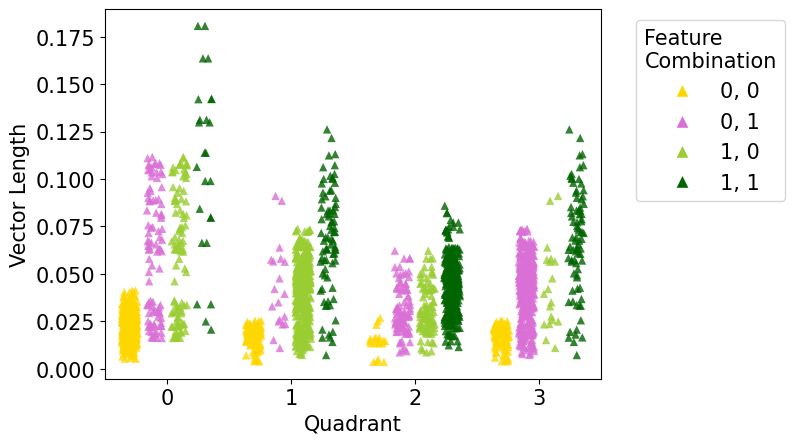

In [36]:

# Define colors for each combination of binary variables
colors = {
    (0, 0): 'gold',         # (H5_G = 0, H6_T = 0)
    (0, 1): 'orchid',       # (H5_G = 0, H6_T = 1)
    (1, 0): 'yellowgreen',  # (H5_G = 1, H6_T = 0)
    (1, 1): 'darkgreen'     # (H5_G = 1, H6_T = 1)
}

# Filter out rows with NaN values in 'Quadrant', 'Length', and 'Feature_Value_Combination' columns
filtered_df = vector_df.dropna(subset=['Quadrant', 'Length', 'Feature_Value_Combination'])

# Overlay points on the strip plot, coloring by Feature_Value_Combination
strip = sns.stripplot(
    x='Quadrant', 
    y='Length', 
    hue='Feature_Value_Combination',  # Color by Feature_Value_Combination
    palette=colors,  # Use custom color palette
    data=filtered_df, 
    jitter=0.25,  # Add jitter to avoid overlapping points
    dodge=True,
    marker='^',  # Change the marker symbol
    size=6,  # Custom size for points
    alpha=0.8,  # Transparency
)

# Access the current axes to modify ticks
ax = plt.gca()

# Format x-axis labels to display as integers
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{int(x)}'))

# Change colors of whiskers and caps (adjusting this based on your actual plot data structure)
for line in strip.lines:
    line.set_color('teal')
    line.set_linewidth(2)

# Set titles and labels
#plt.title('Distribution of Vector Lengths by Quadrant')
plt.xlabel('Quadrant')
plt.ylabel('Vector Length')

# Create custom legend handles
legend_handles = [
    Line2D([0], [0], marker='^', color='w', label='0, 0', markerfacecolor='gold', markersize=10),
    Line2D([0], [0], marker='^', color='w', label='0, 1', markerfacecolor='orchid', markersize=10),
    Line2D([0], [0], marker='^', color='w', label='1, 0', markerfacecolor='yellowgreen', markersize=10),
    Line2D([0], [0], marker='^', color='w', label='1, 1', markerfacecolor='darkgreen', markersize=10)
]

# Move the legend outside the plot
plt.legend(handles=legend_handles, title='Feature\nCombination', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()


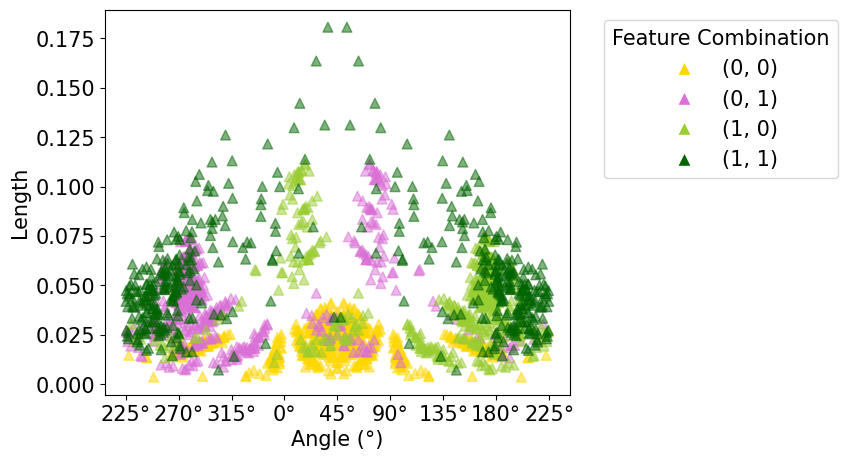

In [37]:

# Increase the font size
plt.rcParams.update({'font.size': 15})

# Filter out rows with valid vectors
valid_vectors_df = vector_df.dropna(subset=['Vector'])

# Filter out rows where the two variables in the position are the same
valid_vectors_df = valid_vectors_df[valid_vectors_df['Position'].apply(lambda x: x[0] != x[1])]

# Define colors for each combination of binary variables
colors = {
    (0, 0): 'gold',  # (H5_G = 0, H6_T = 0)
    (0, 1): 'orchid',  # (H5_G = 0, H6_T = 1)
    (1, 0): 'yellowgreen',  # (H5_G = 1, H6_T = 0)
    (1, 1): 'darkgreen'  # (H5_G = 1, H6_T = 1)
}

# Create a color mapping for the Feature_Value_Combination
valid_vectors_df['Color'] = valid_vectors_df['Feature_Value_Combination'].apply(lambda x: colors[x])

# Unwrap angles around 225 (modify offset as needed)
unwrapped_angles = np.where(valid_vectors_df['Vector Angle'] > 225, valid_vectors_df['Vector Angle'] - 360, valid_vectors_df['Vector Angle'])

# Create the scatter plot
plt.figure(figsize=(6, 5))
scatter = plt.scatter(
    x=unwrapped_angles,
    y=valid_vectors_df['Length'],
    c=valid_vectors_df['Color'],
    marker='^',
    s=50,
    alpha=0.5
)

# Set titles and labels
#plt.title('Scatter Plot of Vector Length vs. Unwrapped Vector Angle')
plt.xlabel('Angle (°)')
plt.ylabel('Length')

# Create tick locations using np.linspace
tick_vals = np.linspace(-135, 225, 9)  # 7 ticks for -135 to 225 with 45° interval

# Adjust tick labels with degree symbol directly during setting
tick_labels = [(f"{val:.0f}°" if val >= 0 else f"{val+360:.0f}°") for val in tick_vals]

plt.xticks(tick_vals, tick_labels, rotation=0)  # Set locations and labels together


# Create custom legend handles
handles = [
    plt.Line2D([0], [0], marker='^', color='w', markerfacecolor='gold', markersize=10, label='(0, 0)'),
    plt.Line2D([0], [0], marker='^', color='w', markerfacecolor='orchid', markersize=10, label='(0, 1)'),
    plt.Line2D([0], [0], marker='^', color='w', markerfacecolor='yellowgreen', markersize=10, label='(1, 0)'),
    plt.Line2D([0], [0], marker='^', color='w', markerfacecolor='darkgreen', markersize=10, label='(1, 1)')
]

# Add the legend to the plot
plt.legend(handles=handles, title='Feature Combination', bbox_to_anchor=(1.05, 1), loc='upper left',fontsize='medium')

# Show the plot
plt.show()

# Increase the font size
plt.rcParams.update({'font.size': 10})

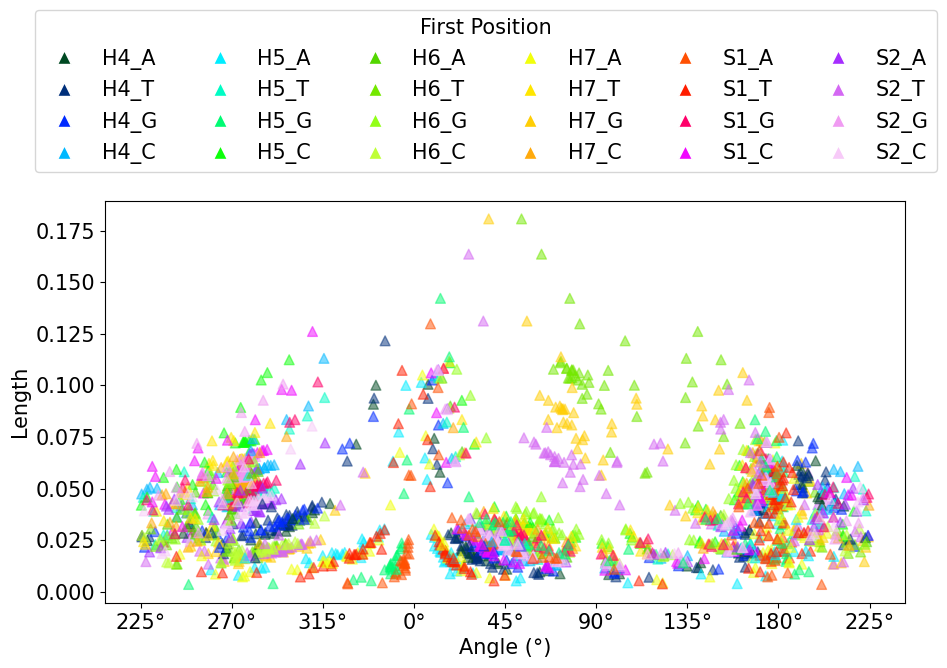

In [38]:
# Increase the font size
plt.rcParams.update({'font.size': 15})

# Filter out rows with valid vectors
valid_vectors_df = vector_df.dropna(subset=['Vector'])

# Filter out rows where the two variables in the position are the same
valid_vectors_df = valid_vectors_df[valid_vectors_df['Position'].apply(lambda x: x[0] != x[1])]

# Extract the first item from the 'Position' and create a unique list of these items
valid_vectors_df['First_Position'] = valid_vectors_df['Position'].apply(lambda x: x[0])
unique_positions = valid_vectors_df['First_Position'].unique()

# Define a color palette with as many colors as unique positions
palette = sns.color_palette('gist_ncar', len(unique_positions))

# Create a color mapping for the First_Position
position_color_mapping = {position: palette[i] for i, position in enumerate(unique_positions)}

# Apply the color mapping to the DataFrame
valid_vectors_df['Color'] = valid_vectors_df['First_Position'].map(position_color_mapping)

# Unwrap angles around 225 (modify offset as needed)
unwrapped_angles = np.where(valid_vectors_df['Vector Angle'] > 225, valid_vectors_df['Vector Angle'] - 360, valid_vectors_df['Vector Angle'])

# Create the scatter plot
plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    x=unwrapped_angles,
    y=valid_vectors_df['Length'],
    c=valid_vectors_df['Color'],
    marker='^',
    s=50,
    alpha=0.5
)

# Set titles and labels
#plt.title('Scatter Plot of Vector Length vs. Unwrapped Vector Angle')
plt.xlabel('Angle (°)')
plt.ylabel('Length')

# Create tick locations using np.linspace
tick_vals = np.linspace(-135, 225, 9)  # 7 ticks for -135 to 225 with 45° interval

# Adjust tick labels with degree symbol directly during setting
tick_labels = [(f"{val:.0f}°" if val >= 0 else f"{val+360:.0f}°") for val in tick_vals]

plt.xticks(tick_vals, tick_labels, rotation=0)  # Set locations and labels together

# Create custom legend handles
handles = [plt.Line2D([0], [0], marker='^', color='w', markerfacecolor=palette[i], markersize=10, label=position) for i, position in enumerate(unique_positions)]

# Determine the number of columns in the legend
num_columns = len(unique_positions) // 4 + (len(unique_positions) % 4 > 0)  # Ensure at least 1 column

# Add the legend to the plot with adjusted layout
plt.legend(handles=handles, title='First Position', bbox_to_anchor=(-0.10, 1.5), loc='upper left', fontsize='medium', ncol=num_columns)

# Show the plot
plt.tight_layout()
plt.show()

# Reset the font size if needed
plt.rcParams.update({'font.size': 10})


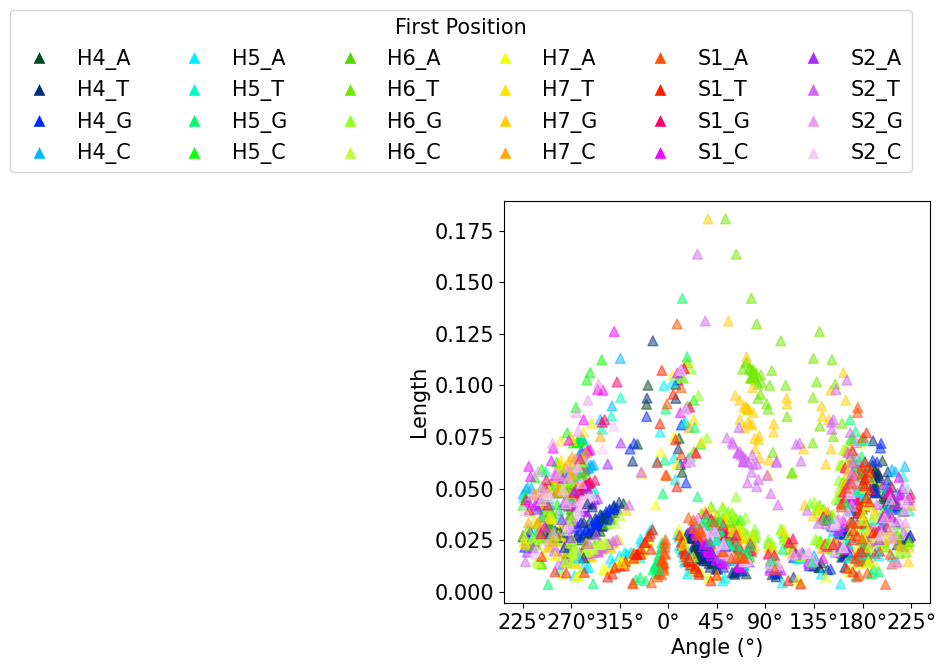

In [39]:
# Increase the font size
plt.rcParams.update({'font.size': 15})

# Filter out rows with valid vectors
valid_vectors_df = vector_df.dropna(subset=['Vector'])

# Filter out rows where the two variables in the position are the same
valid_vectors_df = valid_vectors_df[valid_vectors_df['Position'].apply(lambda x: x[0] != x[1])]

# Extract the first item from the 'Position' and create a unique list of these items
valid_vectors_df['First_Position'] = valid_vectors_df['Position'].apply(lambda x: x[0])
unique_positions = valid_vectors_df['First_Position'].unique()

# Define a color palette with as many colors as unique positions
palette = sns.color_palette('gist_ncar', len(unique_positions))

# Create a color mapping for the First_Position
position_color_mapping = {position: palette[i] for i, position in enumerate(unique_positions)}

# Apply the color mapping to the DataFrame
valid_vectors_df['Color'] = valid_vectors_df['First_Position'].map(position_color_mapping)

# Unwrap angles around 225 (modify offset as needed)
unwrapped_angles = np.where(valid_vectors_df['Vector Angle'] > 225, valid_vectors_df['Vector Angle'] - 360, valid_vectors_df['Vector Angle'])

# Create the scatter plot
plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    x=unwrapped_angles,
    y=valid_vectors_df['Length'],
    c=valid_vectors_df['Color'],
    marker='^',
    s=50,
    alpha=0.5
)

# Set titles and labels
#plt.title('Scatter Plot of Vector Length vs. Unwrapped Vector Angle')
plt.xlabel('Angle (°)')
plt.ylabel('Length')

# Create tick locations using np.linspace
tick_vals = np.linspace(-135, 225, 9)  # 7 ticks for -135 to 225 with 45° interval

# Adjust tick labels with degree symbol directly during setting
tick_labels = [(f"{val:.0f}°" if val >= 0 else f"{val+360:.0f}°") for val in tick_vals]

plt.xticks(tick_vals, tick_labels, rotation=0)  # Set locations and labels together

# Create custom legend handles
handles = [plt.Line2D([0], [0], marker='^', color='w', markerfacecolor=palette[i], markersize=10, label=position) for i, position in enumerate(unique_positions)]

# Determine the number of columns in the legend
num_columns = len(unique_positions) // 4 + (len(unique_positions) % 4 > 0)  # Ensure at least 1 column

# Add the legend to the plot with adjusted layout
plt.legend(handles=handles, title='First Position', bbox_to_anchor=(-0.10, 1.5), loc='upper center', fontsize='medium', ncol=num_columns)

# Show the plot
plt.tight_layout()
plt.show()

# Reset the font size if needed
plt.rcParams.update({'font.size': 10})


Position labels: ['H4', 'H5', 'H6', 'H7', 'S1', 'S2']


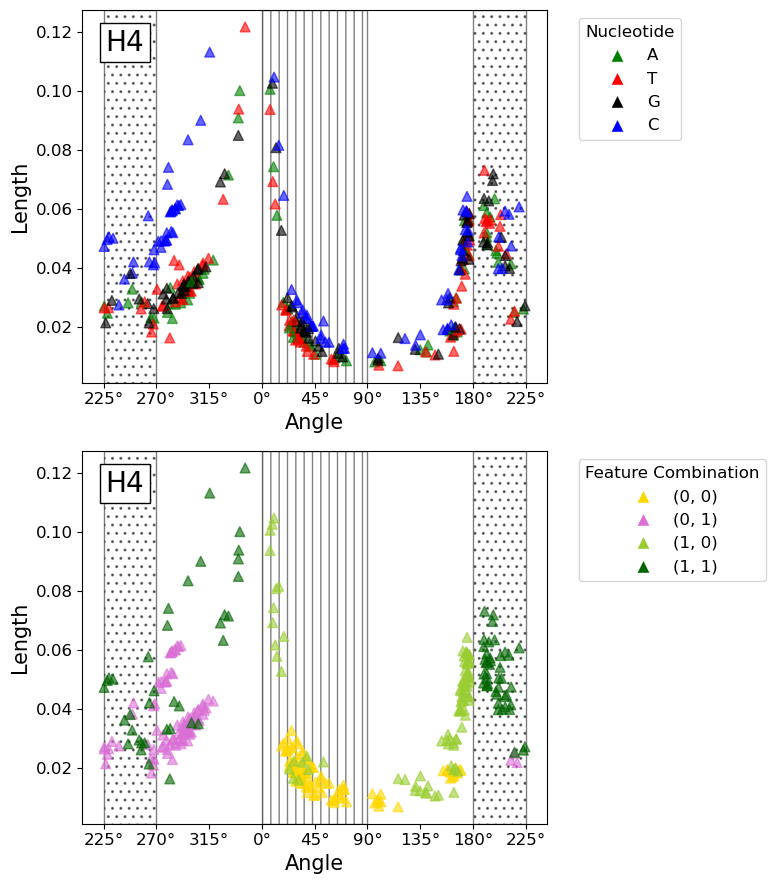

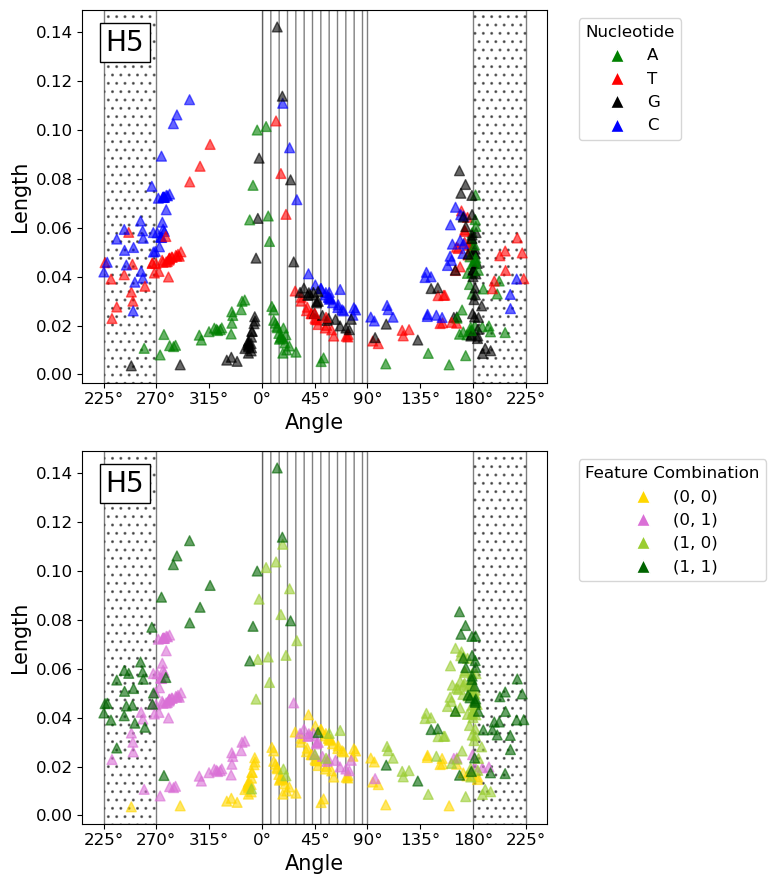

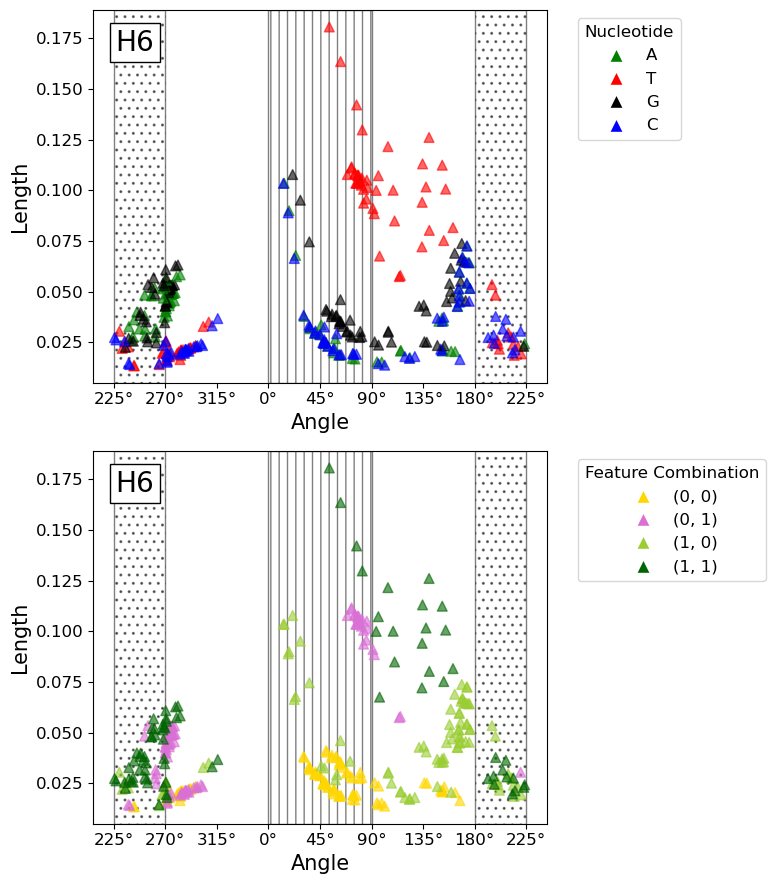

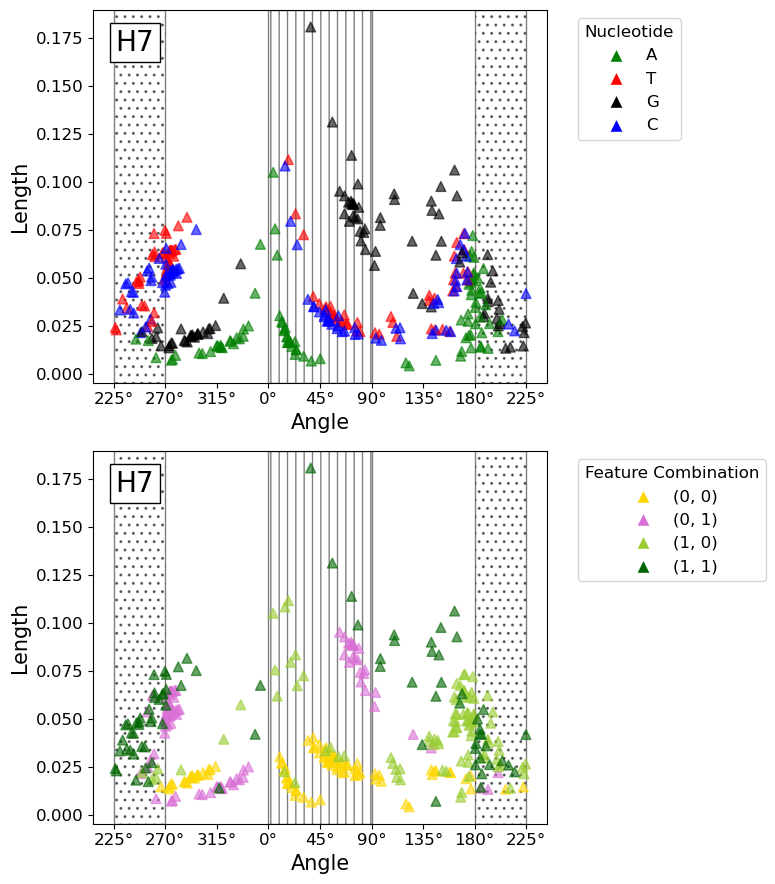

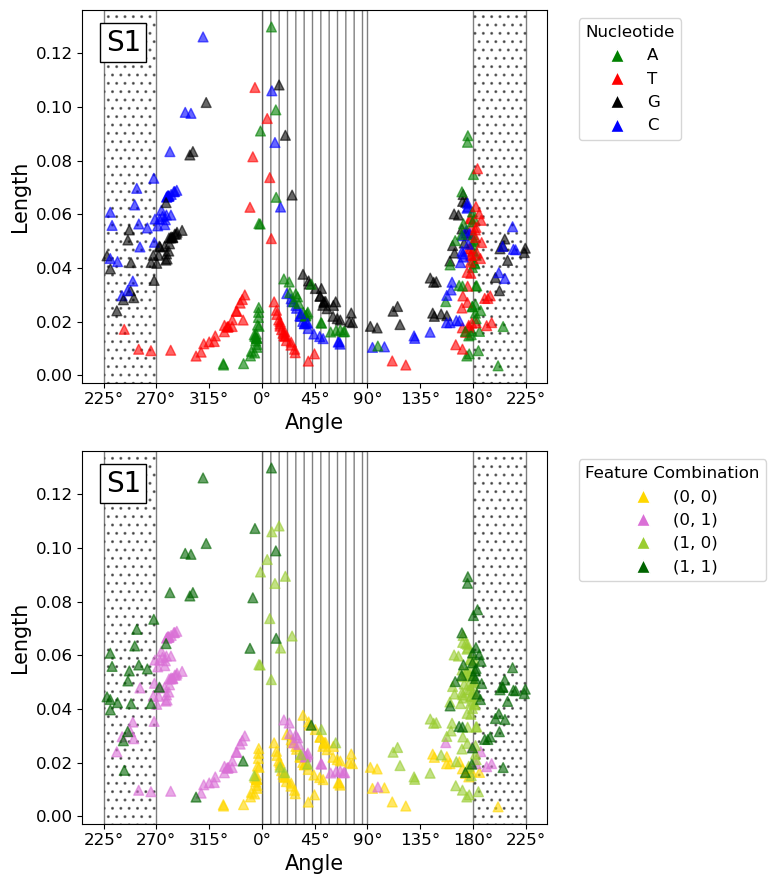

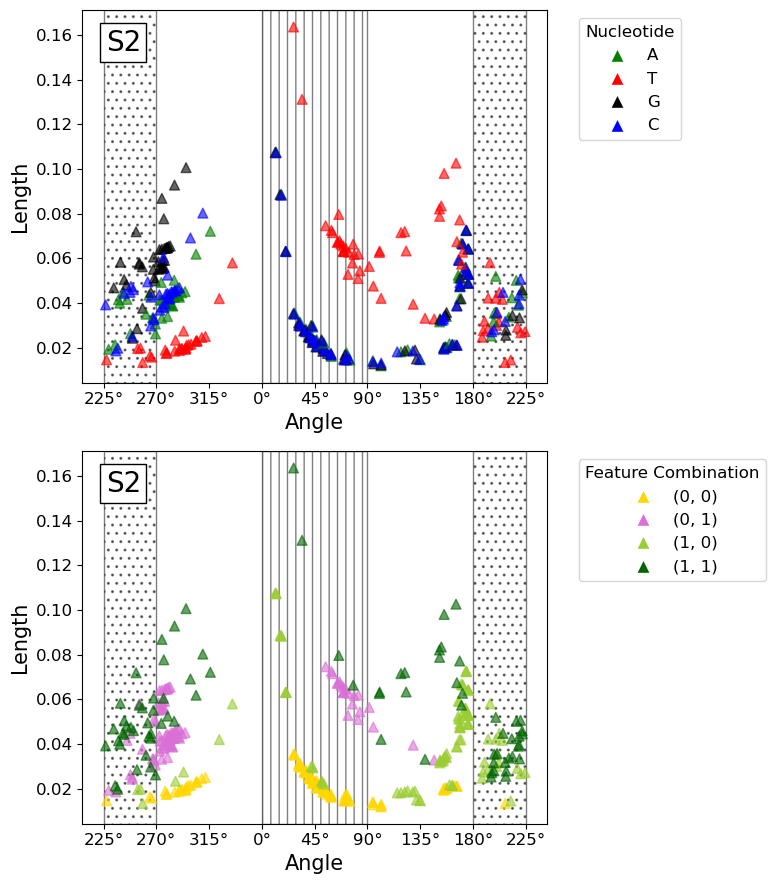

In [40]:
# Change the font size
plt.rcParams.update({'font.size': 12})

# Define colors for each nucleotide
nucleotide_colors = {
    'A': 'green',
    'T': 'red',
    'G': 'black',
    'C': 'blue'
}

# Define colors for each feature combination
feature_combination_colors = {
    (0, 0): 'gold',
    (0, 1): 'orchid',
    (1, 0): 'yellowgreen',
    (1, 1): 'darkgreen'
}

# Filter out rows with valid vectors
valid_vectors_df = vector_df.dropna(subset=['Vector'])

# Filter out rows where the two variables in the position are the same
valid_vectors_df = valid_vectors_df[valid_vectors_df['Position'].apply(lambda x: x[0] != x[1])]

# Define the position labels to mask
position_labels = ["H4", "H5", "H6", "H7", "S1", "S2"]
print("Position labels:", position_labels)

for position_to_mask in position_labels:
    # Extract the first feature in the position
    valid_vectors_df['Feature1'] = valid_vectors_df['Position'].apply(lambda x: x[0])

    # Filter rows based on the position to mask and create a copy to avoid the SettingWithCopyWarning
    mask_condition = valid_vectors_df['Position'].apply(lambda x: x[0].startswith(position_to_mask))
    masked_df = valid_vectors_df.loc[mask_condition].copy()

    # Create color mappings
    masked_df['Nucleotide_Color'] = masked_df['Feature1'].apply(lambda x: nucleotide_colors.get(x[-1], 'gray'))  # Get the last character
    masked_df['Feature_Combination_Color'] = masked_df['Feature_Value_Combination'].map(feature_combination_colors)

    # Unwrap angles around 225 (modify offset as needed)
    unwrapped_angles = np.where(masked_df['Vector Angle'] > 225, masked_df['Vector Angle'] - 360, masked_df['Vector Angle'])

    # Create subplots
    fig, axs = plt.subplots(2, 1, figsize=(8, 9))

    # Plot 1: Colored by Nucleotide
    axs[0].scatter(
        x=unwrapped_angles,
        y=masked_df['Length'],
        c=masked_df['Nucleotide_Color'],
        marker='^',
        s=50,
        alpha=0.6
    )
    axs[0].set_xlabel('Angle', fontsize=15)
    axs[0].set_ylabel('Length', fontsize=15)

    # Add name label in the upper left corner
    axs[0].text(0.05, 0.95, position_to_mask, transform=axs[0].transAxes, fontsize=20,
                verticalalignment='top', bbox=dict(facecolor='white', alpha=1))

    # Fill the background with hatching
    axs[0].axvspan(180, 225, facecolor='none', hatch='..', edgecolor='black', alpha=0.5, zorder=-1, transform=axs[0].get_yaxis_transform())
    axs[0].axvspan(-135, -90, facecolor='none', hatch='..', edgecolor='black', alpha=0.5, zorder=-1, transform=axs[0].get_yaxis_transform())
    axs[0].axvspan(0, 90, facecolor='none', hatch='||', edgecolor='black', alpha=0.5, zorder=-1, transform=axs[0].get_yaxis_transform())

    # Create tick locations using np.linspace for both plots
    tick_vals = np.linspace(-135, 225, 9)
    tick_labels = [(f"{val:.0f}°" if val >= 0 else f"{val+360:.0f}°") for val in tick_vals]
    for ax in axs:
        ax.set_xticks(tick_vals)
        ax.set_xticklabels(tick_labels, rotation=0)

    # Create custom legend handles for nucleotides
    nucleotide_handles = [
        plt.Line2D([0], [0], marker='^', color='w', markerfacecolor=color, markersize=10, label=nucleotide)
        for nucleotide, color in nucleotide_colors.items()
    ]
    axs[0].legend(handles=nucleotide_handles, title='Nucleotide', bbox_to_anchor=(1.05, 1), loc='upper left')

    # Plot 2: Colored by Feature Combination
    axs[1].scatter(
        x=unwrapped_angles,
        y=masked_df['Length'],
        c=masked_df['Feature_Combination_Color'],
        marker='^',
        s=50,
        alpha=0.6
    )
    axs[1].set_xlabel('Angle', fontsize=15)
    axs[1].set_ylabel('Length', fontsize=15)

    # Add name label in the upper left corner
    axs[1].text(0.05, 0.95, position_to_mask, transform=axs[1].transAxes, fontsize=20,
                verticalalignment='top', bbox=dict(facecolor='white', alpha=1))

    # Fill the background with hatching
    axs[1].axvspan(180, 225, facecolor='none', hatch='..', edgecolor='black', alpha=0.5, zorder=-1, transform=axs[1].get_yaxis_transform())
    axs[1].axvspan(-135, -90, facecolor='none', hatch='..', edgecolor='black', alpha=0.5, zorder=-1, transform=axs[1].get_yaxis_transform())
    axs[1].axvspan(0, 90, facecolor='none', hatch='||', edgecolor='black', alpha=0.5, zorder=-1, transform=axs[1].get_yaxis_transform())

    # Create custom legend handles for feature combinations
    feature_combination_handles = [
        plt.Line2D([0], [0], marker='^', color='w', markerfacecolor=color, markersize=10, label=str(fc))
        for fc, color in feature_combination_colors.items()
    ]
    axs[1].legend(handles=feature_combination_handles, title='Feature Combination', bbox_to_anchor=(1.05, 1), loc='upper left')

    # Adjust layout and show plot
    plt.tight_layout()
    plt.show()

# Reset the font size if needed
plt.rcParams.update({'font.size': 10})

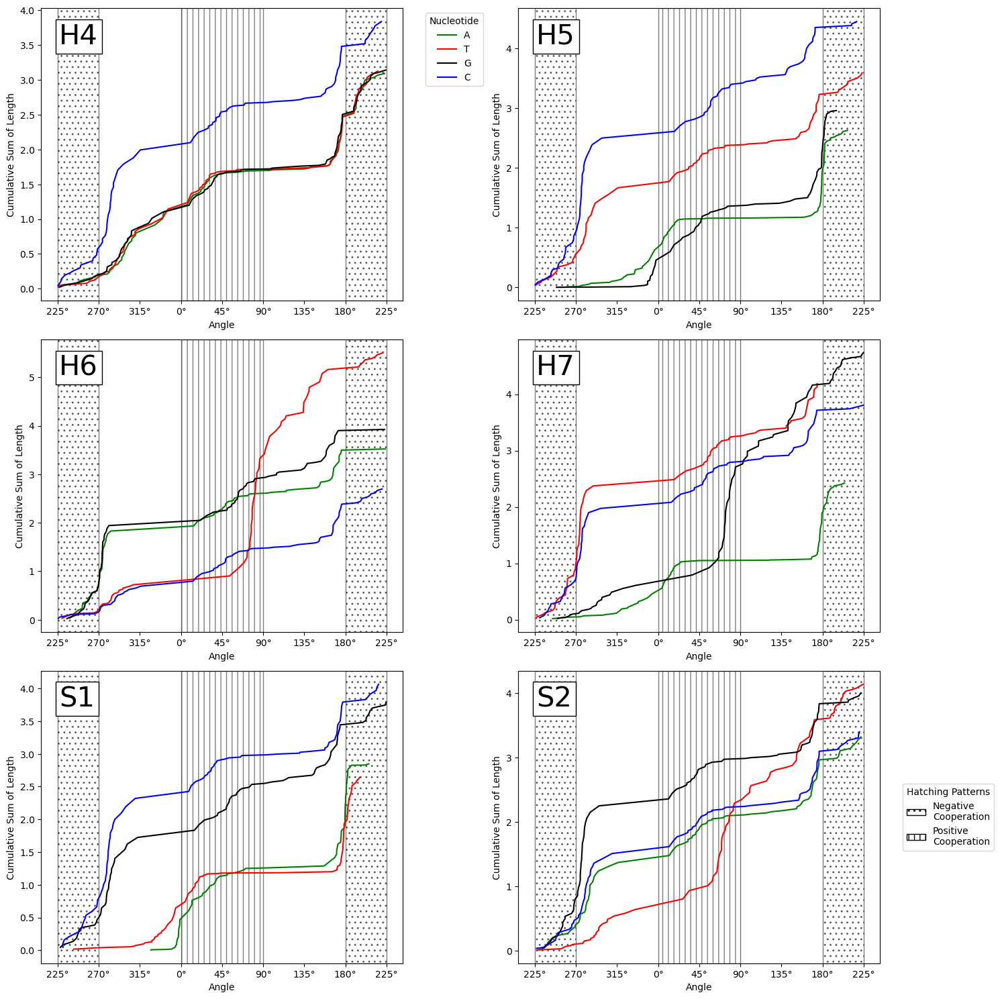

In [41]:
# Define colors for each nucleotide
nucleotide_colors = {
    'A': 'green',
    'T': 'red',
    'G': 'black',
    'C': 'blue'
}

# Filter out rows with valid vectors
valid_vectors_df = vector_df.dropna(subset=['Vector'])

# Filter out rows where the two variables in the position are the same
valid_vectors_df = valid_vectors_df[valid_vectors_df['Position'].apply(lambda x: x[0] != x[1])]

# Extract the first feature in the position
valid_vectors_df['Feature1'] = valid_vectors_df['Position'].apply(lambda x: x[0])

# Create a color mapping for the nucleotide of the first feature
valid_vectors_df['Color'] = valid_vectors_df['Feature1'].apply(lambda x: nucleotide_colors.get(x[-1], 'gray'))  # Get the last character

# Define tick locations using np.linspace
tick_vals = np.linspace(-135, 225, 9)  # 7 ticks for -135 to 225 with 45° interval
tick_labels = [(f"{val:.0f}°" if val >= 0 else f"{val+360:.0f}°") for val in tick_vals]

# Create a 3x2 grid of subplots
fig, axs = plt.subplots(3, 2, figsize=(15, 15))
axs = axs.flatten()

# Create custom legend handles for the hatching patterns
hatch_handles = [
    mpatches.Patch(facecolor='none', edgecolor='black', hatch='..', label='Negative\nCooperation'),
    mpatches.Patch(facecolor='none', edgecolor='black', hatch='||', label='Positive\nCooperation')
]

# Iterate over the position labels
for i, position_to_mask in enumerate(position_labels):
    # Filter rows based on the position to mask
    mask_condition = valid_vectors_df['Position'].apply(lambda x: x[0].startswith(position_to_mask))
    masked_df = valid_vectors_df[mask_condition].copy()  # Create a copy to avoid warnings

    # Unwrap angles around 225 (modify offset as needed)
    masked_df['Unwrapped Angle'] = np.where(masked_df['Vector Angle'] > 225, masked_df['Vector Angle'] - 360, masked_df['Vector Angle'])

    # Set titles and labels
    #axs[i].set_title(f'Cumulative sum of vector length and Angle (for {position_to_mask})')
    axs[i].set_xlabel('Angle')
    axs[i].set_ylabel('Cumulative Sum of Length')
    axs[i].set_xticks(tick_vals)
    axs[i].set_xticklabels(tick_labels, rotation=0)
    
    # Fill the background with hatching
    axs[i].axvspan(180, 225, facecolor='none', hatch='..', edgecolor='black', alpha=0.5, zorder=-1, transform=axs[i].get_yaxis_transform())
    axs[i].axvspan(-135, -90, facecolor='none', hatch='..', edgecolor='black', alpha=0.5, zorder=-1, transform=axs[i].get_yaxis_transform())
    axs[i].axvspan(0, 90, facecolor='none', hatch='||', edgecolor='black', alpha=0.5, zorder=-1, transform=axs[i].get_yaxis_transform())
    
    # Plot cumulative distributions for each nucleotide group based on unwrapped angles and sum of lengths
    for nucleotide, color in nucleotide_colors.items():
        nucleotide_data = masked_df[masked_df['Feature1'].str.endswith(nucleotide)]

        # Sort the unwrapped angles and corresponding lengths together
        sorted_indices = np.argsort(nucleotide_data['Unwrapped Angle'])
        sorted_unwrapped_angles = nucleotide_data['Unwrapped Angle'].iloc[sorted_indices]
        sorted_lengths = nucleotide_data['Length'].iloc[sorted_indices]

        # Compute the cumulative sum of the lengths
        cumulative_sum_lengths = np.cumsum(sorted_lengths)

        axs[i].plot(sorted_unwrapped_angles, cumulative_sum_lengths, label=f"{nucleotide}", color=color)

    # Add nucleotide legend
    if i == 0:
        axs[i].legend(title='Nucleotide', bbox_to_anchor=(1.05, 1), loc='upper left')
        
    # Add position label
    axs[i].text(0.05, 0.95, position_to_mask, transform=axs[i].transAxes, fontsize=30,
                verticalalignment='top', bbox=dict(facecolor='white', alpha=1))

# Add custom hatch legend
plt.legend(handles=hatch_handles, title='Hatching Patterns', bbox_to_anchor=(1.05, 0.5), loc='center left')

# Adjust layout
plt.tight_layout()
plt.show()


# ██████████████████████████████████████
# Train the H4S2-cNon Model
## Adding N1-N3 and N8-N9 DNA sequence to model's input encoding
# ██████████████████████████████████████

## • Create H4S2-cNon DNA Sequence Encodings

In [42]:
for dataset_name, dataset_df in result_dataframes.items():
    dataset_df['H4S2_N1N3_N8N9'] = dataset_df['H4S2'] + dataset_df['N1N3'] + dataset_df['N8N9']
    result_dataframes[dataset_name] = dataset_df  # Update the dictionary with the new column

# Checking the first few rows of each DataFrame to ensure the new column is added
for dataset_name, dataset_df in result_dataframes.items():
    print(f"\nDataset: {dataset_name}\n")
    print(dataset_df.head(2))
    print(dataset_df.shape)


Dataset: iseq1

   Read count                      Sequence    H4S2 N1N3 N8N9  \
0         2.0  CACAAAAAAACAGACTGGAACAAAAACC  AAAAAA  ACA   CC   
1        12.0  CACAAAAATACAGACTGGAACAAAAACC  AAAAAT  ACA   CC   

                                         one_hot_seq  H4S2_Prediction  \
0  [[1.0, 0.0, 0.0, 0.0], [1.0, 0.0, 0.0, 0.0], [...         0.002614   
1  [[1.0, 0.0, 0.0, 0.0], [1.0, 0.0, 0.0, 0.0], [...         0.010746   

   Normalized_Readcount H4S2_N1N3_N8N9  
0              0.000105    AAAAAAACACC  
1              0.000632    AAAAATACACC  
(4096, 9)

Dataset: iseq2

   Read count                      Sequence    H4S2 N1N3 N8N9  \
0         0.0  CACAAAAAAACAGACTGGAACAAAAACC  AAAAAA  ACA   CC   
1         0.0  CACAAAAATACAGACTGGAACAAAAACC  AAAAAT  ACA   CC   

                                         one_hot_seq  H4S2_Prediction  \
0  [[1.0, 0.0, 0.0, 0.0], [1.0, 0.0, 0.0, 0.0], [...         0.002614   
1  [[1.0, 0.0, 0.0, 0.0], [1.0, 0.0, 0.0, 0.0], [...         0.010746   

 

## • Combining Cryptic Nonamer Datasets

In [43]:
# Merge pax3_lmo2_crypticnonamer and cf1_crypticnonamer into whole_crypticnonamer
whole_crypticnonamer_df = pd.concat([
    result_dataframes['lmo2_crypticnonamer'],
    result_dataframes['pax3_crypticnonamer'],
    result_dataframes['cf1_crypticnonamer']
], ignore_index=True)

# Add the merged dataset to the result_dataframes dictionary
result_dataframes["whole_crypticnonamer"] = whole_crypticnonamer_df

In [44]:
print(result_dataframes["whole_crypticnonamer"])

      Read count                      Sequence    H4S2 N1N3 N8N9  \
0       0.000000  CACAAAAAGACAGACTGGATGGAAAATA  AAAAAG  TGG   TA   
1       0.000000  CACAAAAATACAGACTGGATGGAAAATA  AAAAAT  TGG   TA   
2       0.000000  CACAAATAGACAGACTGGATGGAAAATA  AAATAG  TGG   TA   
3       0.000000  CACAAATATACAGACTGGATGGAAAATA  AAATAT  TGG   TA   
4       2.000000  CACAAAGAGACAGACTGGATGGAAAATA  AAAGAG  TGG   TA   
...          ...                           ...     ...  ...  ...   
1531    2.000000  CACCCCTATACAGACTGGAACAAAAACC  CCCTAT  ACA   CC   
1532  465.000000  CACCCCGAGACAGACTGGAACAAAAACC  CCCGAG  ACA   CC   
1533  968.666667  CACCCCGATACAGACTGGAACAAAAACC  CCCGAT  ACA   CC   
1534   13.000000  CACCCCCAGACAGACTGGAACAAAAACC  CCCCAG  ACA   CC   
1535  204.666667  CACCCCCATACAGACTGGAACAAAAACC  CCCCAT  ACA   CC   

                                            one_hot_seq  H4S2_Prediction  \
0     [[1.0, 0.0, 0.0, 0.0], [1.0, 0.0, 0.0, 0.0], [...         0.001395   
1     [[1.0, 0.0, 0.0, 0.0], [1

## • Training H4S2_cNon

Bin
0    325
1    531
2    100
3    126
4    143
5    113
6     81
7     73
8     44
dtype: int64


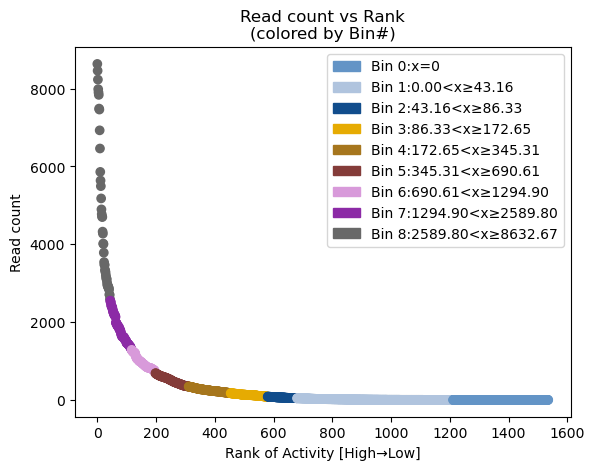

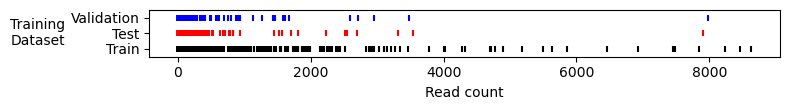

Fold: Fold 0
5/5 [==============================] - 0s 2ms/step - loss: 0.0010 - r_square: 0.9002
Fold loss metric value: [0.0010103265522047877, 0.9001573324203491] Mean Square Error
Fold training performance: 0.9329649693574005 FVAF
Fold validation performance: 0.9269831054242218 FVAF
Fold test performance: 0.9001573099858963 FVAF
Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 hidden_1 (Dense)            (None, 300)               13500     
                                                                 
 dropout_21 (Dropout)        (None, 300)               0         
                                                                 
 hidden_2 (Dense)            (None, 150)               45150     
                                                                 
 dense_21 (Dense)            (None, 1)                 151       
                                                

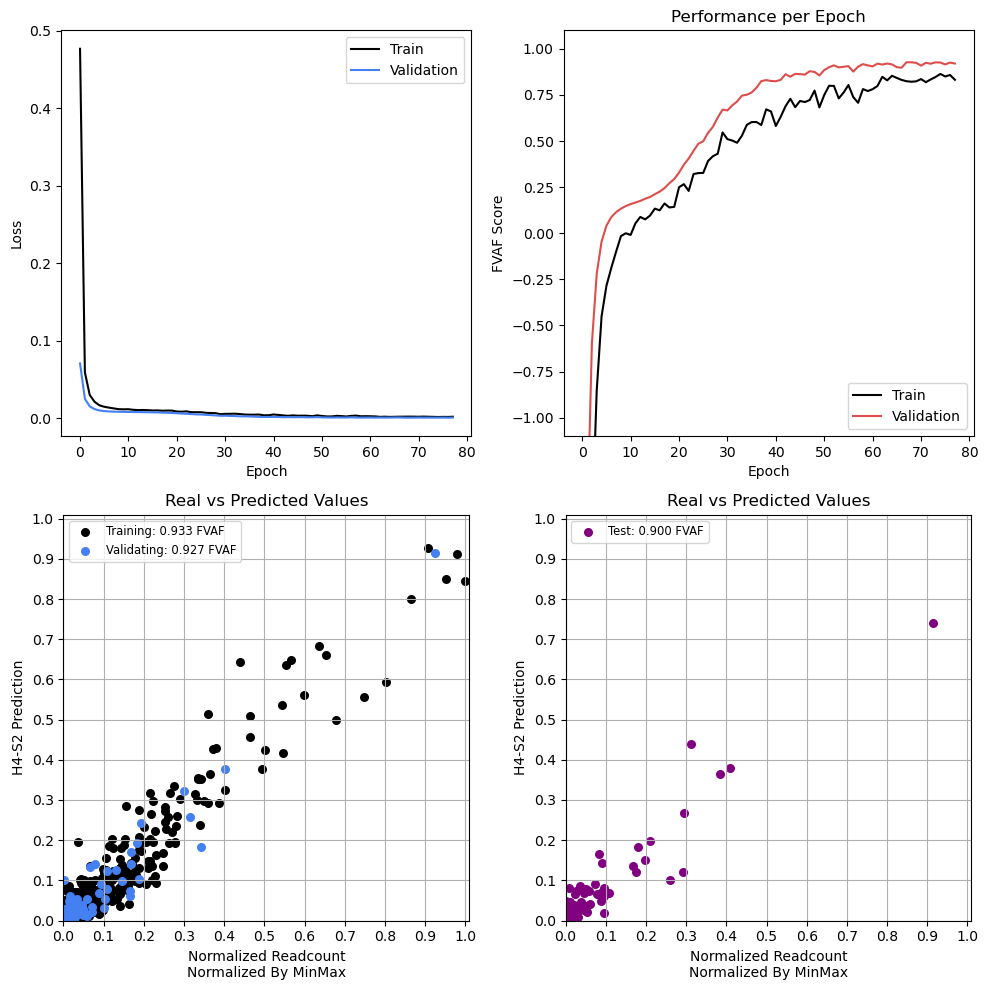

   Validation_MSE  Training_FVAF  Validation_FVAF  Test_FVAF  \
0         0.00101       0.932965         0.926983   0.900157   

   Training_Spearman  Validation_Spearman  Test_Spearman  Training_RMSE  \
0           0.869388             0.864253       0.879902       0.027757   

   Validation_RMSE  Test_RMSE  
0         0.026466   0.031786  


In [45]:
cnon_bin, cnon_bin_ranges = asymmetric_binning(result_dataframes['whole_crypticnonamer'], bin_zeros_seperately=True, plt_log_transform=False)

# Perform a stratified train-validation-test split based on the 'Bin' column
train_val_test_split = train_test_split(cnon_bin, stratify=cnon_bin['Bin'], test_size=0.2, random_state=42)
train_df, test_validation_df = train_val_test_split
validation_df, test_df = train_test_split(test_validation_df, stratify=test_validation_df['Bin'], test_size=0.5, random_state=42)

# Assign 'Fold 0' column labels for train, validation, and test sets
train_df['Fold 0'] = 'Train'
validation_df['Fold 0'] = 'Validation'
test_df['Fold 0'] = 'Test'

# Concatenate the DataFrames into one
cnon_folds = pd.concat([train_df, validation_df, test_df], ignore_index=True)

# Variables used to plot train test validation indies for each rotation
"""
Plots the train, test, and validation indices for each Rotation of combined folds in a stratified K-fold cross-validation.

Args:
    working_df (pandas.DataFrame): Input DataFrame containing the fold labels and read counts.
    n_splits (int): Number of rotations in the cross-validation.
    read_count_column_name (str): Name of the column in the text file that contains the read count. Defaults to 'Read count'.
    plt_log_transform (bool):
        -False (default): Plots read count as in working_df
        -True: Plots a log 10 transform of read counts.

Returns:
    None
"""
    
working_df = cnon_folds
n_splits = 2
read_count_column_name = 'Read count'
plt_log_transform = False


# Create a list of fold columns based on the working DataFrame
fold_cols = [f'Fold {i}' for i in range(working_df.filter(like='Fold').shape[1])]

# Create subplots for each rotation
fig, axes = plt.subplots(nrows=len(fold_cols), figsize=(8, 0.6*n_splits), sharex=True)
fig.subplots_adjust(hspace=0.2, left=0.15)

# Ensure axes is always treated as an array
if len(fold_cols) == 1:
    axes = [axes]

# Iterate over each fold column and plot the train, test, and validation indices
for i, fold_col in enumerate(fold_cols):
    # Retrieve the train, test, and validation indices based on the fold column and plot type
    if plt_log_transform:
        train_indices = np.log10(working_df.loc[working_df[fold_col] == 'Train', read_count_column_name] + 1)
        test_indices = np.log10(working_df.loc[working_df[fold_col] == 'Test', read_count_column_name] + 1)
        val_indices = np.log10(working_df.loc[working_df[fold_col] == 'Validation', read_count_column_name] + 1)
    else:
        train_indices = working_df.loc[working_df[fold_col] == 'Train', read_count_column_name]
        test_indices = working_df.loc[working_df[fold_col] == 'Test', read_count_column_name]
        val_indices = working_df.loc[working_df[fold_col] == 'Validation', read_count_column_name]

    # Plot the train, test, and validation indices using scatter plots
    axes[i].scatter(train_indices, [0] * len(train_indices), label='Train', marker="|", color='black', s=20)
    axes[i].scatter(test_indices, [1] * len(test_indices), label='Test', marker="|", color='red', s=20)
    axes[i].scatter(val_indices, [2] * len(val_indices), label='Validation', marker="|", color='blue', s=20)

    # Set the y-axis limits and labels
    axes[i].set_ylim([-0.5, 2.5])
    axes[i].set_yticks([0, 1, 2])
    axes[i].set_yticklabels(['Train', 'Test', 'Validation'])
    axes[i].set_ylabel(f'Training\nDataset', rotation=0, ha='right', va='center')
        
# Set the x-axis label based on the plot type
axes[-1].set_xlabel('Log(Read count + 1)' if plt_log_transform else read_count_column_name)

# Adjust the layout and display the plot
plt.tight_layout()
plt.show()

cnon_sequences, cnon_sequence_labels = encode_sequences_to_numpy_array(cnon_folds,sequence_column_name='H4S2_N1N3_N8N9')


cnon_read_count = normalize_read_count_to_numpy_array(cnon_folds)

def build_model_cnon(input_variables):
    """
    Construct Sequential NN model; called by the model_training_crossfold_validation function.
    
    Args:
        input_variables (np.ndarray): The sequence variables used to define layer shapes.
    
    Returns:
        tf.keras.Sequential: The constructed neural network model.
    
    """
    
    # Dropout variable
    dropout_rate = 0.65
    
    # Define the neural network architecture
    working_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_variables[0].shape),
        tf.keras.layers.Dense(300, use_bias=True, name="hidden_1", activation='relu'),
        tf.keras.layers.Dropout(dropout_rate),
        tf.keras.layers.Dense(150, use_bias=True, name="hidden_2", activation='relu'),
        tf.keras.layers.Dense(1, activation='exponential')
    ])

    # Define the optimizer with a learning rate
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002)
    
    # Compile the working_model with the mean squared error loss function and the optimizer
    working_model.compile(loss='mean_squared_error', optimizer=optimizer, metrics=[tfa.metrics.r_square.RSquare()])
    
    return working_model

# Perform training for one model with training validation and test datasplit.
"""
Perform training for one model with training validation and test datasplit.

Plots loss over epochs, model prediction performance for Train and validation, tfa r2_score (FVAF) over epochs,
and (optional) Test set performance

Args:
    model_building_function (function): A function that builds the model architecture.
    working_df (pd.DataFrame): The working dataframe containing the fold assignments.
    sequence_variables (np.ndarray): The sequence variables.
    read_count_labels (np.ndarray): The read count labels.
    plt_test_set (bool):
        -False (default): Model does not predict or plots Test set
        -True: Model does predict and plots Test set

Returns:
    pd.DataFrame: A DataFrame with columns for loss metric values, training performance values, and validation performance values.        
    working_model: A trained tf.keras.Sequential model
"""
# Variables used to train one model
model_building_function = build_model_cnon
working_df = cnon_folds
sequence_variables = cnon_sequences
read_count_labels = cnon_read_count
plt_test_set = True

# Suppress TensorFlow info messages to prevent repeated model summary printing
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

X = sequence_variables
y = read_count_labels

# Initialize empty list to cache fold's performance metric
metric_values = []
loss_metric_values = []
training_performance_values = []
validation_performance_values = []
spearman_train_values = []
spearman_val_values = []
spearman_test_values = []
rmse_train_values = []
rmse_val_values = []
rmse_test_values = []

# Pull n_Fold columns to list
data_split_column = [col for col in working_df.columns if col.startswith('Fold')]

if plt_test_set == True:
    num_cols = 4  # Number of columns in the grid (loss plot and validation plot)
else:
    num_cols = 3  # Number of columns in the grid (loss plot and validation plot)

fig, axs = plt.subplots(2, 2, figsize=(10, 10))

for col in (data_split_column):
    train_indices = working_df.index[working_df[col] == 'Train'].tolist()  # Indices for train label
    test_indices = working_df.index[working_df[col] == 'Test'].tolist()  # Indices for test label
    validation_indices = working_df.index[working_df[col] == 'Validation'].tolist()  # Indices for validation label

    # Print the fold label
    print(f"Fold: {col}")

    # Connect train_indices to X_train and y_train
    X_train = X[train_indices]
    y_train = y[train_indices]

    # Connect validation_indices to X_val and y_val
    X_val = X[validation_indices]
    y_val = y[validation_indices]

    # Early stopping
    early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    # Build model architecture using the provided function
    working_model = model_building_function(sequence_variables)

    # Train the model on the current training set
    working_history = working_model.fit(X_train, y_train, epochs=100, verbose=0, validation_data=(X_val, y_val), callbacks=[early_stop])

    # Predict the values for the training and validation sets
    y_pred_train = working_model.predict(X_train).flatten()
    y_pred_val = working_model.predict(X_val).flatten()

    # Compute the accuracy, loss, or any other metric of interest
    loss_metric_value = working_model.evaluate(X_val, y_val)
    training_performance_value = FVAF(y_train, y_pred_train)
    validation_performance_value = FVAF(y_val, y_pred_val)
    spearman_train, _ = spearmanr(y_train, y_pred_train) #training spearman
    spearman_val, _ = spearmanr(y_val, y_pred_val) #validation spearman
    rmse_train = np.sqrt(mean_squared_error(y_train, y_pred_train)) #training RMSE
    rmse_val = np.sqrt(mean_squared_error(y_val, y_pred_val)) #validation RMSE

    # Get the R2 scores from the history object
    r2_scores_train = working_history.history['r_square']
    r2_scores_val = working_history.history['val_r_square']

    # Plot the loss curve in the left subplot
    axs[0,0].plot(working_history.history['loss'], color = 'black')
    axs[0,0].plot(working_history.history['val_loss'], color = (0.2667, 0.5020, 0.9490))
    axs[0,0].set_xlabel('Epoch')
    axs[0,0].set_ylabel('Loss')
    #axs[0,0].set_title('{}'.format(n_fold))
    axs[0,0].legend(['Train', 'Validation'], loc='upper right')

    # Plot the scatter plot of real vs predicted values in the right subplot
    axs[1,0].scatter(y_train, y_pred_train, s=30, color = 'black', label='Training: {:.3f}'.format(training_performance_value)+' FVAF')
    axs[1,0].scatter(y_val, y_pred_val, s=30, color = (0.2667, 0.5020, 0.9490), label='Validating: {:.3f}'.format(validation_performance_value)+' FVAF')
    axs[1,0].set_title('Real vs Predicted Values')
    axs[1,0].set_xlabel('Normalized Readcount\nNormalized By MinMax')
    axs[1,0].set_ylabel('H4-S2 Prediction')
    axs[1,0].set_xlim([0, 1.01])
    axs[1,0].set_ylim([0, 1.01])
    axs[1,0].set_aspect('equal')
    axs[1,0].legend(loc='upper left', fontsize='small')
    # Set ticks every 0.1 on both x and y axes
    axs[1,0].set_xticks(np.arange(0, 1.1, 0.1))
    axs[1,0].set_yticks(np.arange(0, 1.1, 0.1))
    # Enable gridlines
    axs[1,0].grid(True)

    # Plot the R2 curve in the 3rd subplot
    axs[0,1].plot(r2_scores_train, color='black')
    axs[0,1].plot(r2_scores_val, color=(0.8667, 0.3020, 0.2941))
    axs[0,1].set_title('Performance per Epoch')
    axs[0,1].set_ylim([-1.1,1.1])
    axs[0,1].set_xlabel('Epoch')
    axs[0,1].set_ylabel('FVAF Score')
    axs[0,1].legend(['Train', 'Validation'], loc='lower right')


    if plt_test_set == True:        
        # Connect test_indices to X_test and y_test
        X_test = X[test_indices]
        y_test = y[test_indices]

        # Predict the values for the training and validation sets
        y_pred_test = working_model.predict(X_test).flatten()

        # Compute the accuracy, loss, or any other metric of interest
        loss_metric_value = working_model.evaluate(X_test, y_test) #test MSE
        test_performance_value = FVAF(y_test, y_pred_test) #test FVAF
        spearman_test_value, _ = spearmanr(y_test, y_pred_test) #test spearman
        rmse_test_value = np.sqrt(mean_squared_error(y_test, y_pred_test)) #test RMSE

        axs[1,1].plot()
        # Plot the scatter plot of real vs predicted values in the right subplot
        axs[1,1].scatter(y_test, y_pred_test, s=30, color = 'purple', label='Test: {:.3f}'.format(test_performance_value)+' FVAF')
        axs[1,1].set_title('Real vs Predicted Values')
        axs[1,1].set_xlabel('Normalized Readcount\nNormalized By MinMax')
        axs[1,1].set_ylabel('H4-S2 Prediction')
        axs[1,1].set_xlim([0, 1.01])
        axs[1,1].set_ylim([0, 1.01])
        axs[1,1].set_aspect('equal')
        axs[1,1].legend(loc='upper left', fontsize='small')

        # Set ticks every 0.1 on both x and y axes
        axs[1, 1].set_xticks(np.arange(0, 1.1, 0.1))
        axs[1, 1].set_yticks(np.arange(0, 1.1, 0.1))

        # Enable gridlines
        axs[1, 1].grid(True)

    # Append the metric value and indices to the cache lists
    loss_metric_values.append(loss_metric_value[0])
    training_performance_values.append(training_performance_value)
    validation_performance_values.append(validation_performance_value)
    spearman_train_values.append(spearman_train)
    spearman_val_values.append(spearman_val)
    rmse_train_values.append(rmse_train)
    rmse_val_values.append(rmse_val)

    # Print the metric value for this fold
    print('Fold loss metric value: {}'.format(loss_metric_value)+' Mean Square Error')
    print('Fold training performance: {}'.format(training_performance_value)+' FVAF')
    print('Fold validation performance: {}'.format(validation_performance_value)+' FVAF')
    if plt_test_set == True:
        print('Fold test performance: {}'.format(test_performance_value)+' FVAF')

print(working_model.summary())

plt.tight_layout()
plt.show()

if plt_test_set == True:
            metric_df = pd.DataFrame(
        {
            'Validation_MSE': loss_metric_values,
            'Training_FVAF': training_performance_values,
            'Validation_FVAF': validation_performance_values,
            'Test_FVAF': test_performance_value,
            'Training_Spearman': spearman_train_values,
            'Validation_Spearman': spearman_val_values,
            'Test_Spearman': spearman_test_value,
            'Training_RMSE': rmse_train_values,
            'Validation_RMSE': rmse_val_values,
            'Test_RMSE': rmse_test_value

        })
else:
    metric_df = pd.DataFrame(
        {
            'Validation_MSE': loss_metric_values,
            'Training_FVAF': training_performance_values,
            'Validation_FVAF': validation_performance_values,
            'Training_Spearman': spearman_train_values,
            'Validation_Spearman': spearman_val_values,
            'Training_RMSE': rmse_train_values,
            'Validation_RMSE': rmse_val_values
        })
    
print(metric_df)
H4S2_cNon_model= working_model

In [46]:
# Iterate through your datasets and make predictions
for dataset_name, dataset_df in result_dataframes.items():
    encoded_sequences, labels = encode_sequences_to_numpy_array(dataset_df,sequence_column_name='H4S2_N1N3_N8N9')
    

    # Make predictions using the neural network model
    predictions = make_predictions(H4S2_cNon_model, encoded_sequences)

    # Assuming 'Predictions' is the column where you want to store the model predictions
    dataset_df['H4S2_cNon_Prediction'] = predictions

    # Display the modified DataFrame
    print(f"Dataset: {dataset_name}\n")
    print(dataset_df)

128/128 [==============================] - 0s 874us/step
Dataset: iseq1

      Read count                      Sequence    H4S2 N1N3 N8N9  \
0            2.0  CACAAAAAAACAGACTGGAACAAAAACC  AAAAAA  ACA   CC   
1           12.0  CACAAAAATACAGACTGGAACAAAAACC  AAAAAT  ACA   CC   
2           53.0  CACAAAAAGACAGACTGGAACAAAAACC  AAAAAG  ACA   CC   
3            2.0  CACAAAAACACAGACTGGAACAAAAACC  AAAAAC  ACA   CC   
4            3.0  CACAAAATAACAGACTGGAACAAAAACC  AAAATA  ACA   CC   
...          ...                           ...     ...  ...  ...   
4091         0.0  CACCCCCGCACAGACTGGAACAAAAACC  CCCCGC  ACA   CC   
4092         1.0  CACCCCCCAACAGACTGGAACAAAAACC  CCCCCA  ACA   CC   
4093         0.0  CACCCCCCTACAGACTGGAACAAAAACC  CCCCCT  ACA   CC   
4094         0.0  CACCCCCCGACAGACTGGAACAAAAACC  CCCCCG  ACA   CC   
4095         0.0  CACCCCCCCACAGACTGGAACAAAAACC  CCCCCC  ACA   CC   

                                            one_hot_seq  H4S2_Prediction  \
0     [[1.0, 0.0, 0.0, 0.0], [1.0,

16/16 [==============================] - 0s 932us/step
Dataset: pax3_crypticnonamer

     Read count                      Sequence    H4S2 N1N3 N8N9  \
0          38.0  CACAAAAAGACAGACTGGACTAAAAACC  AAAAAG  CTA   CC   
1          26.0  CACAAAAATACAGACTGGACTAAAAACC  AAAAAT  CTA   CC   
2           0.0  CACAAATAGACAGACTGGACTAAAAACC  AAATAG  CTA   CC   
3           6.0  CACAAATATACAGACTGGACTAAAAACC  AAATAT  CTA   CC   
4          27.0  CACAAAGAGACAGACTGGACTAAAAACC  AAAGAG  CTA   CC   
..          ...                           ...     ...  ...  ...   
507         0.0  CACCCCTATACAGACTGGACTAAAAACC  CCCTAT  CTA   CC   
508        64.0  CACCCCGAGACAGACTGGACTAAAAACC  CCCGAG  CTA   CC   
509       147.0  CACCCCGATACAGACTGGACTAAAAACC  CCCGAT  CTA   CC   
510        27.0  CACCCCCAGACAGACTGGACTAAAAACC  CCCCAG  CTA   CC   
511       122.0  CACCCCCATACAGACTGGACTAAAAACC  CCCCAT  CTA   CC   

                                           one_hot_seq  H4S2_Prediction  \
0    [[1.0, 0.0, 0.0, 0.0], [1.0, 0

# ██████████████████████████████
# H4-S2-cNon Model's Prediction Performance
# ██████████████████████████████

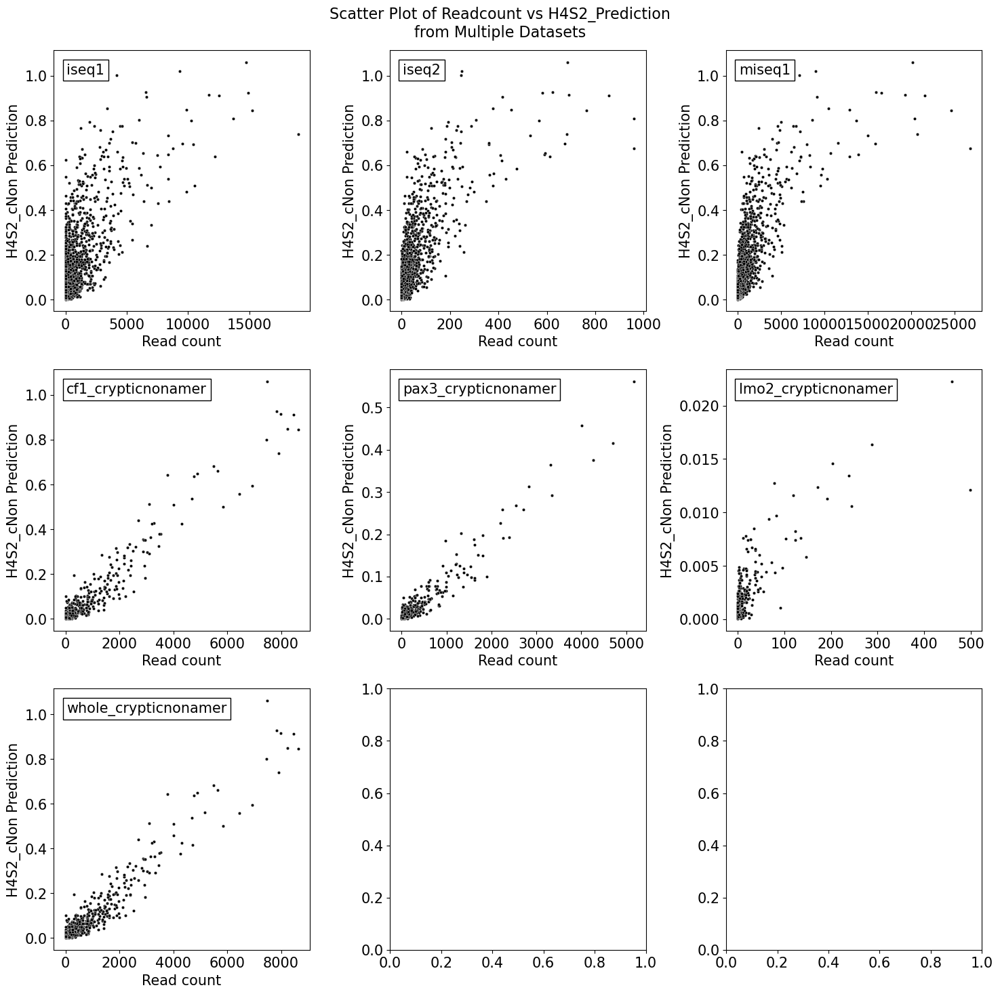

In [47]:
# change the font size if needed
plt.rcParams.update({'font.size': 15})

# Assuming 'result_dataframes' is a dictionary containing your dataframes
datasets_count = len(result_dataframes)
grid_size = math.ceil(math.sqrt(datasets_count))

fig, axes = plt.subplots(grid_size, grid_size, figsize=(15, 15))

# Flatten the 2D array of subplots to simplify indexing
axes = axes.flatten()

for i, (dataset_name, dataset_df) in enumerate(result_dataframes.items()):
    # Create a scatter plot on the i-th subplot
    sns.scatterplot(x='Read count', y='H4S2_cNon_Prediction', data=dataset_df, ax=axes[i], s=10, color = 'black')  # Adjust point size with 's' parameter

    # Add labels and title
    axes[i].set_xlabel('Read count')
    axes[i].set_ylabel('H4S2_cNon Prediction')
    #axes[i].set_title(f'{dataset_name}')
    
    # Add dataset name label in the upper left corner
    axes[i].text(0.05, 0.95, dataset_name, transform=axes[i].transAxes, fontsize=15,
                 verticalalignment='top', bbox=dict(facecolor='white', alpha=1))

# Add a title over the entire figure
fig.suptitle('Scatter Plot of Readcount vs H4S2_Prediction\nfrom Multiple Datasets', fontsize=16)

# Adjust layout to prevent overlapping
plt.tight_layout()

# Show the plot
plt.show()

# Reset the font size if needed
plt.rcParams.update({'font.size': 10})

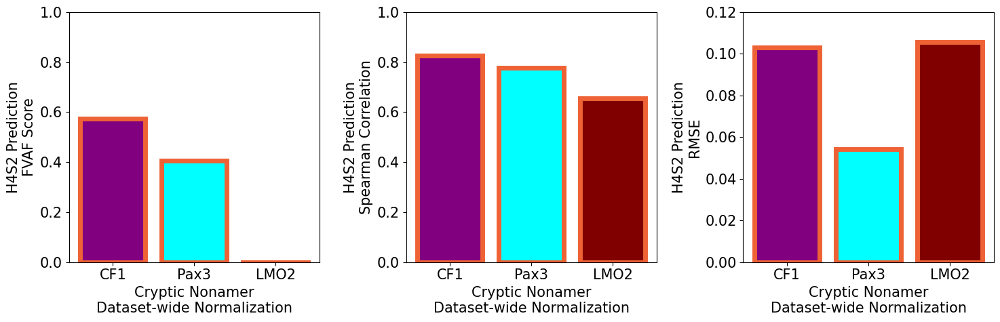

In [48]:
# Define function to calculate FVAF score
def calculate_fvaf(actual, predicted):
    # Calculate Mean Squared Error (MSE)
    mse = mean_squared_error(actual, predicted)

    # Calculate variance of actual read counts
    var_actual = np.var(actual)

    # Calculate FVAF score
    fvaf_score = 1 - (mse / var_actual)

    return fvaf_score

# Reset the font size if needed
plt.rcParams.update({'font.size': 15})

# Define the names of datasets to compare
datasets_to_compare = ['cf1_crypticnonamer', 'pax3_crypticnonamer', 'lmo2_crypticnonamer']
cnon_colormap = {'cf1_crypticnonamer': 'purple', 'pax3_crypticnonamer': 'cyan', 'lmo2_crypticnonamer': 'maroon'}

# Combine all datasets to find the global min and max read counts
all_read_counts = pd.concat([result_dataframes[dataset]['Read count'] for dataset in datasets_to_compare])
global_min_readcount = all_read_counts.min()
global_max_readcount = all_read_counts.max()

# Initialize empty lists to store metrics for each dataset
fvaf_scores = []
spearman_corrs = []
rmses = []

# Iterate through selected datasets and calculate metrics
for dataset_name in datasets_to_compare:
    dataset_df = result_dataframes[dataset_name]

    # Normalize the Read count column using global min and max
    dataset_df['Datasetwide_Normalization'] = (dataset_df['Read count'] - global_min_readcount) / (global_max_readcount - global_min_readcount)

    actual_readcounts = dataset_df['Datasetwide_Normalization']
    predicted_readcounts = dataset_df['H4S2_Prediction']

    # Calculate FVAF score
    fvaf_score = calculate_fvaf(actual_readcounts, predicted_readcounts)
    fvaf_scores.append(fvaf_score)

    # Calculate Spearman correlation
    spearman_corr = calculate_spearman_correlation(actual_readcounts, predicted_readcounts)
    spearman_corrs.append(spearman_corr)

    # Calculate RMSE
    rmse = calculate_rmse(actual_readcounts, predicted_readcounts)
    rmses.append(rmse)

# Create a list of colors based on the colormap for plotting
colors = [cnon_colormap[dataset] for dataset in datasets_to_compare]

# Define shorter names for the x-axis labels
short_names = ['CF1', 'Pax3', 'LMO2']

# Plotting code with subplots
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Plot FVAF scores
axs[0].bar(short_names, fvaf_scores, color=colors, edgecolor='#EE6235', linewidth=5)
axs[0].set_ylim(0, 1)
axs[0].set_xlabel('Cryptic Nonamer\nDataset-wide Normalization')
axs[0].set_ylabel('H4S2 Prediction\nFVAF Score')
#axs[0].set_title('H4S2 Model\nPerformance FVAF Score')

# Plot Spearman correlations
axs[1].bar(short_names, spearman_corrs, color=colors, edgecolor='#EE6235', linewidth=5)
axs[1].set_ylim(0, 1)
axs[1].set_xlabel('Cryptic Nonamer\nDataset-wide Normalization')
axs[1].set_ylabel('H4S2 Prediction\nSpearman Correlation')
#axs[1].set_title('H4S2 Model\nSpearman Correlation')

# Plot RMSEs
axs[2].bar(short_names, rmses, color=colors, edgecolor='#EE6235', linewidth=5)
axs[2].set_ylim(0, 0.12)
axs[2].set_xlabel('Cryptic Nonamer\nDataset-wide Normalization')
axs[2].set_ylabel('H4S2 Prediction\nRMSE')
#axs[2].set_title('H4S2 Model\nError RMSE')

#plt.suptitle('Cryptic Nonamer Dataset-wide Normalization')
plt.tight_layout()
plt.show()

# Reset the font size if needed
plt.rcParams.update({'font.size': 10})


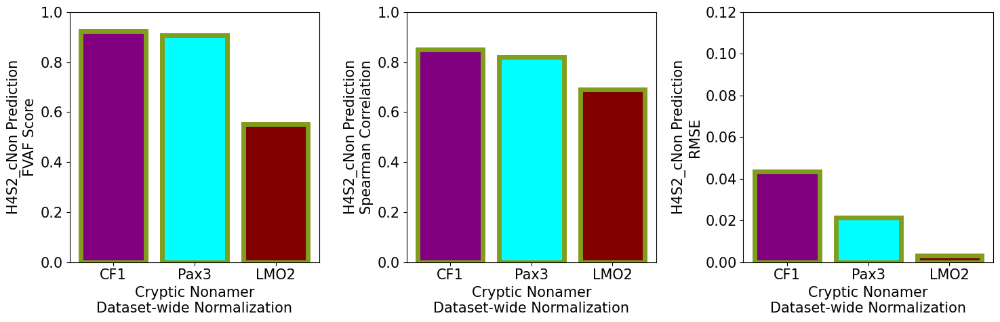

In [49]:
# Reset the font size if needed
plt.rcParams.update({'font.size': 15})

# Define the names of datasets to compare
datasets_to_compare = ['cf1_crypticnonamer', 'pax3_crypticnonamer', 'lmo2_crypticnonamer']
cnon_colormap = {'cf1_crypticnonamer': 'purple', 'pax3_crypticnonamer': 'cyan', 'lmo2_crypticnonamer': 'maroon'}

# Combine all datasets to find the global min and max read counts
all_read_counts = pd.concat([result_dataframes[dataset]['Read count'] for dataset in datasets_to_compare])
global_min_readcount = all_read_counts.min()
global_max_readcount = all_read_counts.max()

# Initialize empty lists to store metrics for each dataset
fvaf_scores = []
spearman_corrs = []
rmses = []

# Iterate through selected datasets and calculate metrics
for dataset_name in datasets_to_compare:
    dataset_df = result_dataframes[dataset_name]

    # Normalize the Read count column using global min and max
    dataset_df['Datasetwide_Normalization'] = (dataset_df['Read count'] - global_min_readcount) / (global_max_readcount - global_min_readcount)

    actual_readcounts = dataset_df['Datasetwide_Normalization']
    predicted_readcounts = dataset_df['H4S2_cNon_Prediction']

    # Calculate FVAF score
    fvaf_score = calculate_fvaf(actual_readcounts, predicted_readcounts)
    fvaf_scores.append(fvaf_score)

    # Calculate Spearman correlation
    spearman_corr = calculate_spearman_correlation(actual_readcounts, predicted_readcounts)
    spearman_corrs.append(spearman_corr)

    # Calculate RMSE
    rmse = calculate_rmse(actual_readcounts, predicted_readcounts)
    rmses.append(rmse)

# Create a list of colors based on the colormap for plotting
colors = [cnon_colormap[dataset] for dataset in datasets_to_compare]

# Define shorter names for the x-axis labels
short_names = ['CF1', 'Pax3', 'LMO2']

# Plotting code with subplots
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Plot FVAF scores
axs[0].bar(short_names, fvaf_scores, color=colors, edgecolor='#819D1C', linewidth=5)
axs[0].set_ylim(0, 1)
axs[0].set_xlabel('Cryptic Nonamer\nDataset-wide Normalization')
axs[0].set_ylabel('H4S2_cNon Prediction\nFVAF Score')
#axs[0].set_title('H4S2_cNon Model\nPerformance FVAF Score')

# Plot Spearman correlations
axs[1].bar(short_names, spearman_corrs, color=colors, edgecolor='#819D1C', linewidth=5)
axs[1].set_ylim(0, 1)
axs[1].set_xlabel('Cryptic Nonamer\nDataset-wide Normalization')
axs[1].set_ylabel('H4S2_cNon Prediction\nSpearman Correlation')
#axs[1].set_title('H4S2_cNon Model\nSpearman Correlation')

# Plot RMSEs
axs[2].bar(short_names, rmses, color=colors, edgecolor='#819D1C', linewidth=5)
axs[2].set_ylim(0, 0.12)
axs[2].set_xlabel('Cryptic Nonamer\nDataset-wide Normalization')
axs[2].set_ylabel('H4S2_cNon Prediction\nRMSE')
#axs[2].set_title('H4S2_cNon Model\nError RMSE')

#plt.suptitle('Training model H4S2-cNon\nCryptic Nonamer Dataset-wide Normalization')
plt.tight_layout()
plt.show()

# Reset the font size if needed
plt.rcParams.update({'font.size': 10})

## • Average Rank Order Across shared heptamer sequence

In [50]:
# Define the names of datasets to compare
datasets_to_compare = ['cf1_crypticnonamer', 'pax3_crypticnonamer', 'lmo2_crypticnonamer']

# Combine all datasets into one dataframe
combined_df = pd.concat([result_dataframes[dataset][['H4S2', 'Datasetwide_Normalization']] for dataset in datasets_to_compare])

# Group by the 'H4S2' column and calculate the average 'Normalized_Readcount'
average_normalized_readcount_df = combined_df.groupby('H4S2').mean().reset_index()

# Display the resulting dataframe
print(average_normalized_readcount_df)

# Merge the average 'Normalized_Readcount' back to the original dataframes
for dataset_name in datasets_to_compare:
    if 'Datasetwide_Normalization_avg' in result_dataframes[dataset_name].columns:
        result_dataframes[dataset_name] = result_dataframes[dataset_name].drop(columns=['Datasetwide_Normalization_avg'])
    result_dataframes[dataset_name] = result_dataframes[dataset_name].merge(
        average_normalized_readcount_df, on='H4S2', suffixes=('', '_avg')
    )

# Print the modified dataframes to verify the changes
for dataset_name in datasets_to_compare:
    print(f"Modified dataframe for {dataset_name}:")
    print(result_dataframes[dataset_name].head())

# Now, calculate the rank order based on the 'Normalized_Readcount_avg' column
for dataset_name in datasets_to_compare:
    result_dataframes[dataset_name]['Average_RankOrder'] = result_dataframes[dataset_name]['Datasetwide_Normalization_avg'].rank(ascending=False)
    result_dataframes[dataset_name]['Average_RankOrder'] = result_dataframes[dataset_name]['Average_RankOrder'].astype(int)

# Display the modified dataframes with the rank order
for dataset_name in datasets_to_compare:
    print(f"Modified dataframe for {dataset_name} with rank order:")
    print(result_dataframes[dataset_name].head())


       H4S2  Datasetwide_Normalization
0    AAAAAG                   0.001802
1    AAAAAT                   0.001197
2    AAACAG                   0.000373
3    AAACAT                   0.010657
4    AAAGAG                   0.015690
..      ...                        ...
507  TTTCAT                   0.025253
508  TTTGAG                   0.076055
509  TTTGAT                   0.235745
510  TTTTAG                   0.009602
511  TTTTAT                   0.018097

[512 rows x 2 columns]
Modified dataframe for cf1_crypticnonamer:
   Read count                      Sequence    H4S2 N1N3 N8N9  \
0    8.666667  CACAAAAAGACAGACTGGAACAAAAACC  AAAAAG  ACA   CC   
1    5.000000  CACAAAAATACAGACTGGAACAAAAACC  AAAAAT  ACA   CC   
2   23.333333  CACAAATAGACAGACTGGAACAAAAACC  AAATAG  ACA   CC   
3    6.333333  CACAAATATACAGACTGGAACAAAAACC  AAATAT  ACA   CC   
4  377.333333  CACAAAGAGACAGACTGGAACAAAAACC  AAAGAG  ACA   CC   

                                         one_hot_seq  H4S2_Prediction  \
0

In [51]:
# Merge pax3_lmo2_crypticnonamer and cf1_crypticnonamer into whole_crypticnonamer
whole_crypticnonamer_df = pd.concat([
    result_dataframes['lmo2_crypticnonamer'],
    result_dataframes['pax3_crypticnonamer'],
    result_dataframes['cf1_crypticnonamer']
], ignore_index=True)

# Add the merged dataset to the result_dataframes dictionary
result_dataframes["whole_crypticnonamer"] = whole_crypticnonamer_df

# Convert the dict of DataFrames to an Excel file with each DataFrame in its own sheet
with pd.ExcelWriter('predictions_output.xlsx') as writer:
    for dataset_name, dataset_df in result_dataframes.items():
        dataset_df.to_excel(writer, sheet_name=dataset_name, index=False)

print("All dataframes have been written to predictions_output.xlsx")

All dataframes have been written to predictions_output.xlsx


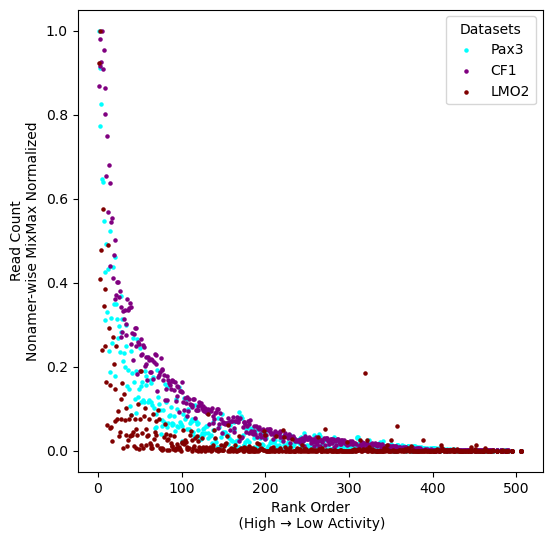

In [52]:
# Define the names of datasets to compare and their short names
datasets_to_compare = ['cf1_crypticnonamer', 'pax3_crypticnonamer', 'lmo2_crypticnonamer']
short_names = ['CF1', 'Pax3', 'LMO2']
cnon_colormap = {'cf1_crypticnonamer': 'purple', 'pax3_crypticnonamer': 'cyan', 'lmo2_crypticnonamer': 'maroon'}

# Adjust the display order by reordering these lists if needed
display_order = [1, 0, 2]  # For example, this will change the order to LMO2, CF1, Pax3

# Reorder the lists according to the desired display order
datasets_to_compare = [datasets_to_compare[i] for i in display_order]
short_names = [short_names[i] for i in display_order]

# Plotting scatter plots
fig, ax = plt.subplots(figsize=(6, 6))

# Plot for each dataset
for dataset_name, short_name in zip(datasets_to_compare, short_names):
    df = result_dataframes[dataset_name]
    ax.scatter(df['Average_RankOrder'], df['Normalized_Readcount'], label=short_name, color=cnon_colormap[dataset_name],s=5)

# Set labels and title
ax.set_xlabel('Rank Order\n (High → Low Activity)')
ax.set_ylabel('Read Count\nNonamer-wise MixMax Normalized')
#ax.set_title('Normalized Read Count by Average Rank Order')
ax.legend(title='Datasets')

plt.show()


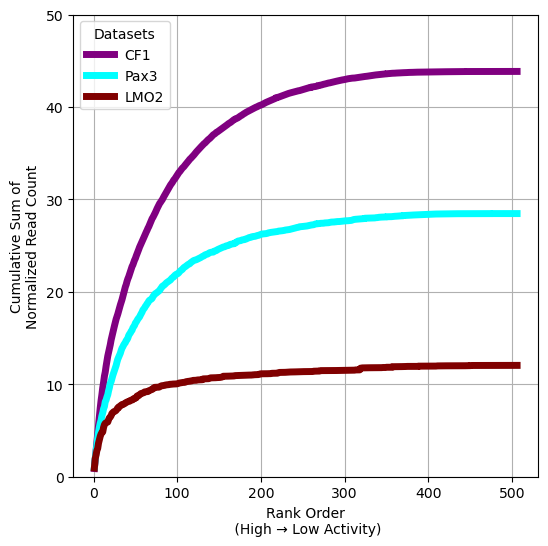

In [53]:
# Define the names of datasets to compare and their short names
datasets_to_compare = ['cf1_crypticnonamer', 'pax3_crypticnonamer', 'lmo2_crypticnonamer']
short_names = ['CF1', 'Pax3', 'LMO2']
cnon_colormap = {'cf1_crypticnonamer': 'purple', 'pax3_crypticnonamer': 'cyan', 'lmo2_crypticnonamer': 'maroon'}

# Calculate cumulative sums and plot them
fig, ax = plt.subplots(figsize=(6, 6))

for dataset_name, short_name in zip(datasets_to_compare, short_names):
    df = result_dataframes[dataset_name].sort_values('Average_RankOrder')
    df['Cumulative_Sum'] = df['Normalized_Readcount'].cumsum()
    ax.plot(df['Average_RankOrder'], df['Cumulative_Sum'], label=short_name, color=cnon_colormap[dataset_name], linewidth=5)  # Increase line thickness

# Set labels and title
ax.set_xlabel('Rank Order\n (High → Low Activity)')
ax.set_ylabel('Cumulative Sum of\nNormalized Read Count')
#ax.set_title('Cumulative Sum of Normalized Read Count\nby Average Rank Order')

# Adjust y-axis limits
ax.set_ylim(0, 50)  # Set a specific y-axis limit if desired, e.g., ax.set_ylim(0, 1)

# Add a grid
ax.grid(True)

# Add a legend with short names
ax.legend(title='Datasets')

plt.show()


# █████████████████████████████
# Comparing H4S2 and H4S2-cNon Models
# █████████████████████████████

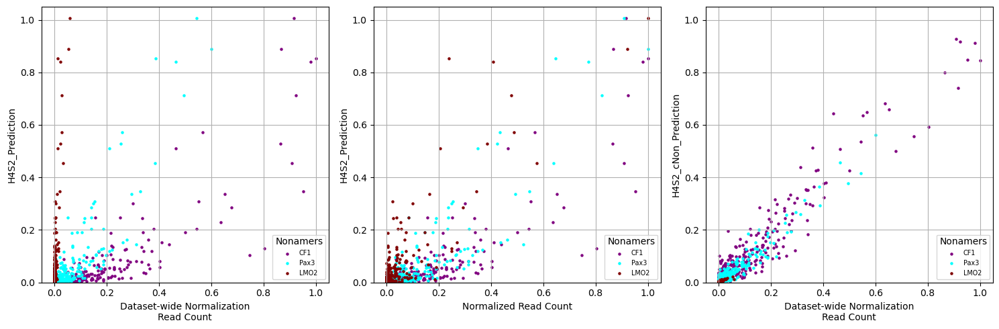

In [54]:
# Define the names of datasets to compare and their short names
datasets_to_compare = ['cf1_crypticnonamer', 'pax3_crypticnonamer', 'lmo2_crypticnonamer']
short_names = ['CF1', 'Pax3', 'LMO2']
cnon_colormap = {'cf1_crypticnonamer': 'purple', 'pax3_crypticnonamer': 'cyan', 'lmo2_crypticnonamer': 'maroon'}

# Adjust the display order by reordering these lists if needed
display_order = [0, 1, 2]  # Adjust display order if needed

# Reorder the lists according to the desired display order
datasets_to_compare = [datasets_to_compare[i] for i in display_order]
short_names = [short_names[i] for i in display_order]

# Plotting scatter plots in a grid of 3 across
fig, axs = plt.subplots(1, 3, figsize=(15, 5))


# Plot for Datasetwide_Normalization vs. H4S2_Prediction
for dataset_name, short_name in zip(datasets_to_compare, short_names):
    df = result_dataframes[dataset_name]
    axs[0].scatter(df['Datasetwide_Normalization'], df['H4S2_Prediction'], label=short_name, color=cnon_colormap[dataset_name], s=5)

axs[0].set_xlabel('Dataset-wide Normalization\nRead Count')
axs[0].set_ylabel('H4S2_Prediction')
#axs[0].set_title('H4S2 Model Performance\nDataset-wide Normalization')
axs[0].set_ylim(0,1.05)
axs[0].legend(title='Nonamers', loc= 'lower right', fontsize= 'x-small')
axs[0].grid(True)

# Plot for Normalized_Readcount vs. H4S2_Prediction
for dataset_name, short_name in zip(datasets_to_compare, short_names):
    df = result_dataframes[dataset_name]
    axs[1].scatter(df['Normalized_Readcount'], df['H4S2_Prediction'], label=short_name, color=cnon_colormap[dataset_name], s=5)

axs[1].set_xlabel('Normalized Read Count')
axs[1].set_ylabel('H4S2_Prediction')
#axs[1].set_title('H4S2 Model Performance\nNonamer-wise Normalization')
axs[1].set_ylim(0,1.05)
axs[1].legend(title='Nonamers', loc= 'lower right', fontsize= 'x-small')
axs[1].grid(True)

# Plot for Datasetwide_Normalization vs. H4S2_cNon_Prediction
for dataset_name, short_name in zip(datasets_to_compare, short_names):
    df = result_dataframes[dataset_name]
    axs[2].scatter(df['Datasetwide_Normalization'], df['H4S2_cNon_Prediction'], label=short_name, color=cnon_colormap[dataset_name], s=5)

axs[2].set_xlabel('Dataset-wide Normalization\nRead Count')
axs[2].set_ylabel('H4S2_cNon_Prediction')
#axs[2].set_title('H4S2_cNon Model Performance\nDataset-wide Normalization')
axs[2].set_ylim(0,1.05)
axs[2].legend(title='Nonamers', loc= 'lower right', fontsize= 'x-small')
axs[2].grid(True)

plt.tight_layout()
plt.show()

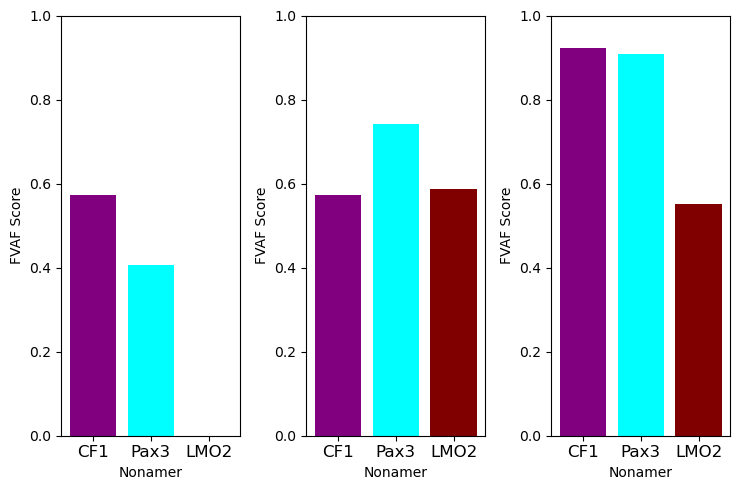

In [55]:
# Define the names of datasets to compare and their short names
datasets_to_compare = ['cf1_crypticnonamer', 'pax3_crypticnonamer', 'lmo2_crypticnonamer']
short_names = ['CF1', 'Pax3', 'LMO2']
cnon_colormap = {'cf1_crypticnonamer': 'purple', 'pax3_crypticnonamer': 'cyan', 'lmo2_crypticnonamer': 'maroon'}

# Combine all datasets to find the global min and max read counts
all_read_counts = pd.concat([result_dataframes[dataset]['Read count'] for dataset in datasets_to_compare])
global_min_readcount = all_read_counts.min()
global_max_readcount = all_read_counts.max()

# Normalize the Read count column using global min and max
for dataset_name in datasets_to_compare:
    result_dataframes[dataset_name]['Datasetwide_Normalization'] = (
        result_dataframes[dataset_name]['Read count'] - global_min_readcount
    ) / (global_max_readcount - global_min_readcount)

# Calculate FVAF scores for each panel
fvaf_scores_panel1 = []
fvaf_scores_panel2 = []
fvaf_scores_panel3 = []

for dataset_name in datasets_to_compare:
    dataset_df = result_dataframes[dataset_name]
    
    # Panel 1: FVAF score for Datasetwide_Normalization vs H4S2_Prediction
    actual_readcounts_panel1 = dataset_df['Datasetwide_Normalization']
    predicted_readcounts_panel1 = dataset_df['H4S2_Prediction']
    fvaf_score_panel1 = calculate_fvaf(actual_readcounts_panel1, predicted_readcounts_panel1)
    fvaf_scores_panel1.append(fvaf_score_panel1)
    
    # Panel 2: FVAF score for Normalized_Readcount vs H4S2_Prediction
    actual_readcounts_panel2 = dataset_df['Normalized_Readcount']
    predicted_readcounts_panel2 = dataset_df['H4S2_Prediction']
    fvaf_score_panel2 = calculate_fvaf(actual_readcounts_panel2, predicted_readcounts_panel2)
    fvaf_scores_panel2.append(fvaf_score_panel2)
    
    # Panel 3: FVAF score for Datasetwide_Normalization vs H4S2_cNon_Prediction
    actual_readcounts_panel3 = dataset_df['Datasetwide_Normalization']
    predicted_readcounts_panel3 = dataset_df['H4S2_cNon_Prediction']
    fvaf_score_panel3 = calculate_fvaf(actual_readcounts_panel3, predicted_readcounts_panel3)
    fvaf_scores_panel3.append(fvaf_score_panel3)

# Plotting code with subplots
fig, axs = plt.subplots(1, 3, figsize=(7.5, 5))

# Panel 1: FVAF score for Datasetwide_Normalization vs H4S2_Prediction
axs[0].bar(short_names, fvaf_scores_panel1, color=[cnon_colormap[dataset] for dataset in datasets_to_compare])
axs[0].set_ylim(0, 1)
axs[0].set_xlabel('Nonamer')
axs[0].set_ylabel('FVAF Score')
axs[0].tick_params(axis='x', labelsize=12) 
#axs[0].set_title('H4S2 Model Performance\nDataset-wide Normalization\n',fontsize=12)

axs[0].grid(False)

# Panel 2: FVAF score for Normalized_Readcount vs H4S2_Prediction
axs[1].bar(short_names, fvaf_scores_panel2, color=[cnon_colormap[dataset] for dataset in datasets_to_compare])
axs[1].set_ylim(0, 1)
axs[1].set_xlabel('Nonamer')
axs[1].set_ylabel('FVAF Score')
axs[1].tick_params(axis='x', labelsize=12) 
#axs[1].set_title('H4S2 Model Performance\nNonamer-wise Normalization\n',fontsize=12)
axs[1].grid(False)

# Panel 3: FVAF score for Datasetwide_Normalization vs H4S2_cNon_Prediction
axs[2].bar(short_names, fvaf_scores_panel3, color=[cnon_colormap[dataset] for dataset in datasets_to_compare])
axs[2].set_ylim(0, 1)
axs[2].set_xlabel('Nonamer')
axs[2].set_ylabel('FVAF Score')
axs[2].tick_params(axis='x', labelsize=12) 
#axs[2].set_title('H4S2_cNon Model Performance\nDataset-wide Normalization\n',fontsize=12)

axs[2].grid(False)

plt.tight_layout()
plt.show()

# ███████████████████
# H4S2-cNon SHAP Analysis
# ███████████████████

## • Position-wise SHAP values - H4S2-cNon model

PermutationExplainer explainer: 1537it [01:22, 16.37it/s]                          


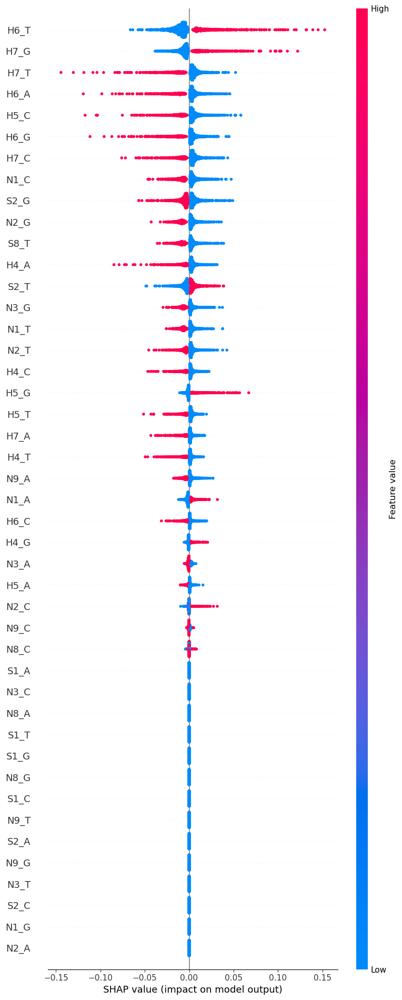

In [56]:
cnon_label_dict = {
    "Position_1_A": "H4_A",
    "Position_1_T": "H4_T",
    "Position_1_G": "H4_G",
    "Position_1_C": "H4_C",
    "Position_2_A": "H5_A",
    "Position_2_T": "H5_T",
    "Position_2_G": "H5_G",
    "Position_2_C": "H5_C",
    "Position_3_A": "H6_A",
    "Position_3_T": "H6_T",
    "Position_3_G": "H6_G",
    "Position_3_C": "H6_C",
    "Position_4_A": "H7_A",
    "Position_4_T": "H7_T",
    "Position_4_G": "H7_G",
    "Position_4_C": "H7_C",
    "Position_5_A": "S1_A",
    "Position_5_T": "S1_T",
    "Position_5_G": "S1_G",
    "Position_5_C": "S1_C",
    "Position_6_A": "S2_A",
    "Position_6_T": "S2_T",
    "Position_6_G": "S2_G",
    "Position_6_C": "S2_C",
    "Position_7_A": "N1_A",
    "Position_7_T": "N1_T",
    "Position_7_G": "N1_G",
    "Position_7_C": "N1_C",
    "Position_8_A": "N2_A",
    "Position_8_T": "N2_T",
    "Position_8_G": "N2_G",
    "Position_8_C": "N2_C",
    "Position_9_A": "N3_A",
    "Position_9_T": "N3_T",
    "Position_9_G": "N3_G",
    "Position_9_C": "N3_C",
    "Position_10_A": "N8_A",
    "Position_10_T": "S8_T",
    "Position_10_G": "N8_G",
    "Position_10_C": "N8_C",
    "Position_11_A": "N9_A",
    "Position_11_T": "N9_T",
    "Position_11_G": "N9_G",
    "Position_11_C": "N9_C"
}

# Map sequence_labels to more descriptive labels from label_dict
cnon_descriptive_labels = [cnon_label_dict.get(label, label) for label in cnon_sequence_labels]

# Convert X to numpy array
X_np = np.array(cnon_sequences)

# Explain model predictions using SHAP
explainer = shap.Explainer(H4S2_cNon_model, X_np)
cnon_shap_values = explainer.shap_values(X_np)

# Plot SHAP summary plot
shap.summary_plot(cnon_shap_values, X_np, feature_names=cnon_descriptive_labels, max_display=np.shape(X_np)[1])

## • H4S2-cNon SHAP values Grouped by Nonamer

In [57]:
# Compute the mean absolute SHAP values for each feature across all sequences
cnon_feature_importances = np.abs(shap_values).mean(axis=0)

# Get the feature order from highest to lowest importance
cnon_feature_order = np.argsort(cnon_feature_importances)[::1]

# Now you can use feature_order for further analysis or plotting
print("Feature order:", cnon_feature_order)

# Assuming 'descriptive_labels' is a list containing the labels
cnon_ordered_labels = [cnon_descriptive_labels[i] for i in cnon_feature_order]

# Now 'ordered_labels' contains the descriptive labels ordered by feature importance
print("Ordered labels:", cnon_ordered_labels)

Feature order: [16  6  4 12 17  1  2  0 11 20 23  5 19  3 22 18 21  8 14 15 13 10  7  9]
Ordered labels: ['S1_A', 'H5_G', 'H5_A', 'H7_A', 'S1_T', 'H4_T', 'H4_G', 'H4_A', 'H6_C', 'S2_A', 'S2_C', 'H5_T', 'S1_C', 'H4_C', 'S2_G', 'S1_G', 'S2_T', 'H6_A', 'H7_G', 'H7_C', 'H7_T', 'H6_G', 'H5_C', 'H6_T']


In [58]:
# Assuming 'S1_G' is one of the features in your descriptive_labels
n1_a_index = cnon_descriptive_labels.index('N1_A')
n1_c_index = cnon_descriptive_labels.index('N1_C')
n1_t_index = cnon_descriptive_labels.index('N1_T')

# Create masks for sequences with 'S1_G' values of 0 and 1
n1_a_mask_1 = X_np[:, n1_a_index] == 1
n1_c_mask_1 = X_np[:, n1_c_index] == 1
n1_t_mask_1 = X_np[:, n1_t_index] == 1

# Create SHAP value subsets
shap_values_n1_a = cnon_shap_values[n1_a_mask_1]
shap_values_n1_c = cnon_shap_values[n1_c_mask_1]
shap_values_n1_t = cnon_shap_values[n1_t_mask_1]

# Filter feature array with masks
sequences_n1_a = X_np[n1_a_mask_1]
sequences_n1_c = X_np[n1_c_mask_1]
sequences_n1_t = X_np[n1_t_mask_1]

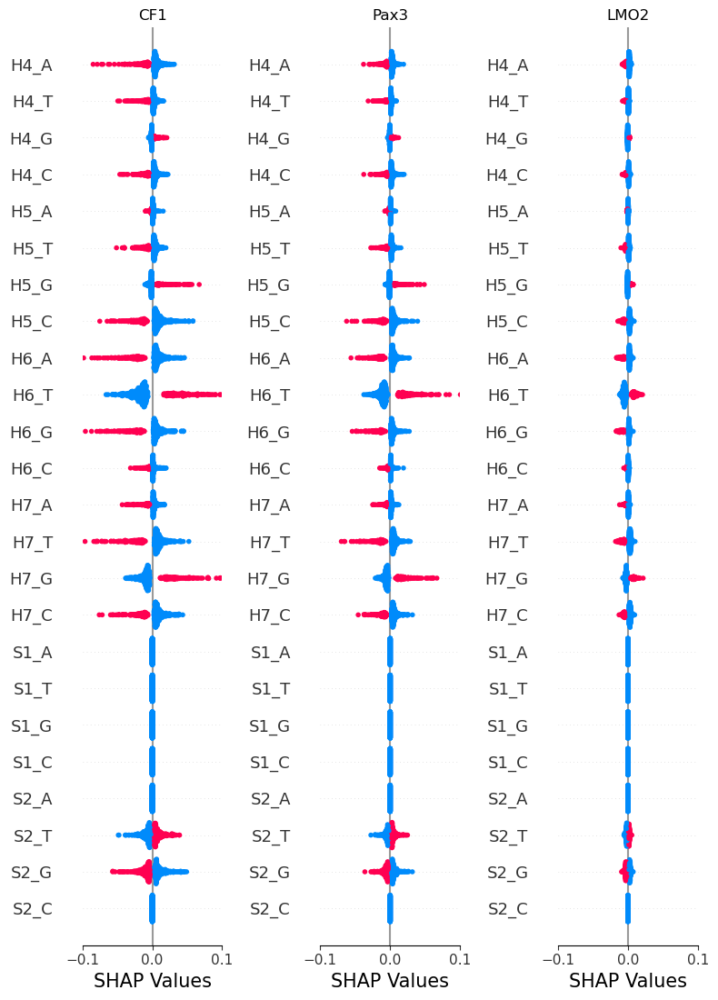

In [59]:
# Define the SHAP values and sequences for each dataset
shap_values_cf1 = shap_values_n1_a
sequences_cf1 = sequences_n1_a

shap_values_pax3 = shap_values_n1_c
sequences_pax3 = sequences_n1_c

shap_values_lmo2 = shap_values_n1_t
sequences_lmo2 = sequences_n1_t

# Define the descriptive labels for the features in the correct order
cnon_ordered_labels = ['N3_C', 'N2_A', 'S1_T', 'S2_C', 'N3_T', 'N1_G', 'N8_A', 'S1_A', 'N8_G', 'S1_C', 'S2_A', 'N9_G', 'N9_T', 'S1_G', 'N9_C', 'N3_A', 'H6_C', 'N1_A', 'H4_G', 'N8_C', 'H7_A', 'N1_T', 'N2_C', 'H5_A', 'H5_G', 'S2_T', 'H4_T', 'S8_T', 'H4_C', 'N2_G', 'N9_A', 'H5_T', 'N3_G', 'N2_T', 'H4_A', 'N1_C', 'H7_C', 'H6_G', 'H6_A', 'S2_G', 'H7_T', 'H5_C', 'H7_G', 'H6_T']

# Create subplots
plt.figure(figsize=(15, 5))

# Plot for CF1
plt.subplot(1, 3, 1)
shap.summary_plot(
    shap_values_cf1, 
    sequences_cf1, 
    feature_names=cnon_descriptive_labels, 
    sort=False, 
    #max_display=len(cnon_descriptive_labels),
    max_display=24,
    plot_type='dot', 
    color_bar=False, 
    show=False
)
plt.title('CF1')
plt.xlim(-0.1, 0.1)
plt.xlabel("SHAP Values", fontsize=fontsize)

# Plot for Pax3
plt.subplot(1, 3, 2)
shap.summary_plot(
    shap_values_pax3, 
    sequences_pax3, 
    feature_names=cnon_descriptive_labels, 
    sort=False, 
    #max_display=len(cnon_descriptive_labels),
    max_display=24,
    plot_type='dot', 
    color_bar=False, 
    show=False
)
plt.title('Pax3')
plt.xlim(-0.1, 0.1)
plt.xlabel("SHAP Values", fontsize=fontsize)

# Plot for LMO2
plt.subplot(1, 3, 3)
shap.summary_plot(
    shap_values_lmo2, 
    sequences_lmo2, 
    feature_names=cnon_descriptive_labels, 
    sort=False, 
    #max_display=len(cnon_descriptive_labels),
    max_display=24,
    plot_type='dot', 
    color_bar=False, 
    show=False
)
plt.title('LMO2')
plt.xlim(-0.1, 0.1)
plt.xlabel("SHAP Values", fontsize=fontsize)


# Show the plot
plt.tight_layout()
plt.show()


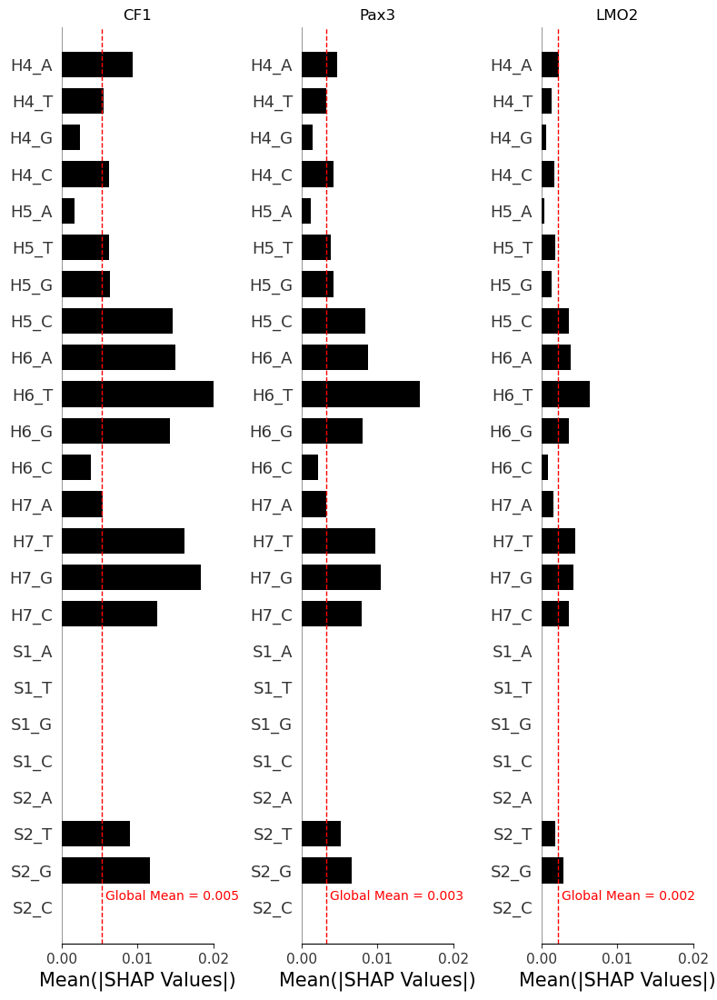

In [60]:
# Define the SHAP values and sequences for each dataset
shap_values_cf1 = shap_values_n1_a
sequences_cf1 = sequences_n1_a

shap_values_pax3 = shap_values_n1_c
sequences_pax3 = sequences_n1_c

shap_values_lmo2 = shap_values_n1_t
sequences_lmo2 = sequences_n1_t

# Define the descriptive labels for the features in the correct order
cnon_ordered_labels = ['N3_C', 'N2_A', 'S1_T', 'S2_C', 'N3_T', 'N1_G', 'N8_A', 'S1_A', 'N8_G', 'S1_C', 'S2_A', 'N9_G', 'N9_T', 'S1_G', 'N9_C', 'N3_A', 'H6_C', 'N1_A', 'H4_G', 'N8_C', 'H7_A', 'N1_T', 'N2_C', 'H5_A', 'H5_G', 'S2_T', 'H4_T', 'S8_T', 'H4_C', 'N2_G', 'N9_A', 'H5_T', 'N3_G', 'N2_T', 'H4_A', 'N1_C', 'H7_C', 'H6_G', 'H6_A', 'S2_G', 'H7_T', 'H5_C', 'H7_G', 'H6_T']

# Create subplots
plt.figure(figsize=(15, 5))

# Plot for CF1
plt.subplot(1, 3, 1)
shap.summary_plot(
    shap_values_cf1, 
    sequences_cf1, 
    feature_names=cnon_descriptive_labels, 
    sort=False, 
    #max_display=len(cnon_descriptive_labels),
    max_display=24,
    plot_type='bar',
    color='black',
    color_bar=False, 
    show=False
)
plt.title('CF1')
plt.xlim(0, 0.02)
plt.xlabel("Mean(|SHAP Values|)", fontsize=fontsize)

# Add vertical line at global average
global_avg_cf1 = np.mean(abs(shap_values_cf1))
plt.axvline(x=global_avg_cf1, color='r', linestyle='--', linewidth=1)
plt.text(global_avg_cf1 + 0.0005, 0.3, f'Global Mean = {global_avg_cf1:.3f}', color='red', fontsize=10, va='center', ha='left')



# Plot for Pax3
plt.subplot(1, 3, 2)
shap.summary_plot(
    shap_values_pax3, 
    sequences_pax3, 
    feature_names=cnon_descriptive_labels, 
    sort=False, 
    #max_display=len(cnon_descriptive_labels),
    max_display=24,
    plot_type='bar',
    color='black',
    color_bar=False, 
    show=False
)
plt.title('Pax3')
plt.xlim(0, 0.02)
plt.xlabel("Mean(|SHAP Values|)", fontsize=fontsize)

# Add vertical line at global average
global_avg_pax3 = np.mean(abs(shap_values_pax3))
plt.axvline(x=global_avg_pax3, color='r', linestyle='--', linewidth=1)
plt.text(global_avg_pax3 + 0.0005, 0.3, f'Global Mean = {global_avg_pax3:.3f}', color='red', fontsize=10, va='center', ha='left')


# Plot for LMO2
plt.subplot(1, 3, 3)
shap.summary_plot(
    shap_values_lmo2, 
    sequences_lmo2, 
    feature_names=cnon_descriptive_labels, 
    sort=False, 
    #max_display=len(cnon_descriptive_labels),
    max_display=24,
    plot_type='bar',
    color='black',
    color_bar=False, 
    show=False
)
plt.title('LMO2')
plt.xlim(0, 0.02)
plt.xlabel("Mean(|SHAP Values|)", fontsize=fontsize)


# Add vertical line at global average
global_avg_lmo2 = np.mean(abs(shap_values_lmo2))
plt.axvline(x=global_avg_lmo2, color='r', linestyle='--', linewidth=1)
plt.text(global_avg_lmo2 + 0.0005, 0.3, f'Global Mean = {global_avg_lmo2:.3f}', color='red', fontsize=10, va='center', ha='left')


# Show the plot
plt.tight_layout()
plt.show()


## • Nonamer-wise Normalized H4S2-cNon SHAP values

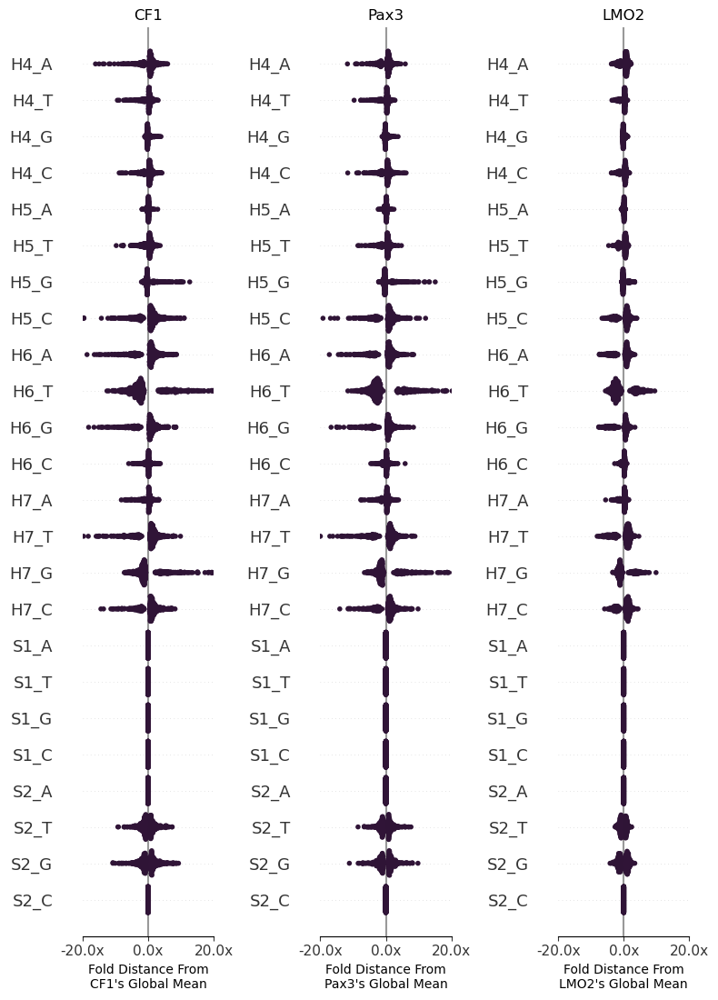

In [61]:
def normalize_by_abs_mean(shap_values):
    abs_mean_shap = np.abs(shap_values).mean()
    normalized_shap = shap_values / abs_mean_shap
    return normalized_shap

# Define the SHAP values and sequences for each dataset
shap_values_cf1 = normalize_by_abs_mean(shap_values_n1_a)
sequences_cf1 = sequences_n1_a

shap_values_pax3 = normalize_by_abs_mean(shap_values_n1_c)
sequences_pax3 = sequences_n1_c

shap_values_lmo2 = normalize_by_abs_mean(shap_values_n1_t)
sequences_lmo2 = sequences_n1_t

# Create subplots
plt.figure(figsize=(15, 5))

# Plot for CF1
plt.subplot(1, 3, 1)
shap.summary_plot(
    shap_values_cf1, 
    sequences_cf1, 
    feature_names=cnon_descriptive_labels, 
    sort=False, 
    #max_display=len(cnon_descriptive_labels),
    max_display=24,
    plot_type='dot',
    cmap=plt.get_cmap(("twilight_shifted")),
    color_bar=False, 
    show=False
)
plt.title('CF1')
plt.xlim(-20, 20)
plt.xlabel('Fold Distance From\nCF1\'s Global Mean', size=10)

# Customize x-axis labels with suffix
formatter = FuncFormatter(lambda x, _: f'{x:.1f}x')
plt.gca().xaxis.set_major_formatter(formatter)


# Plot for Pax3
plt.subplot(1, 3, 2)
shap.summary_plot(
    shap_values_pax3, 
    sequences_pax3, 
    feature_names=cnon_descriptive_labels, 
    sort=False, 
    #max_display=len(cnon_descriptive_labels),
    max_display=24,
    plot_type='dot', 
    cmap=plt.get_cmap(("twilight_shifted")),
    color_bar=False, 
    show=False
)
plt.title('Pax3')
plt.xlim(-20, 20)
plt.xlabel('Fold Distance From\nPax3\'s Global Mean', size=10)

# Customize x-axis labels with suffix
formatter = FuncFormatter(lambda x, _: f'{x:.1f}x')
plt.gca().xaxis.set_major_formatter(formatter)


# Plot for LMO2
plt.subplot(1, 3, 3)
shap.summary_plot(
    shap_values_lmo2, 
    sequences_lmo2, 
    feature_names=cnon_descriptive_labels, 
    sort=False, 
    #max_display=len(cnon_descriptive_labels),
    max_display=24,
    plot_type='dot',
    cmap=plt.get_cmap(("twilight_shifted")),
    color_bar=False, 
    show=False
)
plt.title('LMO2')
plt.xlim(-20, 20)
plt.xlabel('Fold Distance From\nLMO2\'s Global Mean', size=10)

# Customize x-axis labels with suffix
formatter = FuncFormatter(lambda x, _: f'{x:.1f}x')
plt.gca().xaxis.set_major_formatter(formatter)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

## • KS-test - long-distant second order interactions

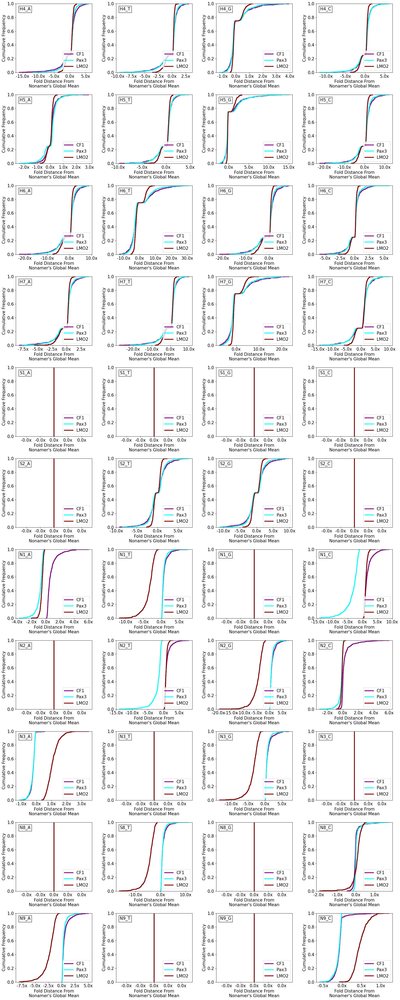

In [62]:
# Reset the font size if needed
plt.rcParams.update({'font.size': 15})

# Define the SHAP values for each dataset
# shap_values_cf1 = shap_values_n1_a
# shap_values_pax3 = shap_values_n1_c
# shap_values_lmo2 = shap_values_n1_t

# Function to perform KS test and store results
def ks_test_between_datasets(shap_values_1, shap_values_2):
    num_features = shap_values_1.shape[1]
    ks_results = {}
    for i in range(num_features):
        feature_shap_values_1 = shap_values_1[:, i]
        feature_shap_values_2 = shap_values_2[:, i]
        ks_stat, p_value = ks_2samp(feature_shap_values_1, feature_shap_values_2)
        ks_results[cnon_descriptive_labels[i]] = (ks_stat, p_value)
    return ks_results

# Initialize a dictionary to store KS test results for each feature
ks_results_dict = {feature: {} for feature in cnon_descriptive_labels}

# Define datasets
cnon_datasets = [
    (shap_values_cf1, "CF1"),
    (shap_values_pax3, "Pax3"),
    (shap_values_lmo2, "LMO2")
]

# Perform KS test for each pair of datasets and store the results
for i in range(len(cnon_datasets)):
    for j in range(i + 1, len(cnon_datasets)):
        dataset_1, name_1 = cnon_datasets[i]
        dataset_2, name_2 = cnon_datasets[j]
        comparison_name = f"{name_1} vs {name_2}"
        ks_results = ks_test_between_datasets(dataset_1, dataset_2)
        for feature, (ks_stat, p_value) in ks_results.items():
            ks_results_dict[feature][comparison_name] = (ks_stat, p_value)

# Create a DataFrame from the ks_results_dict
ks_results_df = pd.DataFrame(ks_results_dict).T

# Reorder the columns
ks_results_df = ks_results_df[['CF1 vs Pax3', 'Pax3 vs LMO2', 'CF1 vs LMO2']]

# Extract only the KS statistics for visualization
ks_stats_df = ks_results_df.applymap(lambda x: x[0] if isinstance(x, tuple) else np.nan)

# Function to plot cumulative frequency distributions
def plot_cumulative_distribution(shap_values_list, group_names, colors, feature_label, ax):
    try:
        for shap_values, group_name, color in zip(shap_values_list, group_names, colors):
            sns.ecdfplot(shap_values.flatten(), label=group_name, color=color, ax=ax, linewidth=3)
        
        #ax.set_title(f'Cumulative Distribution for {feature_label}')
        ax.set_xlabel('Fold Distance From\nNonamer\'s Global Mean')
        ax.set_ylabel('Cumulative Frequency')
        # Add dataset name label in the upper left corner
        ax.text(0.05, 0.95, feature_label, transform=ax.transAxes, fontsize=15,
                     verticalalignment='top', bbox=dict(facecolor='white', alpha=1))
        
        # Customize x-axis labels with suffix
        formatter = FuncFormatter(lambda x, _: f'{x:.1f}x')
        ax.xaxis.set_major_formatter(formatter)
        
        ax.legend(loc='lower right')
    except Exception as e:
        print(f"Error in plotting: {e}")

# Define group names and colors
group_names = ['CF1', 'Pax3', 'LMO2']
colors = ['purple', 'cyan', 'maroon']

# Calculate the number of rows and columns for the grid
num_features = len(cnon_descriptive_labels)
num_cols = 4
num_rows = (num_features + num_cols - 1) / num_cols

# Create a figure with a dynamic grid of subplots
fig, axes = plt.subplots(int(num_rows), num_cols, figsize=(20, int(num_rows) * 4.5))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

# Plot cumulative distributions for each feature in the grid
for idx, feature_label in enumerate(cnon_descriptive_labels):
    #print(f"Analyzing feature: {feature_label}")

    # Initialize lists to store SHAP values for the current feature
    shap_values_cf1_feature = shap_values_cf1[:, cnon_descriptive_labels.index(feature_label)]
    shap_values_pax3_feature = shap_values_pax3[:, cnon_descriptive_labels.index(feature_label)]
    shap_values_lmo2_feature = shap_values_lmo2[:, cnon_descriptive_labels.index(feature_label)]

    shap_values_list = [shap_values_cf1_feature, shap_values_pax3_feature, shap_values_lmo2_feature]

    # Determine the row and column index for the current subplot
    row_idx = idx // num_cols
    col_idx = idx % num_cols

    # Plot cumulative distributions for the current feature
    plot_cumulative_distribution(shap_values_list, group_names, colors, feature_label, axes[row_idx, col_idx])

# Adjust layout and display the combined plot
plt.tight_layout()
plt.show()

# Reset the font size if needed
plt.rcParams.update({'font.size': 10})

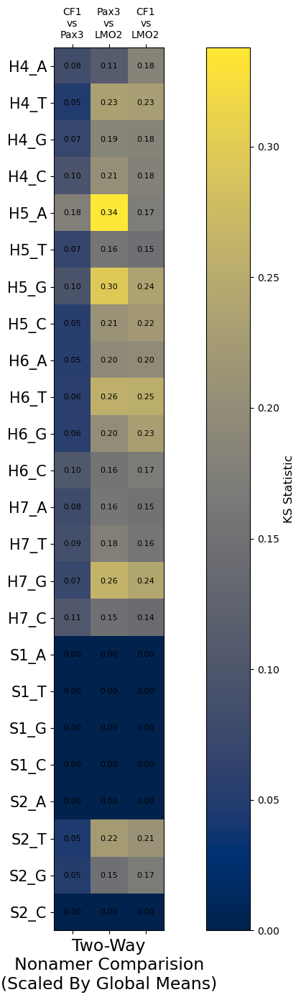

In [63]:
# Define the SHAP values datasets and their names
cnon_datasets = [(shap_values_cf1, "CF1"), (shap_values_pax3, "Pax3"), (shap_values_lmo2, "LMO2")]

# Function to perform KS test and store results
def ks_test_between_datasets(shap_values_1, shap_values_2):
    num_features = shap_values_1.shape[1]
    ks_results = {}
    for i in range(num_features):
        feature_shap_values_1 = shap_values_1[:, i]
        feature_shap_values_2 = shap_values_2[:, i]
        ks_stat, p_value = ks_2samp(feature_shap_values_1, feature_shap_values_2)
        ks_results[cnon_descriptive_labels[i]] = (ks_stat, p_value)
    return ks_results

# Initialize a dictionary to store KS test results for each feature
ks_results_dict = {feature: {} for feature in cnon_descriptive_labels}

# Perform KS test for each pair of datasets and store the results
for i in range(len(cnon_datasets)):
    for j in range(i + 1, len(cnon_datasets)):
        dataset_1, name_1 = cnon_datasets[i]
        dataset_2, name_2 = cnon_datasets[j]
        comparison_name = f"{name_1} vs {name_2}"
        ks_results = ks_test_between_datasets(dataset_1, dataset_2)
        for feature, (ks_stat, p_value) in ks_results.items():
            ks_results_dict[feature][comparison_name] = (ks_stat, p_value)

# Create a DataFrame from the ks_results_dict
ks_results_df = pd.DataFrame(ks_results_dict).T

# Reorder the columns
ks_results_df = ks_results_df[['CF1 vs Pax3', 'Pax3 vs LMO2', 'CF1 vs LMO2']]

# Extract only the KS statistics for visualization
ks_stats_df = ks_results_df.applymap(lambda x: x[0] if isinstance(x, tuple) else np.nan)

# Create a heatmap using Matplotlib for the first 24 rows
fig, ax = plt.subplots(figsize=(12, 14))
cax = ax.matshow(ks_stats_df.iloc[:24], cmap='cividis')

# Add color bar
cbar = fig.colorbar(cax)
cbar.set_label('KS Statistic', fontsize=12)

# Set axis labels
ax.set_xticks(np.arange(len(ks_stats_df.columns)))
ax.set_xticklabels(ks_stats_df.columns, rotation=90, fontsize=10)
ax.set_yticks(np.arange(len(ks_stats_df.index[:24])))
ax.set_yticklabels(ks_stats_df.index[:24], fontsize=10)

# Set axis labels with line breaks and rotation
ax.set_xticks(np.arange(len(ks_stats_df.columns)))
ax.set_xticklabels([col.replace(' ', '\n') for col in ks_stats_df.columns], rotation=00, fontsize=10, ha='center')
ax.set_yticks(np.arange(len(ks_stats_df.index[:24])))
ax.set_yticklabels(ks_stats_df.index[:24], fontsize=15)

# Annotate each cell with the numeric value
for (i, j), val in np.ndenumerate(ks_stats_df.iloc[:24].values):
    ax.text(j, i, f'{val:.2f}', ha='center', va='center', fontsize=8)

# Set the title and labels
#plt.title('KS Test Statistics for Dataset Comparisons (First 24 Features)', fontsize=14)
plt.xlabel('Two-Way\nNonamer Comparision\n(Scaled By Global Means)', fontsize=17)
#plt.ylabel('Features', fontsize=12)

# Show the plot
plt.tight_layout()
plt.show()